<a href="https://colab.research.google.com/github/Twenkid/Colab-Notebooks-AI-ML-CV/blob/main/Optimization_18_11_2024_random_search_simulated_annealing_non_linear.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/taspinar/siml/

Cloning into 'siml'...
remote: Enumerating objects: 408, done.
remote: Counting objects: 100% (26/26), done.
remote: Compressing objects: 100% (17/17), done.
remote: Total 408 (delta 10), reused 23 (delta 9), pack-reused 382 (from 1)
Receiving objects: 100% (408/408), 36.18 MiB | 12.61 MiB/s, done.
Resolving deltas: 100% (196/196), done.
Updating files: 100% (62/62), done.


In [ ]:
from collections import Counter, defaultdict
from evaluators import *
import load_data as ld
import numpy as np

class NaiveBaseClass:
    def calculate_relative_occurences(self, list1):
        no_examples = len(list1)
        ro_dict = dict(Counter(list1))
        for key in ro_dict.keys():
            ro_dict[key] = ro_dict[key] / float(no_examples)
        return ro_dict

    def get_max_value_key(self, d1):
        values = list(d1.values())
        keys = list(d1.keys())
        max_value_index = values.index(max(values))
        max_key = keys[max_value_index]
        return max_key

    def initialize_nb_dict(self):
        self.nb_dict = {}
        for label in self.labels:
            self.nb_dict[label] = defaultdict(list)

class NaiveBayes(NaiveBaseClass):
    """
    Naive Bayes Classifier:
    It is trained with a 2D-array X (dimensions m,n) and a 1D array Y (dimension 1,n).
    X should have one column per feature (total m) and one row per training example (total n).
    After training a dictionary is filled with the class probabilities per feature.
    """
    def train(self, X, Y):
        self.labels = np.unique(Y)
        no_rows, no_cols = np.shape(X)
        self.initialize_nb_dict()
        self.class_probabilities = self.calculate_relative_occurences(Y)
        #fill self.nb_dict with the feature values per class
        for label in self.labels:
            row_indices = np.where(Y == label)[0]
            X_ = X[row_indices, :]
            no_rows_, no_cols_ = np.shape(X_)
            for jj in range(0,no_cols_):
                self.nb_dict[label][jj] += list(X_[:,jj])
        #transform the dict which contains lists with all feature values
        #to a dict with relative feature value occurences per class
        for label in self.labels:
            for jj in range(0,no_cols):
                self.nb_dict[label][jj] = self.calculate_relative_occurences(self.nb_dict[label][jj])

    def classify_single_elem(self, X_elem):
        Y_dict = {}
        for label in self.labels:
            class_probability = self.class_probabilities[label]
            for ii in range(0,len(X_elem)):
              relative_feature_values = self.nb_dict[label][ii]
              if X_elem[ii] in relative_feature_values.keys():
                class_probability *= relative_feature_values[X_elem[ii]]
              else:
                class_probability *= 0
            Y_dict[label] = class_probability
        return self.get_max_value_key(Y_dict)

    def classify(self, X):
        self.predicted_Y_values = []
        no_rows, no_cols = np.shape(X)
        for ii in range(0,no_rows):
            X_elem = X[ii,:]
            prediction = self.classify_single_elem(X_elem)
            self.predicted_Y_values.append(prediction)
        return self.predicted_Y_values


class NaiveBayesText(NaiveBaseClass):
    """"
    When the goal is classifying text, it is better to give the input X in the form of a list of lists containing words.
    X = [
    ['this', 'is', 'a',...],
    (...)
    ]
    Y still is a 1D array / list containing the labels of each entry
    """
    def initialize_nb_dict(self):
        self.nb_dict = {}
        for label in self.labels:
            self.nb_dict[label] = []

    def train(self, X, Y):
        self.class_probabilities = self.calculate_relative_occurences(Y)
        self.labels = np.unique(Y)
        self.no_examples = len(Y)
        self.initialize_nb_dict()
        for ii in range(0,len(Y)):
            label = Y[ii]
            self.nb_dict[label] += X[ii]
        #transform the list with all occurences to a dict with relative occurences
        for label in self.labels:
            self.nb_dict[label] = self.calculate_relative_occurences(self.nb_dict[label])

    def classify_single_elem(self, X_elem):
        Y_dict = {}
        for label in self.labels:
            class_probability = self.class_probabilities[label]
            nb_dict_features = self.nb_dict[label]
            for word in X_elem:
                if word in nb_dict_features.keys():
                    relative_word_occurence = nb_dict_features[word]
                    class_probability *= relative_word_occurence
                else:
                    class_probability *= 0
            Y_dict[label] = class_probability
        return self.get_max_value_key(Y_dict)

    def classify(self, X):
        self.predicted_Y_values = []
        n = len(X)
        for ii in range(0,n):
            X_elem = X[ii]
            prediction = self.classify_single_elem(X_elem)
            self.predicted_Y_values.append(prediction)
        return self.predicted_Y_values

####

X_train = [ ['кур', 'хуй', 'путка'], ["любов", "красиво", "прекрасно"], ["любов", "красиво", "погалвам"]]
Y_train = ["вулгарно", "деликатно", "деликатно"]
X_test = [ ['кур', 'кола', 'самолет'], ["любов", "красиво", "прекрасно"]] # ["шибам", "еба", "летя"]]
Y_test = ["вулгарно", "деликатно"]

X_train = [ ['6502', '6800', 'Pentium'], ["GTX580", "750Ti", "Radeon"], ["8086", "486", "Intel"], [ "Radeon", "video", "ATI"]]
Y_train = ["CPU", "GPU", "CPU", "GPU"]
X_test = [ ['6502', '486', 'Intel'], ["Intel", "6800", "6502"], ["ATI", "Radeon", "video"]] # ["шибам", "еба", "летя"]]
Y_test = ["CPU", "CPU", "GPU"]



print(X_train,Y_train,X_test,Y_test)
#X_train, Y_train, X_test, Y_test = ld.amazon_reviews()
print("training naive bayes")
nbc = NaiveBayesText()
nbc.train(X_train, Y_train)
print("trained")
predicted_Y = nbc.classify(X_test[:100])
y_labels = np.unique(Y_test)
for y_label in y_labels:
    f1 = f1_score(predicted_Y, Y_test, y_label)
    print("F1-score on the test-set for class %s is: %s" % (y_label, f1))
predicted_Y = nbc.classify(X_test)
print("PREDICT:", predicted_Y)


X_train, Y_train, X_test, Y_test = ld.adult()
print("training naive bayes")
nbc = NaiveBayes()
nbc.train(X_train, Y_train)
print("trained")
predicted_Y = nbc.classify(X_test)
print("ПРЕДИКТЕД:", predicted_Y)
y_labels = np.unique(Y_test)
for y_label in y_labels:
    f1 = f1_score(predicted_Y, Y_test, y_label)
    print("F1-score on the test-set for class %s is: %s" % (y_label, f1))

[['6502', '6800', 'Pentium'], ['GTX580', '750Ti', 'Radeon'], ['8086', '486', 'Intel'], ['Radeon', 'video', 'ATI']] ['CPU', 'GPU', 'CPU', 'GPU'] [['6502', '486', 'Intel'], ['Intel', '6800', '6502'], ['ATI', 'Radeon', 'video']] ['CPU', 'CPU', 'GPU']
training naive bayes
trained
F1-score on the test-set for class CPU is: 1.0
F1-score on the test-set for class GPU is: 1.0
PREDICT: ['CPU', 'CPU', 'GPU']
training naive bayes
trained
ПРЕДИКТЕД: [' <=50K', ' >50K', ' >50K', ' >50K', ' <=50K', ' <=50K', ' <=50K', ' >50K', ' <=50K', ' <=50K', ' >50K', ' >50K', ' <=50K', ' <=50K', ' >50K', ' >50K', ' <=50K', ' <=50K', ' <=50K', ' >50K', ' >50K', ' <=50K', ' <=50K', ' <=50K', ' >50K', ' >50K', ' <=50K', ' <=50K', ' <=50K', ' <=50K', ' >50K', ' <=50K', ' <=50K', ' <=50K', ' <=50K', ' <=50K', ' >50K', ' <=50K', ' <=50K', ' <=50K', ' >50K', ' >50K', ' <=50K', ' <=50K', ' <=50K', ' <=50K', ' <=50K', ' <=50K', ' <=50K', ' <=50K', ' <=50K', ' <=50K', ' <=50K', ' >50K', ' <=50K', ' <=50K', ' <=50K', ' >5

In [ ]:
%cd siml    #%cd siml

/content/siml


In [ ]:
%cd siml

/content/siml/siml


In [ ]:
#11-2-2025
import numpy as np
import scipy.linalg
import matplotlib.pyplot as plt

# System dynamics matrices
A = np.array([[0, 1], [0, 0]])  # State-space representation
B = np.array([[0], [1]])  # Control input

# LQR cost matrices
Q = np.array([[10, 0], [0, 1]])  # Penalizes position error
R = np.array([[0.1]])  # Penalizes control effort

# Solve Riccati equation for optimal control gain K
P = scipy.linalg.solve_continuous_are(A, B, Q, R)
K = np.linalg.inv(R) @ B.T @ P

# Simulation parameters
x = np.array([[2.], [0.]])  # Initial state (position=2, velocity=0)
dt = 0.1
time = np.arange(0, 10, dt)
x_history = []

for t in time:
    u = -K @ x  # Optimal control law
    x_dot = A @ x + B @ u  # State update
    x += x_dot * dt
    x_history.append(x[0, 0])  # Store position

# Plot results
plt.plot(time, x_history, label="Position")
plt.axhline(y=0, color='r', linestyle='--', label="Target")
plt.xlabel("Time (s)")
plt.ylabel("Position")
plt.legend()
plt.title("Optimal Control (LQR) - Robotic Arm Position Control")
plt.grid()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# System parameters
g = 9.81  # gravity
l = 1.0   # pendulum length
m = 1.0   # pendulum mass
dt = 0.01  # time step

# Sliding mode parameters
lambda_smc = 2
k_smc = 5

# Simulation parameters
theta = 0.2  # Initial angle (rad)
theta_dot = 0  # Initial angular velocity

# Disturbance function
def disturbance(t):
    return 0.5 * np.sin(2 * np.pi * 0.5 * t)  # A sinusoidal disturbance

# Sliding Mode Control Simulation
time = np.arange(0, 10, dt)
theta_history = []

for t in time:
    s = theta_dot + lambda_smc * theta  # Sliding surface
    u = -k_smc * np.sign(s)  # SMC control law
    u += disturbance(t)  # Add disturbance

    # System dynamics (Euler integration)
    theta_ddot = (g / l) * np.sin(theta) + (1 / (m * l**2)) * u
    theta_dot += theta_ddot * dt
    theta += theta_dot * dt

    theta_history.append(theta)

# Plot results
plt.plot(time, theta_history)
plt.xlabel("Time (s)")
plt.ylabel("Pendulum Angle (rad)")
plt.title("Robust Sliding Mode Control (SMC) - Inverted Pendulum")
plt.grid()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# True system parameters
b = 50  # Drag coefficient
m_true = 1000  # True mass (unknown to controller)
v_ref = 20  # Desired velocity

# Adaptive control parameters
gamma = 0.01  # Adaptation gain
m_hat = 500  # Initial estimated mass
dt = 0.1  # Time step

# Initialize variables
v = 0  # Initial velocity
time = np.arange(0, 50, dt)
v_history = []
m_hat_history = []

for t in time:
    e = v - v_ref  # Tracking error
    u = m_hat * (10 - b * v)  # Control input (based on estimated mass)
    v_dot = (u - b * v) / m_true  # True system dynamics
    v += v_dot * dt  # Update velocity

    m_hat -= gamma * v * e * dt  # Adaptive law

    # Store data for plotting
    v_history.append(v)
    m_hat_history.append(m_hat)

# Plot results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(time, v_history, label="Velocity")
plt.axhline(y=v_ref, color='r', linestyle='--', label="Reference")
plt.xlabel("Time (s)")
plt.ylabel("Velocity (m/s)")
plt.legend()
plt.grid()

plt.subplot(1, 2, 2)
plt.plot(time, m_hat_history, label="Estimated Mass")
plt.axhline(y=m_true, color='r', linestyle='--', label="True Mass")
plt.xlabel("Time (s)")
plt.ylabel("Estimated Mass (kg)")
plt.legend()
plt.grid()

plt.suptitle("Adaptive Control: Cruise Control with Unknown Mass")
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import Rbf

# Generate training data
x_train = np.linspace(-5, 5, 15)
y_train = np.sin(x_train) + 0.1 * np.random.randn(15)  # Sinusoidal function with noise

# RBF Interpolation
rbf = Rbf(x_train, y_train, function='gaussian')  # Using Gaussian RBF
x_test = np.linspace(-5, 5, 100)
y_pred = rbf(x_test)

# Plot
plt.scatter(x_train, y_train, label="Training Data", color="red")
plt.plot(x_test, y_pred, label="RBF Approximation", color="blue")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.title("Radial Basis Function Interpolation")
plt.grid()
plt.show()

print(y_pred)
print(rbf)
dir(rbf)
rbf.nodes


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import Rbf
from skimage import data, color

# Load and convert image to grayscale
img = color.rgb2gray(data.astronaut())

#img = img[50:150, 50:150]  # Crop a portion

# Select a subset of pixels
#n_samples = 500
n_samples = 1000
np.random.seed(42)
x_idx = np.random.randint(0, img.shape[0], n_samples)
y_idx = np.random.randint(0, img.shape[1], n_samples)
z_values = img[x_idx, y_idx]

# Create RBF model
rbf = Rbf(x_idx, y_idx, z_values, function='multiquadric', smooth=0.1)

# Interpolate to reconstruct the image
xi, yi = np.meshgrid(np.arange(img.shape[0]), np.arange(img.shape[1]), indexing='ij')
img_reconstructed = rbf(xi, yi)

# Plot original vs. reconstructed
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(img, cmap='gray')
axes[0].set_title("Original Image")
axes[1].imshow(img_reconstructed, cmap='gray')
axes[1].set_title("Compressed Image (RBF)")
plt.show()

print(len(rbf.nodes), rbf.nodes)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

x = np.linspace(-3, 3, 100)
beta = 1

gaussian = np.exp(-beta * x**2)
multiquadric = np.sqrt(x**2 + beta**2)
inverse_multiquadric = 1 / np.sqrt(x**2 + beta**2)
thin_plate_spline = x**2 * np.log(np.abs(x) + 1e-8)

plt.plot(x, gaussian, label="Gaussian")
plt.plot(x, multiquadric, label="Multiquadric")
plt.plot(x, inverse_multiquadric, label="Inverse Multiquadric")
plt.plot(x, thin_plate_spline, label="Thin Plate Spline")
plt.legend()
plt.title("Different Radial Basis Functions")
plt.show()


In [ ]:
#12.2.2025
import math
import random

def objective_function(x):
    # A function with a local minimum around x=2
    #return x**4 - 10*x**2 + 5*x
    return x**4 - 10*x**2 + 5*x - x*x

def simulated_annealing(initial_state, initial_temperature, cooling_rate, iterations):
    current_state = initial_state
    current_energy = objective_function(current_state)
    best_state = current_state
    best_energy = current_energy
    temperature = initial_temperature

    for i in range(iterations):
        # Generate a neighbor state (move in search space)
        neighbor_state = current_state + random.uniform(-1, 1) # Simple move in 1D

        neighbor_energy = objective_function(neighbor_state)
        energy_difference = neighbor_energy - current_energy

        # Metropolis criterion:
        if energy_difference < 0: # Accept better solution
            current_state = neighbor_state
            current_energy = neighbor_energy
            if current_energy < best_energy:
                best_energy = current_energy
                best_state = current_state
        else: # Accept worse solution with probability
            probability = math.exp(-energy_difference / temperature)
            if random.random() < probability:
                current_state = neighbor_state
                current_energy = neighbor_energy

        temperature *= cooling_rate # Cool down temperature

    return best_state, best_energy

# Example usage:
initial_state = 3.0
initial_temperature = 100.0
cooling_rate = 0.995
iterations = 10000

best_x, min_energy = simulated_annealing(initial_state, initial_temperature, cooling_rate, iterations)

print(f"Best x found: {best_x:.4f}")
print(f"Minimum energy: {min_energy:.4f}")

Best x found: -2.4515
Minimum energy: -42.2476


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import math

# Define the function
def f(x):
    #return x**4 - 10*x**2 + 5*x
    return x**4 - 10*x**2 + 5*x*np.cos(x) + np.sin(x)# + x*x*x

# Generate x values
x = np.linspace(-4, 4, 400)  # Create 400 points from -4 to 4

# Calculate y values
y = f(x)

# Create the plot
plt.figure(figsize=(8, 6)) # Set figure size for better viewing
plt.plot(x, y, label='f(x) = x^4 - 10x^2 + 5x - x*x')

# Add labels and title
plt.xlabel('x')
plt.ylabel('f(x)')
plt.title('Graph of f(x) = x^4 - 10x^2 + 5x - x*x')

# Add a grid for better readability
plt.grid(True)

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# 1. Define the target distribution (and its potential energy)
def target_log_prob(q):
    """Log probability of a 1D standard Gaussian."""
    return -0.5 * q**2

def grad_U(q):
    """Gradient of the potential energy (negative gradient of log probability)."""
    return q

# 2. Define kinetic energy and its gradient (for simplicity, standard Gaussian momentum)
def kinetic_energy(p):
    return 0.5 * p**2

def grad_K(p):
    return p

# 3. Hamiltonian (not explicitly used in acceptance, but good to define)
def hamiltonian(q, p):
    return kinetic_energy(p) - target_log_prob(q) # H = K - log(pi)


# 4. Leapfrog integrator step
def leapfrog_step(q, p, step_size, grad_U_func):
    """Performs one step of the leapfrog integrator."""
    p += -step_size * grad_U_func(q) / 2.0  # Half step for momentum
    q += step_size * p                       # Full step for position
    p += -step_size * grad_U_func(q) / 2.0  # Half step for momentum
    return q, p

# 5. Hamiltonian Monte Carlo sampler
def hmc_sampler(initial_q, num_samples, step_size, trajectory_length):
    """Runs the HMC sampler."""
    samples = []
    q = initial_q
    accept_count = 0

    for _ in range(num_samples):
        p = np.random.normal(0, 1, size=np.shape(q)) # Sample momentum (standard Gaussian)

        q_new, p_new = q.copy(), p.copy()

        # Simulate Hamiltonian dynamics (leapfrog integration)
        q_start, p_start = q_new.copy(), p_new.copy() # Keep initial H for acceptance ratio
        for _ in range(trajectory_length):
            q_new, p_new = leapfrog_step(q_new, p_new, step_size, grad_U)

        # Metropolis-Hastings acceptance step
        start_H = hamiltonian(q_start, p_start)
        end_H = hamiltonian(q_new, p_new)
        delta_H = end_H - start_H

        if np.random.rand() < min(1, np.exp(-delta_H)): # Accept if H is lower or with prob
            q = q_new
            accept_count += 1

        samples.append(q)

    acceptance_rate = accept_count / num_samples
    return np.array(samples), acceptance_rate


# --- Run the HMC sampler ---
initial_position = np.array([2.0]) # Start somewhere away from the mean
num_samples = 1000
step_size = 0.1
trajectory_length = 10

samples, acceptance_rate = hmc_sampler(initial_position, num_samples, step_size, trajectory_length)

print(f"Acceptance Rate: {acceptance_rate:.3f}")

# --- Visualize the results ---
plt.hist(samples.flatten(), bins=30, density=True, alpha=0.6, label='HMC Samples')

# Overlay the true standard Gaussian distribution
x = np.linspace(-4, 4, 100)
true_gaussian = np.exp(target_log_prob(x))
true_gaussian /= np.trapz(true_gaussian, x) # Normalize to unit area
plt.plot(x, true_gaussian, 'r-', label='True Gaussian')

plt.xlabel('Sample Value')
plt.ylabel('Density')
plt.title('HMC Samples vs. True Gaussian Distribution')
plt.legend()
plt.show()

# Optional: Trace plot to see chain behavior
plt.plot(samples)
plt.xlabel("Iteration")
plt.ylabel("Sample Value")
plt.title("Trace Plot of HMC Samples")
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# 1. Load and preprocess the Breast Cancer Wisconsin dataset
breast_cancer = load_breast_cancer()
X = breast_cancer.data
y = breast_cancer.target

# Standardize features (important for logistic regression and HMC)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Add intercept term (bias)
X_design = np.hstack((np.ones((X_scaled.shape[0], 1)), X_scaled))

# Train-test split (optional, but good practice)
X_train, X_test, y_train, y_test = train_test_split(X_design, y, test_size=0.3, random_state=42)

# 2. Define log-posterior and its gradient for Bayesian Logistic Regression

def log_likelihood(y, X, w):
    """Log-likelihood of logistic regression."""
    linear_predictor = X @ w
    return np.sum(y * linear_predictor - np.log1p(np.exp(linear_predictor)) + (1-y) * np.log1p(np.exp(-linear_predictor)))

def log_prior(w, sigma_prior_sq=10.0):
    """Log-prior for regression coefficients (Gaussian)."""
    return np.sum(-0.5 * w**2 / sigma_prior_sq)

def log_posterior(w, X, y, sigma_prior_sq=10.0):
    """Log-posterior for Bayesian Logistic Regression."""
    return log_likelihood(y, X, w) + log_prior(w, sigma_prior_sq)

def grad_log_posterior(w, X, y, sigma_prior_sq=10.0):
    """Gradient of the log-posterior w.r.t. w."""
    linear_predictor = X @ w
    probabilities = 1 / (1 + np.exp(-linear_predictor))
    likelihood_grad = X.T @ (y - probabilities)
    prior_grad = -w / sigma_prior_sq
    return likelihood_grad + prior_grad


# 3. HMC sampler (reusing and adapting from the Gaussian example)
def leapfrog_step(q, p, step_size, grad_U_func, *grad_U_args): # Pass additional args to grad_U
    """Leapfrog integrator step (generalized for grad_U with arguments)."""
    p += -step_size * grad_U_func(q, *grad_U_args) / 2.0
    q += step_size * p
    p += -step_size * grad_U_func(q, *grad_U_args) / 2.0
    return q, p

def hamiltonian(q, p, U_func, *U_args): # Generalized Hamiltonian for U with args
    """Hamiltonian (generalized for U with arguments)."""
    return kinetic_energy(p) - U_func(q, *U_args) # H = K - log(pi) = K + U, if U = -log(pi)

def hmc_sampler(initial_q, num_samples, step_size, trajectory_length, U_func, grad_U_func, U_args): # Pass U_func and args
    """HMC sampler (generalized for U and grad_U with arguments)."""
    samples = []
    q = initial_q
    accept_count = 0

    for _ in range(num_samples):
        p = np.random.normal(0, 1, size=np.shape(q))

        q_new, p_new = q.copy(), p.copy()
        q_start, p_start = q_new.copy(), p_new.copy()

        for _ in range(trajectory_length):
            q_new, p_new = leapfrog_step(q_new, p_new, step_size, grad_U_func, *U_args) # Pass args to leapfrog

        start_H = hamiltonian(q_start, p_start, log_posterior, *U_args) # Use log_posterior as U
        end_H = hamiltonian(q_new, p_new, log_posterior, *U_args)
        delta_H = end_H - start_H

        #if np.random.rand() < min(1, np.exp(-delta_H)):
        if np.random.rand() < min(1, np.exp(-delta_H.sum())):
            q = q_new
            accept_count += 1
        samples.append(q)

    acceptance_rate = accept_count / num_samples
    return np.array(samples), acceptance_rate


# --- Run HMC for Bayesian Logistic Regression ---
initial_weights = np.zeros(X_train.shape[1]) # Start with zeros
num_samples = 2000
step_size = 0.01
trajectory_length = 20

# Pass X_train and y_train as arguments to log_posterior and grad_log_posterior
hmc_args = (X_train, y_train)
samples_w, acceptance_rate = hmc_sampler(initial_weights, num_samples, step_size, trajectory_length,
                                         log_posterior, grad_log_posterior, hmc_args)

print(f"Acceptance Rate: {acceptance_rate:.3f}")

# 4. Analyze and Visualize Results

# Trace plots for a few selected weights (e.g., first 3 features + intercept)
plt.figure(figsize=(12, 6))
for i in range(min(4, samples_w.shape[1])):
    plt.subplot(2, 2, i + 1)
    plt.plot(samples_w[:, i])
    plt.title(f"Trace Plot for weight {i}")
    plt.xlabel("Iteration")
    plt.ylabel("Weight Value")
plt.tight_layout()
plt.show()

# Histograms of posterior samples for weights (e.g., first 3 features + intercept)
plt.figure(figsize=(12, 6))
for i in range(min(4, samples_w.shape[1])):
    plt.subplot(2, 2, i + 1)
    plt.hist(samples_w[:, i], bins=30, density=True, alpha=0.6)
    plt.title(f"Posterior Histogram for weight {i}")
    plt.xlabel("Weight Value")
    plt.ylabel("Density")
plt.tight_layout()
plt.show()


# 5. (Optional) Prediction on Test Set - using posterior samples for uncertainty
def predict_probability(X, w_samples):
    """Predict probability using posterior samples of weights."""
    linear_predictors = X @ w_samples.T
    probabilities = 1 / (1 + np.exp(-linear_predictors))
    return np.mean(probabilities, axis=1) # Average over samples to get predictive probability

def predict_class(X, w_samples, threshold=0.5):
    """Predict class based on average probability."""
    probs = predict_probability(X, w_samples)
    return (probs >= threshold).astype(int)


# Predict on test set using posterior samples (taking first 500 samples as burn-in)
burn_in = 500 # Discard first samples as burn-in
y_prob_test_hmc = predict_probability(X_test, samples_w[burn_in:])
y_pred_test_hmc = predict_class(X_test, samples_w[burn_in:])


from sklearn.metrics import accuracy_score, classification_report
accuracy_hmc = accuracy_score(y_test, y_pred_test_hmc)
print(f"HMC Test Accuracy: {accuracy_hmc:.3f}")
print("\nClassification Report (HMC):")
print(classification_report(y_test, y_pred_test_hmc))


# For comparison, fit a standard Logistic Regression (non-Bayesian)
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(solver='liblinear')
logreg.fit(X_train, y_train)
y_pred_logreg = logreg.predict(X_test)
accuracy_logreg = accuracy_score(y_test, y_pred_logreg)
print(f"\nStandard Logistic Regression Test Accuracy: {accuracy_logreg:.3f}")
print("\nClassification Report (Standard Logistic Regression):")
print(classification_report(y_test, y_pred_logreg))

In [ ]:
import numpy as np
import pandas as pd
import altair as alt
s = pd.DataFrame({"MSE": [0.35, 0.15, 0.30, 0.27, 0.14, 0.40, 0.35, 0.12, 0.36, 0.31, 0.15, 0.32],
                  "cycle": np.arange(1, 13)})
#alt.Chart(s).mark_line().encode(x="cycle", y="MSE").properties(title='Chart 1')
chart = alt.Chart(s).mark_line().encode(x="cycle", y="MSE").properties(title='Chart 1')
chart.show()

import numpy as np
x = np.array([[1],[1]])
W_l = np.array([[2, 2],
                [2, 2]])

h1 = np.tanh(W_l @ x)
h2 = np.tanh(W_l @ h1)
h3 = np.tanh(W_l @ h2)
h4 = np.tanh(W_l @ h3)
h5 = np.tanh(W_l @ h4)
y_hat = (W_l @ h5)
print(f'output for large initial weights: \n {y_hat}')

x = np.array([[1],[1]])
W_s = np.array([[0.02, 0.02],
                [0.02, 0.02]])

h1 = np.tanh(W_s @ x)
h2 = np.tanh(W_s @ h1)
h3 = np.tanh(W_s @ h2)
h4 = np.tanh(W_s @ h3)
h5 = np.tanh(W_s @ h4)
y_hat = (W_s @ h5)
print(f'output for small initial weights: \n {y_hat}')

alt.Chart(...)

output for large initial weights: 
 [[3.99730269]
 [3.99730269]]
output for small initial weights: 
 [[4.09381337e-09]
 [4.09381337e-09]]


In [ ]:
# Import necessary libraries
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

# Generate a synthetic dataset
X, y = make_classification(n_samples=1000, n_features=20, n_informative=10, n_classes=2, random_state=42)

# Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Create the AdaBoost model with Decision Tree as the base classifier
adaboost_model = AdaBoostClassifier(
    DecisionTreeClassifier(max_depth=1), n_estimators=50, random_state=42)

# Train the model
adaboost_model.fit(X_train, y_train)

# Make predictions
y_pred = adaboost_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy of AdaBoost model: {accuracy:.4f}")

# Plotting the learning curve
train_errors, test_errors = [], []

# Vary the number of estimators
for i in range(1, 51):
    adaboost_model.n_estimators = i
    adaboost_model.fit(X_train, y_train)
    train_errors.append(1 - adaboost_model.score(X_train, y_train))
    test_errors.append(1 - adaboost_model.score(X_test, y_test))

# Plot the error curves
plt.plot(range(1, 51), train_errors, label='Train Error')
plt.plot(range(1, 51), test_errors, label='Test Error')
plt.title("AdaBoost Learning Curve")
plt.xlabel("Number of Estimators")
plt.ylabel("Error Rate")
plt.legend()
plt.show()


In [ ]:
#9.2.2025
import pywt
import cv2
import numpy as np
import os
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Load images from folder and convert to grayscale
def load_images(folder):
    images = []
    labels = []
    for label, category in enumerate(os.listdir(folder)):  # Different object categories
        category_path = os.path.join(folder, category)
        if os.path.isdir(category_path):
            for file in os.listdir(category_path):
                img_path = os.path.join(category_path, file)
                img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
                if img is not None:
                    img = cv2.resize(img, (64, 64))  # Resize to fixed size
                    images.append(img)
                    labels.append(label)
    return np.array(images), np.array(labels)

# Apply Discrete Wavelet Transform (DWT) to extract features
def extract_wavelet_features(images, wavelet='db4'):
    features = []
    for img in images:
        coeffs = pywt.wavedec2(img, wavelet, level=2)  # 2-Level DWT
        cA2, (cH2, cV2, cD2) = coeffs[0], coeffs[1]  # Extract second-level features
        feature_vector = np.hstack((cA2.flatten(), cH2.flatten(), cV2.flatten(), cD2.flatten()))  # Flatten features
        features.append(feature_vector)
    return np.array(features)

# Load dataset (Example: 'dataset' folder with subfolders for each class)
X, y = load_images("dataset")

# Extract wavelet features
X_features = extract_wavelet_features(X)

# Split data for training and testing
X_train, X_test, y_train, y_test = train_test_split(X_features, y, test_size=0.2, random_state=42)

# Train SVM classifier
classifier = SVC(kernel='linear')
classifier.fit(X_train, y_train)

# Predict and evaluate
y_pred = classifier.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Classification Accuracy: {accuracy:.2f}")

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import dct, idct

# Generate a sample signal
N = 128
x = np.cos(2 * np.pi * np.arange(N) / N) + 0.5 * np.random.randn(N)

# Apply DCT
X = dct(x, norm='ortho')

# Plot original and transformed signals
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(x)
plt.title("Original Signal")

plt.subplot(1,2,2)
plt.plot(X)
plt.title("DCT Coefficients")
plt.show()

#8.2.2025

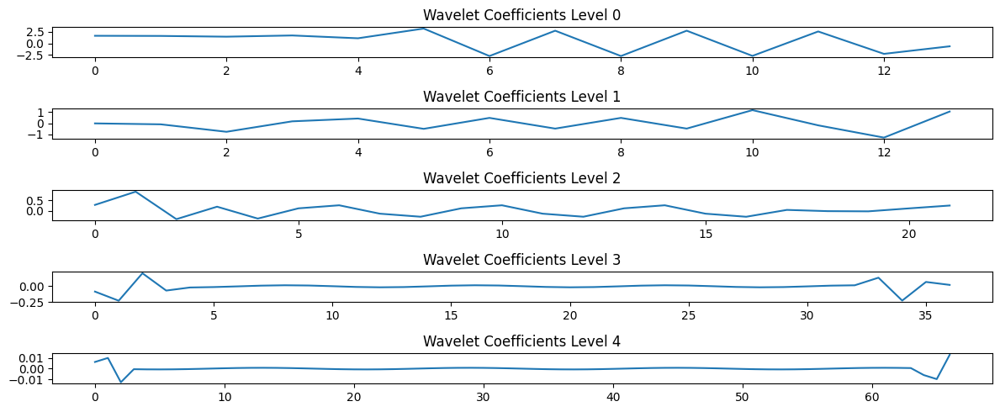

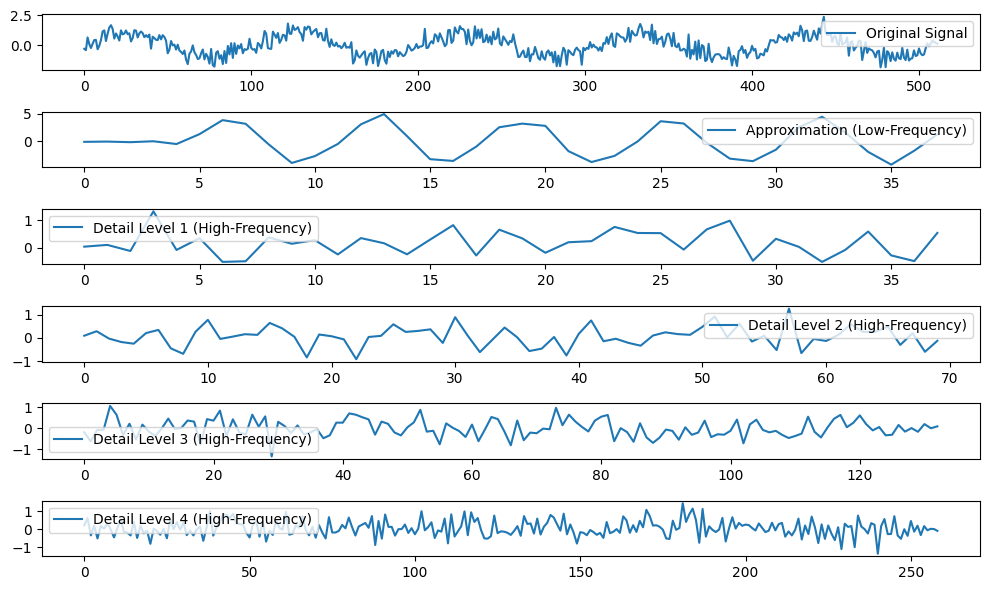

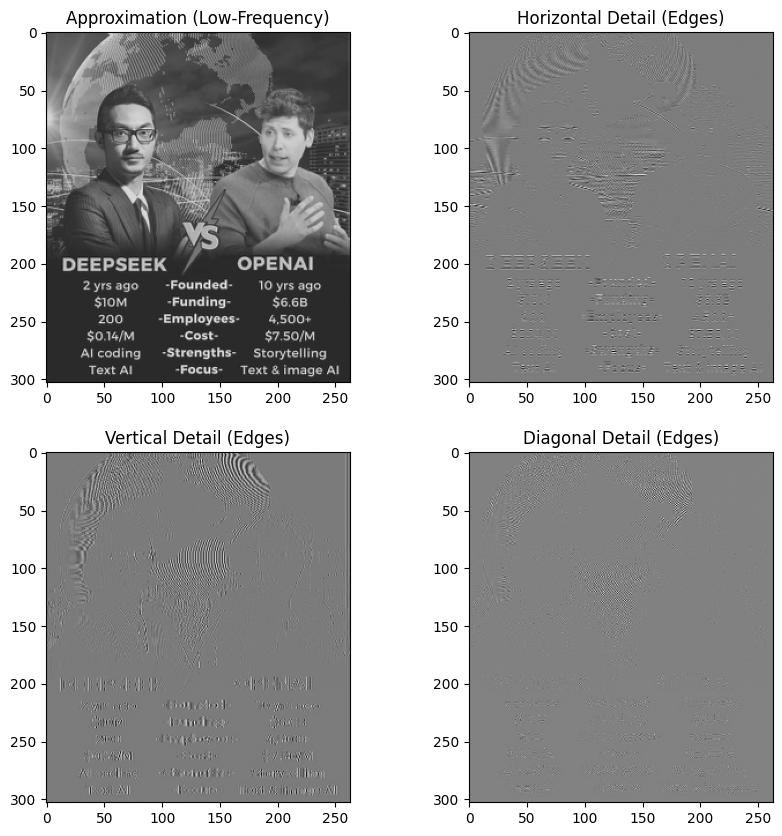

In [ ]:
#!pip install pyWavelets
import pywt
import numpy as np
import matplotlib.pyplot as plt

# Generate sample signal
x = np.sin(2 * np.pi * np.arange(128) / 32)

# Perform Discrete Wavelet Transform (DWT)
coeffs = pywt.wavedec(x, 'db4', level=4)

# Plot approximation coefficients
plt.figure(figsize=(12, 5))
for i, coeff in enumerate(coeffs):
    plt.subplot(len(coeffs), 1, i + 1)
    plt.plot(coeff)
    plt.title(f"Wavelet Coefficients Level {i}")
plt.tight_layout()
plt.show()
#8.2.2025

import numpy as np
import pywt
import matplotlib.pyplot as plt

# Generate a sample signal
x = np.sin(2 * np.pi * np.linspace(0, 1, 512) * 5) + 0.5 * np.random.randn(512)

# Perform Discrete Wavelet Transform (DWT)
coeffs = pywt.wavedec(x, 'db4', level=4)  # Decomposing into 4 levels
approximation, details = coeffs[0], coeffs[1:]

# Plot original signal and decomposed components
plt.figure(figsize=(10, 6))
plt.subplot(len(details)+2, 1, 1)
plt.plot(x, label="Original Signal")
plt.legend()

plt.subplot(len(details)+2, 1, 2)
plt.plot(approximation, label="Approximation (Low-Frequency)")
plt.legend()

for i, detail in enumerate(details):
    plt.subplot(len(details)+2, 1, i+3)
    plt.plot(detail, label=f"Detail Level {i+1} (High-Frequency)")
    plt.legend()

plt.tight_layout()
plt.show()


import cv2
import pywt
import matplotlib.pyplot as plt

# Load an example image (convert to grayscale)
image = cv2.imread('example.jpg', cv2.IMREAD_GRAYSCALE)

# Apply 2D Discrete Wavelet Transform (DWT)
coeffs2 = pywt.dwt2(image, 'db4')
cA, (cH, cV, cD) = coeffs2  # Approximation, Horizontal, Vertical, Diagonal

# Plot the decomposition
plt.figure(figsize=(10, 10))

plt.subplot(2, 2, 1)
plt.imshow(cA, cmap='gray')
plt.title("Approximation (Low-Frequency)")

plt.subplot(2, 2, 2)
plt.imshow(cH, cmap='gray')
plt.title("Horizontal Detail (Edges)")

plt.subplot(2, 2, 3)
plt.imshow(cV, cmap='gray')
plt.title("Vertical Detail (Edges)")

plt.subplot(2, 2, 4)
plt.imshow(cD, cmap='gray')
plt.title("Diagonal Detail (Edges)")

plt.show()


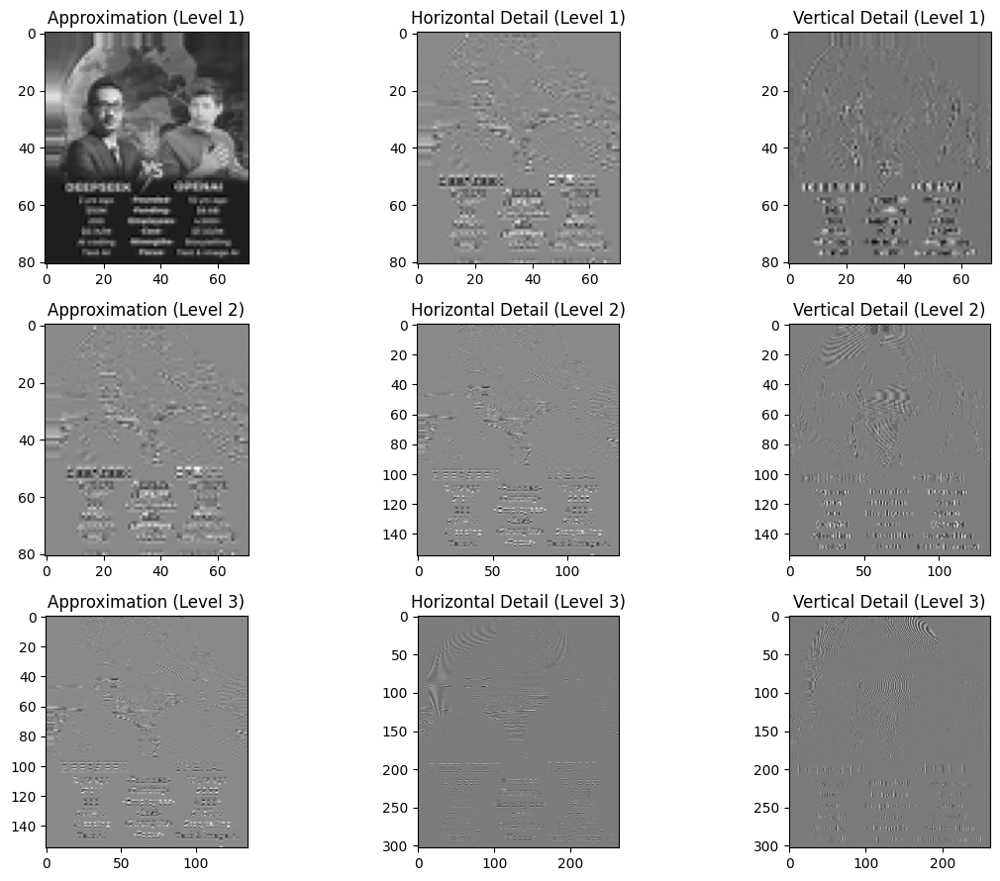

'\nimport pywt\nimage = cv2.imread(\'example.jpg\', cv2.IMREAD_GRAYSCALE)\n# Perform multi-level 2D DWT\ncoeffs = pywt.wavedec2(image, \'db4\', level=3)\n\n# Extract different levels of approximation\n#cA1, (cH1, cV1, cD1) = coeffs[0], coeffs[1][0], coeffs[1][1], coeffs[1][2]\n#cA2, (cH2, cV2, cD2) = coeffs[2][0], coeffs[2][1], coeffs[2][2], coeffs[2][3]\ncA1, (cH1, cV1, cD1) = coeffs[0], coeffs[1]\n#print(coeffs[2].shape)\nprint(coeffs[2])\n#cA2, (cH2, cV2, cD2) = coeffs[2][0], coeffs[2][1:] #, coeffs[2][2], coeffs[2][3]\n#cA2, (cH2, cV2, cD2) = coeffs[2], coeffs[3] #2][1] #, coeffs[2][2], coeffs[2][3]\ncA2, (cH2, cV2, cD2) = coeffs[2], coeffs[3] #2][1] #, coeffs[2][2], coeffs[2][3]\n\n# Plot the results\nplt.figure(figsize=(12, 6))\nplt.subplot(2, 3, 1)\nplt.imshow(cA1, cmap=\'gray\')\nplt.title("Approximation (Level 1)")\n\nplt.subplot(2, 3, 2)\nplt.imshow(cH1, cmap=\'gray\')\nplt.title("Horizontal Detail (Level 1)")\n\nplt.subplot(2, 3, 3)\nplt.imshow(cV1, cmap=\'gray\')\nplt.title

In [ ]:
import cv2
import pywt
import matplotlib.pyplot as plt

# Load an example image (convert to grayscale)
image = cv2.imread('example.jpg', cv2.IMREAD_GRAYSCALE)

# Perform multi-level 2D Discrete Wavelet Transform (DWT)
coeffs = pywt.wavedec2(image, 'db4', level=3)

# Extract coefficients correctly
cA1, (cH1, cV1, cD1) = coeffs[0], coeffs[1]  # Level 1
cA2, (cH2, cV2, cD2) = coeffs[1][0], coeffs[2]  # Level 2
cA3, (cH3, cV3, cD3) = coeffs[2][0], coeffs[3]  # Level 3

# Plot the results
plt.figure(figsize=(12, 9))

plt.subplot(3, 3, 1)
plt.imshow(cA1, cmap='gray')
plt.title("Approximation (Level 1)")

plt.subplot(3, 3, 2)
plt.imshow(cH1, cmap='gray')
plt.title("Horizontal Detail (Level 1)")

plt.subplot(3, 3, 3)
plt.imshow(cV1, cmap='gray')
plt.title("Vertical Detail (Level 1)")

plt.subplot(3, 3, 4)
plt.imshow(cA2, cmap='gray')
plt.title("Approximation (Level 2)")

plt.subplot(3, 3, 5)
plt.imshow(cH2, cmap='gray')
plt.title("Horizontal Detail (Level 2)")

plt.subplot(3, 3, 6)
plt.imshow(cV2, cmap='gray')
plt.title("Vertical Detail (Level 2)")

plt.subplot(3, 3, 7)
plt.imshow(cA3, cmap='gray')
plt.title("Approximation (Level 3)")

plt.subplot(3, 3, 8)
plt.imshow(cH3, cmap='gray')
plt.title("Horizontal Detail (Level 3)")

plt.subplot(3, 3, 9)
plt.imshow(cV3, cmap='gray')
plt.title("Vertical Detail (Level 3)")

plt.tight_layout()
plt.show()

"""
https://pywavelets.readthedocs.io/en/latest/install.html
https://pywavelets.readthedocs.io/en/latest/ref/index.html
https://pywavelets.readthedocs.io/en/latest/ref/nd-dwt-and-idwt.html#multilevel-fully-separable-reconstruction-fswaverecn
https://pywavelets.readthedocs.io/en/latest/regression/index.html
"""


"""
import pywt
image = cv2.imread('example.jpg', cv2.IMREAD_GRAYSCALE)
# Perform multi-level 2D DWT
coeffs = pywt.wavedec2(image, 'db4', level=3)

# Extract different levels of approximation
#cA1, (cH1, cV1, cD1) = coeffs[0], coeffs[1][0], coeffs[1][1], coeffs[1][2]
#cA2, (cH2, cV2, cD2) = coeffs[2][0], coeffs[2][1], coeffs[2][2], coeffs[2][3]
cA1, (cH1, cV1, cD1) = coeffs[0], coeffs[1]
#print(coeffs[2].shape)
print(coeffs[2])
#cA2, (cH2, cV2, cD2) = coeffs[2][0], coeffs[2][1:] #, coeffs[2][2], coeffs[2][3]
#cA2, (cH2, cV2, cD2) = coeffs[2], coeffs[3] #2][1] #, coeffs[2][2], coeffs[2][3]
cA2, (cH2, cV2, cD2) = coeffs[2], coeffs[3] #2][1] #, coeffs[2][2], coeffs[2][3]

# Plot the results
plt.figure(figsize=(12, 6))
plt.subplot(2, 3, 1)
plt.imshow(cA1, cmap='gray')
plt.title("Approximation (Level 1)")

plt.subplot(2, 3, 2)
plt.imshow(cH1, cmap='gray')
plt.title("Horizontal Detail (Level 1)")

plt.subplot(2, 3, 3)
plt.imshow(cV1, cmap='gray')
plt.title("Vertical Detail (Level 1)")

plt.subplot(2, 3, 4)
plt.imshow(cA2, cmap='gray')
plt.title("Approximation (Level 2)")

plt.subplot(2, 3, 5)
plt.imshow(cH2, cmap='gray')
plt.title("Horizontal Detail (Level 2)")

plt.subplot(2, 3, 6)
plt.imshow(cV2, cmap='gray')
plt.title("Vertical Detail (Level 2)")

plt.show()
"""

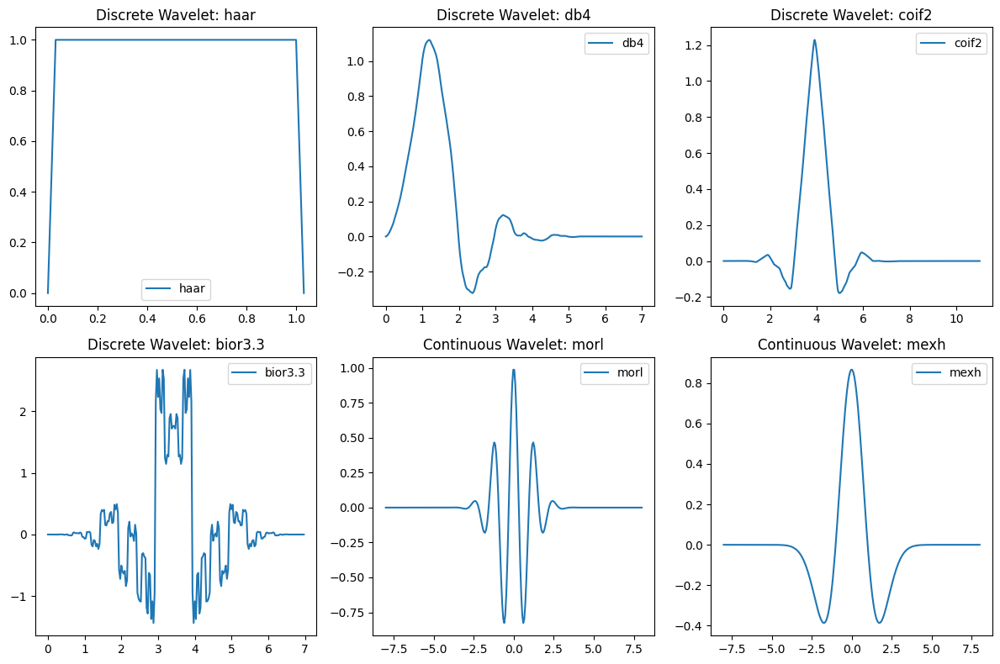

In [ ]:
import pywt
import numpy as np
import matplotlib.pyplot as plt

# Select some discrete and continuous wavelets
discrete_wavelets = ['haar', 'db4', 'coif2', 'bior3.3']
continuous_wavelets = ['morl', 'mexh']

plt.figure(figsize=(12, 8))

# Plot discrete wavelets
for i, wavelet in enumerate(discrete_wavelets):
    wavelet_obj = pywt.Wavelet(wavelet)

    # wavefun() returns multiple values: extract the wavelet function and x-axis
    wavefun_values = wavelet_obj.wavefun(level=5)

    psi = wavefun_values[0]  # Wavelet function
    x = wavefun_values[-1]   # Last value is the x-axis

    plt.subplot(2, 3, i+1)
    plt.plot(x, psi, label=wavelet)
    plt.title(f"Discrete Wavelet: {wavelet}")
    plt.legend()

# Plot continuous wavelets
for i, wavelet in enumerate(continuous_wavelets):
    wavelet_obj = pywt.ContinuousWavelet(wavelet)

    # wavefun() returns (psi, x) without needing an input argument
    psi, x = wavelet_obj.wavefun()

    plt.subplot(2, 3, i+5)  # Move to the next row
    plt.plot(x, psi, label=wavelet)
    plt.title(f"Continuous Wavelet: {wavelet}")
    plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
import pywt
import numpy as np
import matplotlib.pyplot as plt

# Get Coiflet 2 wavelet function
coif2_wavelet = pywt.Wavelet("coif2")
coif2_values = coif2_wavelet.wavefun(level=5)

# Extract components correctly (different pywt versions return different lengths)
if len(coif2_values) == 4:
    coif2_psi, _, coif2_x, _ = coif2_values  # Extract the wavelet function
else:
    coif2_psi, coif2_x, _ = coif2_values  # Older versions return 3 values

# 🔹 **Fix Orientation if Needed**
if coif2_psi[0] > 0:  # Check the starting value
    coif2_psi = -coif2_psi  # Flip if necessary

# 🔹 **Ensure Symmetry and Centering**
coif2_x = coif2_x - np.mean(coif2_x)  # Center around zero

# Get Mexican Hat wavelet (Continuous)
mexh_wavelet = pywt.ContinuousWavelet("mexh")
mexh_psi, mexh_x = mexh_wavelet.wavefun()

# 🔹 **Plot the wavelets**
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.plot(coif2_x, coif2_psi, label="Coiflet 2", color="b")
plt.axhline(0, color="gray", linestyle="--", linewidth=0.5)
plt.title("Coiflet 2 (`coif2`)")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(mexh_x, mexh_psi, label="Mexican Hat", color="r")
plt.axhline(0, color="gray", linestyle="--", linewidth=0.5)
plt.title("Mexican Hat (`mexh`)")
plt.legend()

plt.tight_layout()
plt.show()


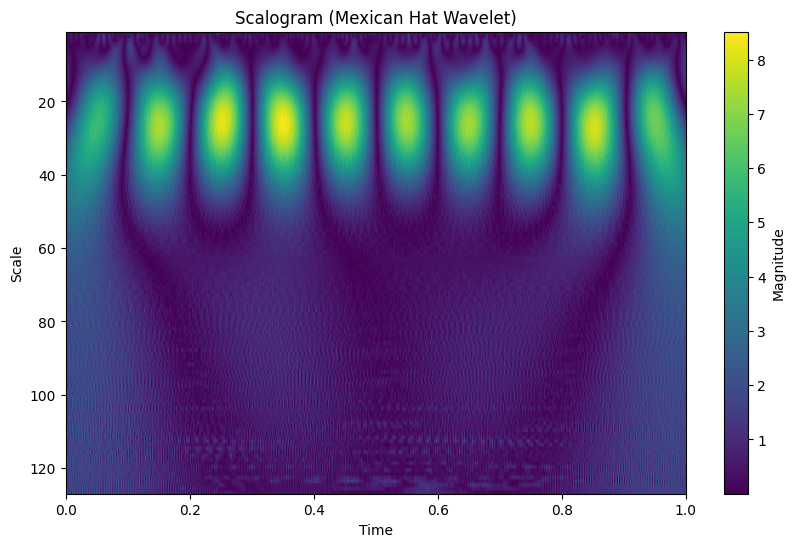

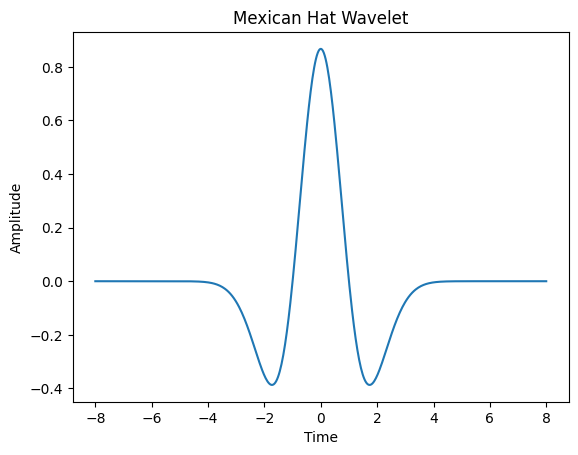

array([-0.18819205, -0.07351816,  1.00221782,  0.59015432,  0.04136968,
        1.17087518,  0.01241666,  0.32556963,  0.2582126 ,  0.47947669,
        0.72025397,  0.49670118,  1.73400478,  0.71448172,  0.18114897,
        0.847623  ,  0.99150437,  0.88275341,  0.92671171,  0.4351678 ,
        0.59528932,  1.14138359,  0.76161967,  0.68115763,  1.23166505,
        0.88048095,  1.77495331,  1.14652227,  1.18703599,  0.67498331,
       -1.06764513,  1.43399417,  0.37838835,  0.82167431,  1.0845711 ,
        1.30899697,  1.7822086 ,  0.26578614,  0.40744765,  1.31073286,
        0.18431109,  1.13737702,  1.30788236,  0.34539708,  0.26590034,
        1.04875445,  0.45820852,  0.63028698, -0.14039634, -0.70931654,
       -0.22231671,  0.44926382, -1.28872115, -0.79914127, -0.42778111,
       -0.38566439, -0.73265157,  0.20149955, -0.68842536,  1.19542021,
       -0.78880395, -0.90205916, -0.50770565, -0.89945682, -0.28092772,
        0.05132261, -0.22168113, -1.04644372, -0.0400434 , -1.12

In [ ]:
import pywt
import numpy as np
import matplotlib.pyplot as plt
#9.2.2025 fixed with DeepSeek3
# 1. Generate a sample signal
time = np.linspace(0, 1, 512)
signal = np.sin(2 * np.pi * 5 * time) + 0.5 * np.random.randn(512)

# 2. Perform CWT with a CONTINUOUS wavelet
wavelet = 'mexh'  # Mexican Hat wavelet (continuous)
scales = np.arange(1, 128)

coefs, freqs = pywt.cwt(signal, scales, wavelet)  # Now works correctly

# 3. Plot the scalogram
plt.figure(figsize=(10, 6))
plt.imshow(np.abs(coefs),
           extent=[time[0], time[-1], scales[-1], scales[0]],
           cmap='viridis',
           aspect='auto',
           origin='upper')
plt.title('Scalogram (Mexican Hat Wavelet)')
plt.xlabel('Time')
plt.ylabel('Scale')
plt.colorbar(label='Magnitude')
plt.show()

# 4. Plot the continuous wavelet function
(psi, x) = pywt.ContinuousWavelet(wavelet).wavefun(length=512)
plt.figure()
plt.plot(x, psi)
plt.title('Mexican Hat Wavelet')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.show()

# Rest of your plotting code remains the same...

# Example DWT with Coiflet
coeffs = pywt.wavedec(signal, 'coif2', level=4)
pywt.waverec(coeffs, 'coif2')

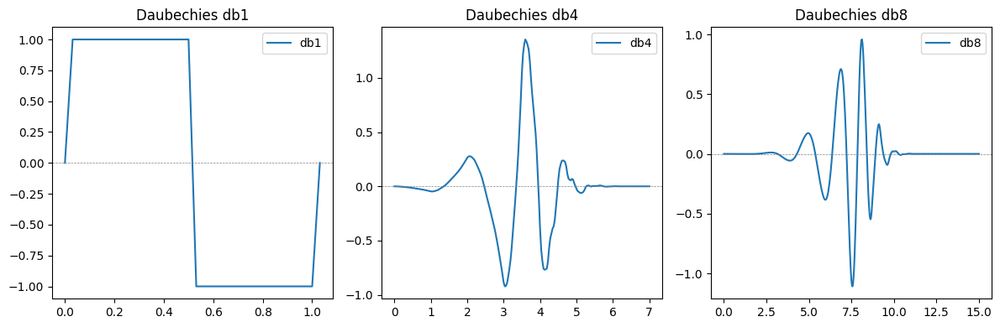

In [ ]:
import pywt
import numpy as np
import matplotlib.pyplot as plt

# List of Daubechies wavelets to visualize
wavelets = ["db1", "db4", "db8"]
plt.figure(figsize=(12, 4))

for i, wavelet in enumerate(wavelets):
    wavelet_obj = pywt.Wavelet(wavelet)
    phi, psi, x = wavelet_obj.wavefun(level=5)  # Correctly unpack the three values

    plt.subplot(1, 3, i+1)
    plt.plot(x, psi, label=wavelet)  # Use the shared x-values for plotting psi
    plt.axhline(0, color="gray", linestyle="--", linewidth=0.5)
    plt.title(f"Daubechies {wavelet}")
    plt.legend()

plt.tight_layout()
plt.show()

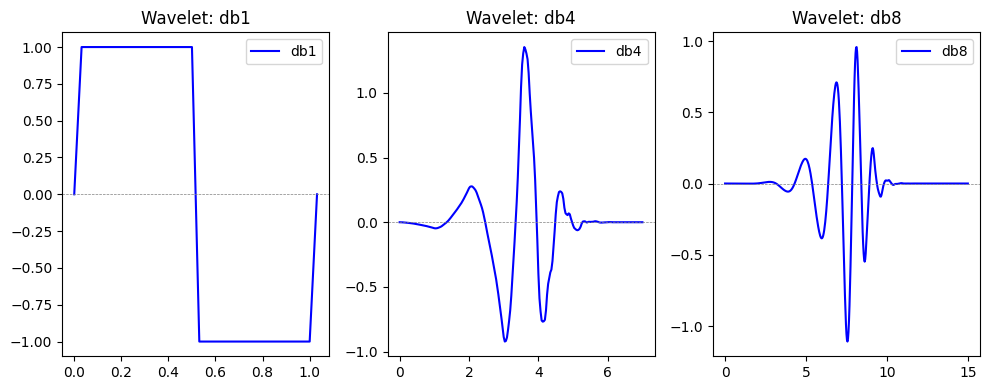

In [ ]:
# WRONG
import pywt
import numpy as np
import matplotlib.pyplot as plt

wavelets = ['db1', 'db4', 'db8']
plt.figure(figsize=(10, 4))

for i, wavelet in enumerate(wavelets):
    wavelet_obj = pywt.Wavelet(wavelet)
    #psi, _, x, _ = wavelet_obj.wavefun(level=5)  # Extract wavelet function and its x-values
    psi, psi, x = wavelet_obj.wavefun(level=5)  # Extract wavelet function and its x-values  #OK

    plt.subplot(1, 3, i+1)
    plt.plot(x, psi, label=wavelet, color='b')
    plt.title(f"Wavelet: {wavelet}")
    plt.axhline(0, color='gray', linestyle='--', linewidth=0.5)  # Add zero line for reference
    plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
"""
Wavelet Denoising with Vanishing Moments (Python Example)
We’ll demonstrate image denoising using wavelets with different vanishing moments. The goal is to remove noise while preserving edges.

📌 Steps
Load a noisy image
Apply Discrete Wavelet Transform (DWT)
Threshold the wavelet coefficients to remove noise
Reconstruct the image using Inverse DWT
Compare results using different wavelets (db1, db4, db8)

"""
import numpy as np
import pywt
import cv2
import matplotlib.pyplot as plt

# Load a grayscale image (convert if needed)
image = cv2.imread("example.jpg", cv2.IMREAD_GRAYSCALE)
image = cv2.resize(image, (256, 256))  # Resize for faster processing

# Add Gaussian noise
noisy_image = image + np.random.normal(0, 20, image.shape)
noisy_image = np.clip(noisy_image, 0, 255).astype(np.uint8)

# Function to perform wavelet denoising
def wavelet_denoise(image, wavelet="db4", level=3):
    coeffs = pywt.wavedec2(image, wavelet, level=level)
    threshold = np.median(np.abs(coeffs[-1])) / 0.6745  # Universal threshold
    coeffs = [coeffs[0]] + [
        tuple(pywt.threshold(c, threshold, mode="soft") for c in level)
        for level in coeffs[1:]
    ]
    return pywt.waverec2(coeffs, wavelet)

# Try different wavelets
wavelets = ["db1", "db4", "db8"]
denoised_images = [wavelet_denoise(noisy_image, w) for w in wavelets]

# Plot results
plt.figure(figsize=(12, 6))
plt.subplot(2, 3, 1)
plt.imshow(image, cmap="gray")
plt.title("Original Image")
plt.axis("off")

plt.subplot(2, 3, 2)
plt.imshow(noisy_image, cmap="gray")
plt.title("Noisy Image")
plt.axis("off")

for i, (w, img) in enumerate(zip(wavelets, denoised_images)):
    plt.subplot(2, 3, i + 3)
    plt.imshow(img, cmap="gray")
    plt.title(f"Denoised ({w})")
    plt.axis("off")

plt.tight_layout()
plt.show()


In [ ]:
from transformers import AutoTokenizer, AutoModelForCausalLM
import torch
tokenizer = AutoTokenizer.from_pretrained("deepseek-ai/deepseek-coder-6.7b-base", trust_remote_code=True)
model = AutoModelForCausalLM.from_pretrained("deepseek-ai/deepseek-coder-6.7b-base", trust_remote_code=True).cuda()
input_text = "#C# load docx file and scan it."
inputs = tokenizer(input_text, return_tensors="pt").cuda()
outputs = model.generate(**inputs, max_length=128)
print(tokenizer.decode(outputs[0], skip_special_tokens=True))

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

In [ ]:
#6.2.2025
import numpy as np

# Define the joint distribution P(x, G_u)
def joint_distribution(x, G_u):
    # For simplicity, let's assume a Gaussian distribution
    return np.exp(-((x - G_u) ** 2) / (2 * 0.1 ** 2)) / (np.sqrt(2 * np.pi) * 0.1)

# Define the range of values for G_u
G_u_values = np.linspace(-10, 10, 1000)

# Define the observed value of x
x_observed = 5

# Compute the joint distribution for each value of G_u
joint_distributions = [joint_distribution(x_observed, G_u) for G_u in G_u_values]

# Compute the marginal distribution by integrating out G_u
marginal_distribution = np.trapz(joint_distributions, G_u_values)

print("Marginal distribution:", marginal_distribution)

Marginal distribution: 1.0


In [ ]:
!sudo snap install auto-cpufreq

sudo: snap: command not found


In [ ]:
!pip install -U nltk
!python -m nltk.downloader 'popular'
!pip install -U pywsd

<frozen runpy>:128: RuntimeWarning: 'nltk.downloader' found in sys.modules after import of package 'nltk', but prior to execution of 'nltk.downloader'; this may result in unpredictable behaviour
[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/cmudict.zip.
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gazetteers.zip.
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/genesis.zip.
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gutenberg.zip.
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/inaugural.zip.
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping corpora/movie_review

In [ ]:
import nltk; nltk.download('averaged_perceptron_tagger_eng'); nltk.download('punkt_tab')

[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

In [ ]:
from pywsd.lesk import simple_lesk
sent = 'I went to the bank to deposit my money'
ambiguous = 'bank'
answer = simple_lesk(sent, ambiguous, pos='n')
answer
answer.definition()
from pywsd import disambiguate
from pywsd.similarity import max_similarity as maxsim
s = disambiguate('I went to the bank to deposit my money')
print(s)
#s = input("Enter...")
s = disambiguate('I went to the bank to deposit my money', algorithm=maxsim, similarity_option='wup', keepLemmas=True)
print(s)
#s = input("Enter...")
s = disambiguate('The computer in the bank run out of water, but I came from the river.', algorithm=maxsim, similarity_option='wup', keepLemmas=True)
print(s)
#s = input("Enter...")
s = disambiguate('The computer in the bank run out of gas, but I came from the city.', algorithm=maxsim, similarity_option='wup', keepLemmas=True)
print(s)


[('I', None), ('went', Synset('run_low.v.01')), ('to', None), ('the', None), ('bank', Synset('depository_financial_institution.n.01')), ('to', None), ('deposit', Synset('deposit.v.02')), ('my', None), ('money', Synset('money.n.03'))]
[('I', 'i', None), ('went', 'go', Synset('travel.v.01')), ('to', 'to', None), ('the', 'the', None), ('bank', 'bank', Synset('bank.n.06')), ('to', 'to', None), ('deposit', 'deposit', Synset('deposit.v.02')), ('my', 'my', None), ('money', 'money', Synset('money.n.02'))]
[('The', 'the', None), ('computer', 'computer', Synset('computer.n.01')), ('in', 'in', None), ('the', 'the', None), ('bank', 'bank', Synset('bank.n.09')), ('run', 'run', Synset('play.v.18')), ('out', 'out', None), ('of', 'of', None), ('water', 'water', Synset('water.n.03')), (',', ',', None), ('but', 'but', None), ('I', 'i', None), ('came', 'come', Synset('issue_forth.v.01')), ('from', 'from', None), ('the', 'the', None), ('river', 'river', Synset('river.n.01')), ('.', '.', None)]
[('The', 't

In [ ]:



 sudo auto-cpufreq --monitor

In [ ]:
#Forward-Backward Algorithm HMM
import numpy as np

# Number of states and observations
num_states = 2  # For simplicity, let's assume we have 2 states
num_observations = 3  # Let's assume we have 3 possible observations

# Example HMM parameters
# Transition matrix A (state-to-state probabilities)
A = np.array([[0.7, 0.3],  # from state 0 to state 0 and state 1
              [0.4, 0.6]]) # from state 1 to state 0 and state 1

# Emission matrix B (observation probabilities given a state)
B = np.array([[0.5, 0.4, 0.1],  # Probabilities of observing O1, O2, O3 in state 0
              [0.1, 0.3, 0.6]]) # Probabilities of observing O1, O2, O3 in state 1

# Initial state distribution (probabilities of starting in each state)
pi = np.array([0.6, 0.4])

# Observations (indices corresponding to the observation symbols)
observations = [0, 1, 2]  # Example sequence of observations (O1, O2, O3)

# Step 1: Initialize forward and backward variables
T = len(observations)  # Length of the observation sequence
alpha = np.zeros((T, num_states))  # Forward probabilities
beta = np.zeros((T, num_states))   # Backward probabilities

# Step 2: Forward pass (Calculating alpha)
# Initialization: Base case
alpha[0, :] = pi * B[:, observations[0]]

# Recursion: Compute alpha for each time step
for t in range(1, T):
    for j in range(num_states):
        alpha[t, j] = np.sum(alpha[t-1, :] * A[:, j]) * B[j, observations[t]]

# Step 3: Backward pass (Calculating beta)
# Initialization: Base case
beta[T-1, :] = 1

# Recursion: Compute beta for each time step
for t in range(T-2, -1, -1):
    for i in range(num_states):
        beta[t, i] = np.sum(A[i, :] * B[:, observations[t+1]] * beta[t+1, :])

# Step 4: Compute the likelihood of the observation sequence
P_observation = np.sum(alpha[T-1, :])

# Step 5: Calculate the posterior probability for each state at each time step
gamma = np.zeros((T, num_states))  # Posterior probabilities (state occupancy)
for t in range(T):
    for i in range(num_states):
        gamma[t, i] = alpha[t, i] * beta[t, i] / P_observation

# Output the results
print("Forward Probabilities (alpha):")
print(alpha)
print("\nBackward Probabilities (beta):")
print(beta)
print("\nPosterior Probabilities (gamma):")
print(gamma)
print("\nLikelihood of the observation sequence:", P_observation)

Forward Probabilities (alpha):
[[0.3      0.04    ]
 [0.0904   0.0342  ]
 [0.007696 0.028584]]

Backward Probabilities (beta):
[[0.106 0.112]
 [0.25  0.4  ]
 [1.    1.   ]]

Posterior Probabilities (gamma):
[[0.87651599 0.12348401]
 [0.62293275 0.37706725]
 [0.21212789 0.78787211]]

Likelihood of the observation sequence: 0.03628


In [ ]:
#2-2-2025   Projection
from tensorflow import keras
from tensorflow.keras.layers import LSTM, Dense, Input
from tensorflow.keras.models import Model

# Example RNN with an LSTM layer
rnn_input = keras.Input(shape=(10, 64))  # 10 time steps, 64 features
lstm_layer = LSTM(128)(rnn_input)  # LSTM projects input to 128-dimensional space

# Projection layer for classification
output_layer = Dense(10, activation='softmax')(lstm_layer)  # 10-class classification

# Create model
rnn_model = Model(inputs=rnn_input, outputs=output_layer)

# Summarize model
rnn_model.summary()

print("\n\n")
print("EMBEDDING")

from tensorflow.keras.layers import Embedding

# Example embedding layer
embedding_layer = Embedding(input_dim=10000, output_dim=64)  # Projecting 10,000 words to 64-dimensional vectors

# Input for text sequences
text_input = Input(shape=(None,))

# Apply embedding layer
embedded_text = embedding_layer(text_input)

# Summarize part of the model
embedding_model = Model(inputs=text_input, outputs=embedded_text)
embedding_model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 10, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 128)                 │          98,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 10)                  │           1,290 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 100,106 (391.04 KB)

 Trainable params: 100,106 (391.04 KB)

 Non-trainable params: 0 (0.00 B)




EMBEDDING


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)           │ (None, None)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ embedding_2 (Embedding)              │ (None, None, 64)            │         640,000 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 640,000 (2.44 MB)

 Trainable params: 640,000 (2.44 MB)

 Non-trainable params: 0 (0.00 B)

Means (mu): torch.Size([25, 3])
Standard Deviations (sigma): torch.Size([25, 3])
Mixing Coefficients (pi): torch.Size([25, 3])
Generated samples: tensor([ 0.4099,  0.0221, -0.5836, -0.1132,  1.6473])
Generated samples: tensor([-2.9679e-03,  1.2104e+00, -6.8190e-01, -3.7769e-01,  8.6198e-01,
        -9.5480e-01, -3.0796e+00,  1.0902e+00,  5.3320e-01,  2.4143e-01,
         1.0652e-01, -1.7483e-01,  3.5056e-01,  6.4731e-01,  3.3572e-01,
        -1.5141e+00,  2.6854e-02,  6.9513e-01,  1.7740e-01, -6.1845e-01,
        -1.0571e+00, -8.0664e-02,  1.5860e+00,  2.8474e+00,  1.3863e+00])


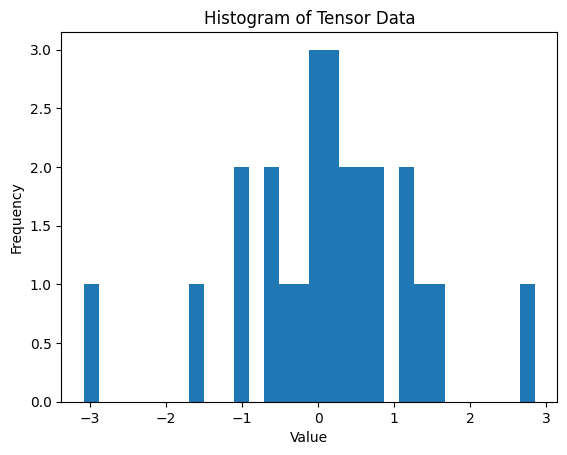

Generated samples: tensor([ 1.0959,  1.2450,  0.7119, -0.0277,  0.3889,  0.6902,  0.9926,  2.8315,
         0.6006, -2.2731,  0.4062, -1.7147, -0.3916, -0.4354,  1.4414, -1.2267,
         0.8398,  1.3920,  0.7381, -0.3492, -0.5805,  0.1654,  2.2518,  1.1845,
        -0.9143])


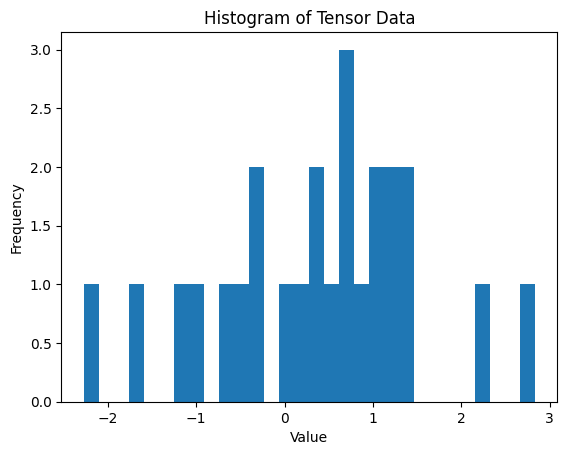

Generated samples: tensor([ 1.8402,  0.5758,  1.8535, -1.1637, -0.6338,  0.6365, -0.3078,  2.3161,
        -0.2510, -0.9597,  1.3717,  0.7292,  0.8225,  0.3929, -0.1558,  1.4547,
        -0.5873, -0.5432,  2.1233,  0.0857, -1.6721,  2.0081, -0.4894,  1.8936,
         1.7282])


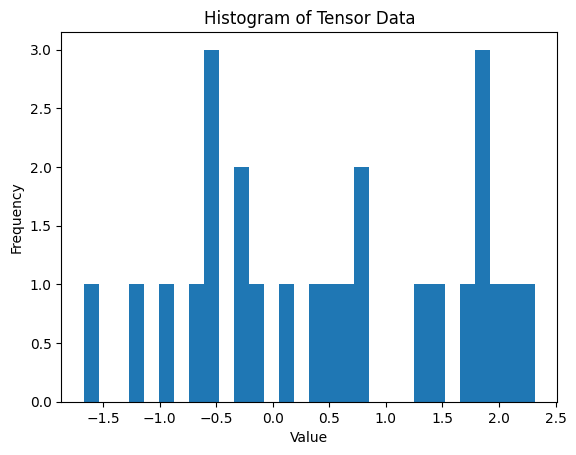

Generated samples: tensor([ 1.3465, -1.7791,  0.5156, -0.8933,  0.5514, -0.6661, -1.5778,  1.5207,
        -0.0767, -0.9728, -1.6410,  0.0548,  0.1863, -0.3016,  0.8985,  2.4889,
        -0.2458, -0.5832,  0.7472, -1.5331, -0.8767, -2.8751,  1.2519, -0.0592,
        -2.6771])


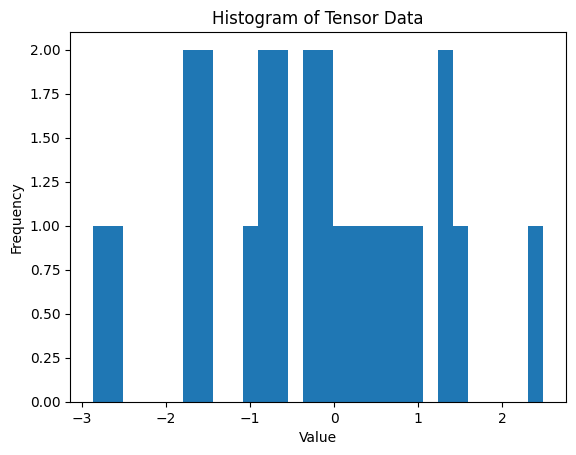

In [ ]:
#GMM Gaussian mixture model, #23-1-2025
import torch
import torch.nn as nn
import torch.optim as optim
import torch.distributions as dist

class GMM_MLP(nn.Module):
    def __init__(self, input_size, hidden_size, num_components):
        super(GMM_MLP, self).__init__()

        # Define layers for the MLP
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, num_components * 3)  # For means, variances, and mixing coefficients

        self.num_components = num_components

    def forward(self, x):
        # Pass through the first hidden layer
        x = torch.relu(self.fc1(x))

        # Get the raw output from the second layer (size: batch_size x num_components*3)
        raw_params = self.fc2(x)

        # Split the raw output into means, standard deviations, and mixing coefficients
        mu = raw_params[:, :self.num_components]  # Means for each component
        log_sigma = raw_params[:, self.num_components:self.num_components*2]  # Log of standard deviations
        log_pi = raw_params[:, self.num_components*2:]  # Log of mixing coefficients

        # Apply activation functions
        sigma = torch.exp(log_sigma)  # Exponentiate to get positive standard deviations
        pi = torch.softmax(log_pi, dim=-1)  # Softmax for mixing coefficients to sum to 1

        return mu, sigma, pi

# Example Usage
input_size = 10  # Example input size (e.g., features)
hidden_size = 64
num_components = 3  # Number of Gaussian components in the mixture

# Create the model
model = GMM_MLP(input_size, hidden_size, num_components)

# Example input (batch of 5 samples, each with 10 features)
x = torch.randn(25, input_size)

# Forward pass through the model
mu, sigma, pi = model(x)

# Print output shapes
print(f"Means (mu): {mu.shape}")
print(f"Standard Deviations (sigma): {sigma.shape}")
print(f"Mixing Coefficients (pi): {pi.shape}")

def sample_from_gmm(mu, sigma, pi, num_samples):
    # Create a categorical distribution for choosing which Gaussian component to sample from
    categorical = dist.Categorical(pi)

    # Sample indices for each component
    #component_indices = categorical.sample([num_samples])
    component_indices = categorical.sample() #OK

    # Create a list to store the samples
    samples = []

    for i in range(num_samples):
        # For the chosen component, sample from the corresponding Gaussian distribution
        comp_idx = component_indices[i].item()
        gaussian = dist.Normal(mu[i, comp_idx], sigma[i, comp_idx])

        # Sample from this Gaussian
        sample = gaussian.sample()
        samples.append(sample)

    # Return the samples as a tensor
    return torch.stack(samples)

# Sample from the GMM for 5 samples
num_samples = 5
samples = sample_from_gmm(mu, sigma, pi, num_samples)
print(f"Generated samples: {samples}")

def hist1(samples_in):
  import torch
  import matplotlib.pyplot as plt

  # Your PyTorch tensor
  #tensor_data = torch.randn(1000)  # Example: 1000 random values from a normal distribution

  # Create the histogram
  #plt.hist(tensor_data.cpu().numpy(), bins=30)  # Convert tensor to NumPy array for plotting
  plt.hist(samples_in.cpu().numpy(), bins=30)  # Convert tensor to NumPy array for plotting

  # Customize the plot (optional)
  plt.title("Histogram of Tensor Data")
  plt.xlabel("Value")
  plt.ylabel("Frequency")

  # Show the plot
  plt.show()

many_samples = 25
for k in range(1,5):
   samples = sample_from_gmm(mu, sigma, pi, many_samples)
   print(f"Generated samples: {samples}")
   hist1(samples)
   #if k==1: hist1(samples)



In [ ]:
#GELU 23.1.2025
import torch
import torch.nn as nn
import torch.optim as optim

# Define a simple neural network with GELU activation
class SimpleNN(nn.Module):
    def __init__(self):
        super(SimpleNN, self).__init__()
        self.fc1 = nn.Linear(10, 64)
        self.gelu = nn.GELU()  # GELU activation
        self.fc2 = nn.Linear(64, 1)

    def forward(self, x):
        x = self.fc1(x)
        x = self.gelu(x)  # Apply GELU activation after the first layer
        x = self.fc2(x)
        return x

# Create model
model = SimpleNN()

# Example input (batch of 5 samples, each with 10 features)
x = torch.randn(5, 10)

# Forward pass
output = model(x)
print(output)

tensor([[-0.3417],
        [ 0.0933],
        [ 0.1062],
        [ 0.0086],
        [-0.0946]], grad_fn=<AddmmBackward0>)


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SimpleNNWithManualGELU(nn.Module):
    def __init__(self):
        super(SimpleNNWithManualGELU, self).__init__()
        self.fc1 = nn.Linear(10, 64)
        #self.fc2 = nn.Linear(64, 1)
        self.fc2 = nn.Linear(64, 2)

    def forward(self, x):
        x = self.fc1(x)
        #x = 0.5 * x * (1 + torch.tanh(torch.sqrt(2. / torch.pi) * (x + 0.044715 * x**3)))  # GELU activation
        x = 0.5 * x * (1 + torch.tanh(torch.sqrt(torch.tensor(2.) / torch.pi) * (x + 0.044715 * x**3)))  # GELU activation
        x = self.fc2(x)
        return x

# Create model
model_manual_gelu = SimpleNNWithManualGELU()

# Example input (batch of 5 samples, each with 10 features)
#x = torch.randn(5, 10)
x = torch.randn(1, 10) # ==> tensor([[-0.7974]], grad_fn=<AddmmBackward0>)
x = torch.randn(2, 10) # ==> tensor([[ 0.1251],[-0.0769]], grad_fn=<AddmmBackward0>) ...
#batch_size (variable), input 10 (fixed), output 1
#or change the output to 2 ...

# Forward pass
output = model_manual_gelu(x)
print(output)

tensor([[ 0.3255, -0.0545],
        [ 0.1472, -0.1546]], grad_fn=<AddmmBackward0>)


In [ ]:
 hist1(samples)!pip install sklearn-crfsuite
!pip install ipython-autotime
#14-1-2025


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 21.5 MB/s eta 0:00:00


In [ ]:
#CRF 14.1.2025
#!pip install ipython-autotime
#%load_ext autotime
%load_ext time
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from itertools import chain

import nltk
import sklearn
import scipy.stats
from sklearn.metrics import make_scorer
from sklearn.model_selection import cross_val_score #not .cross_validation
from sklearn.model_selection  import RandomizedSearchCV # not .grid_search

import sklearn_crfsuite
from sklearn_crfsuite import scorers
from sklearn_crfsuite import metrics

nltk.download('conll2002')
#nltk.corpus.conll2002.fileids()
#%%time
train_sents = list(nltk.corpus.conll2002.iob_sents('esp.train'))
test_sents = list(nltk.corpus.conll2002.iob_sents('esp.testb'))
train_sents[0]

def word2features(sent, i):
    word = sent[i][0]
    postag = sent[i][1]

    features = {
        'bias': 1.0,
        'word.lower()': word.lower(),
        'word[-3:]': word[-3:],
        'word[-2:]': word[-2:],
        'word.isupper()': word.isupper(),
        'word.istitle()': word.istitle(),
        'word.isdigit()': word.isdigit(),
        'postag': postag,
        'postag[:2]': postag[:2],
    }
    if i > 0:
        word1 = sent[i-1][0]
        postag1 = sent[i-1][1]
        features.update({
            '-1:word.lower()': word1.lower(),
            '-1:word.istitle()': word1.istitle(),
            '-1:word.isupper()': word1.isupper(),
            '-1:postag': postag1,
            '-1:postag[:2]': postag1[:2],
        })
    else:
        features['BOS'] = True

    if i < len(sent)-1:
        word1 = sent[i+1][0]
        postag1 = sent[i+1][1]
        features.update({
            '+1:word.lower()': word1.lower(),
            '+1:word.istitle()': word1.istitle(),
            '+1:word.isupper()': word1.isupper(),
            '+1:postag': postag1,
            '+1:postag[:2]': postag1[:2],
        })
    else:
        features['EOS'] = True

    return features


def sent2features(sent):
    return [word2features(sent, i) for i in range(len(sent))]

def sent2labels(sent):
    return [label for token, postag, label in sent]

def sent2tokens(sent):
    return [token for token, postag, label in sent]


sent2features(train_sents[0])[0]
%load_ext time
#%%time  #no
X_train = [sent2features(s) for s in train_sents]
y_train = [sent2labels(s) for s in train_sents]

X_test = [sent2features(s) for s in test_sents]
y_test = [sent2labels(s) for s in test_sents]
%load_ext time
#%%time
crf = sklearn_crfsuite.CRF(
    algorithm='lbfgs',
    c1=0.1,
    c2=0.1,
    max_iterations=100,
    all_possible_transitions=True
)
crf.fit(X_train, y_train)

The time module is not an IPython extension.


[nltk_data] Downloading package conll2002 to /root/nltk_data...
[nltk_data]   Package conll2002 is already up-to-date!


The time module is not an IPython extension.
The time module is not an IPython extension.


CRF(algorithm='lbfgs', all_possible_transitions=True, c1=0.1, c2=0.1,
    max_iterations=100)

time: 52.6 s (started: 2025-01-14 02:52:54 +00:00)


In [ ]:
labels = list(crf.classes_)
labels.remove('O')
labels
y_pred = crf.predict(X_test)
metrics.flat_f1_score(y_test, y_pred,
                      average='weighted', labels=labels)
# group B and I results
sorted_labels = sorted(
    labels,
    key=lambda name: (name[1:], name[0])
)
print(metrics.flat_classification_report(
    y_test, y_pred, labels=sorted_labels, digits=3
))

crf = sklearn_crfsuite.CRF(
    algorithm='lbfgs',
    max_iterations=100,
    all_possible_transitions=True
)
params_space = {
    'c1': scipy.stats.expon(scale=0.5),
    'c2': scipy.stats.expon(scale=0.05),
}

# use the same metric for evaluation
f1_scorer = make_scorer(metrics.flat_f1_score,
                        average='weighted', labels=labels)

# search
rs = RandomizedSearchCV(crf, params_space,
                        cv=3,
                        verbose=3, #1,
                        n_jobs=-1,
                        #n_iter=50,
                        n_iter=1,
                        scoring=f1_scorer)
rs.fit(X_train, y_train)
#2min 31s for 1 iter!

              precision    recall  f1-score   support

       B-LOC      0.800     0.781     0.790      1084
       I-LOC      0.674     0.655     0.665       325
      B-MISC      0.715     0.569     0.634       339
      I-MISC      0.691     0.589     0.636       557
       B-ORG      0.810     0.831     0.821      1400
       I-ORG      0.850     0.778     0.813      1104
       B-PER      0.852     0.882     0.866       735
       I-PER      0.900     0.940     0.920       634

   micro avg      0.809     0.785     0.797      6178
   macro avg      0.786     0.753     0.768      6178
weighted avg      0.807     0.785     0.794      6178

Fitting 3 folds for each of 1 candidates, totalling 3 fits


KeyboardInterrupt: 

time: 37.7 s (started: 2025-01-14 03:36:45 +00:00)


best params: {'c1': 0.12643459215033379, 'c2': 0.014730482511442178}
best CV score: 0.7500020207027869
model size: 1.25M
Dark blue => 0.75, dark red => 0.75
              precision    recall  f1-score   support

       B-LOC      0.800     0.781     0.790      1084
       I-LOC      0.674     0.655     0.665       325
      B-MISC      0.715     0.569     0.634       339
      I-MISC      0.691     0.589     0.636       557
       B-ORG      0.810     0.831     0.821      1400
       I-ORG      0.850     0.778     0.813      1104
       B-PER      0.852     0.882     0.866       735
       I-PER      0.900     0.940     0.920       634

   micro avg      0.809     0.785     0.797      6178
   macro avg      0.786     0.753     0.768      6178
weighted avg      0.807     0.785     0.794      6178

Top likely transitions:
B-ORG  -> I-ORG   7.906022
I-ORG  -> I-ORG   7.457878
B-MISC -> I-MISC  6.982901
B-PER  -> I-PER   6.982059
I-MISC -> I-MISC  6.882844
B-LOC  -> I-LOC   5.952594
I-LOC 

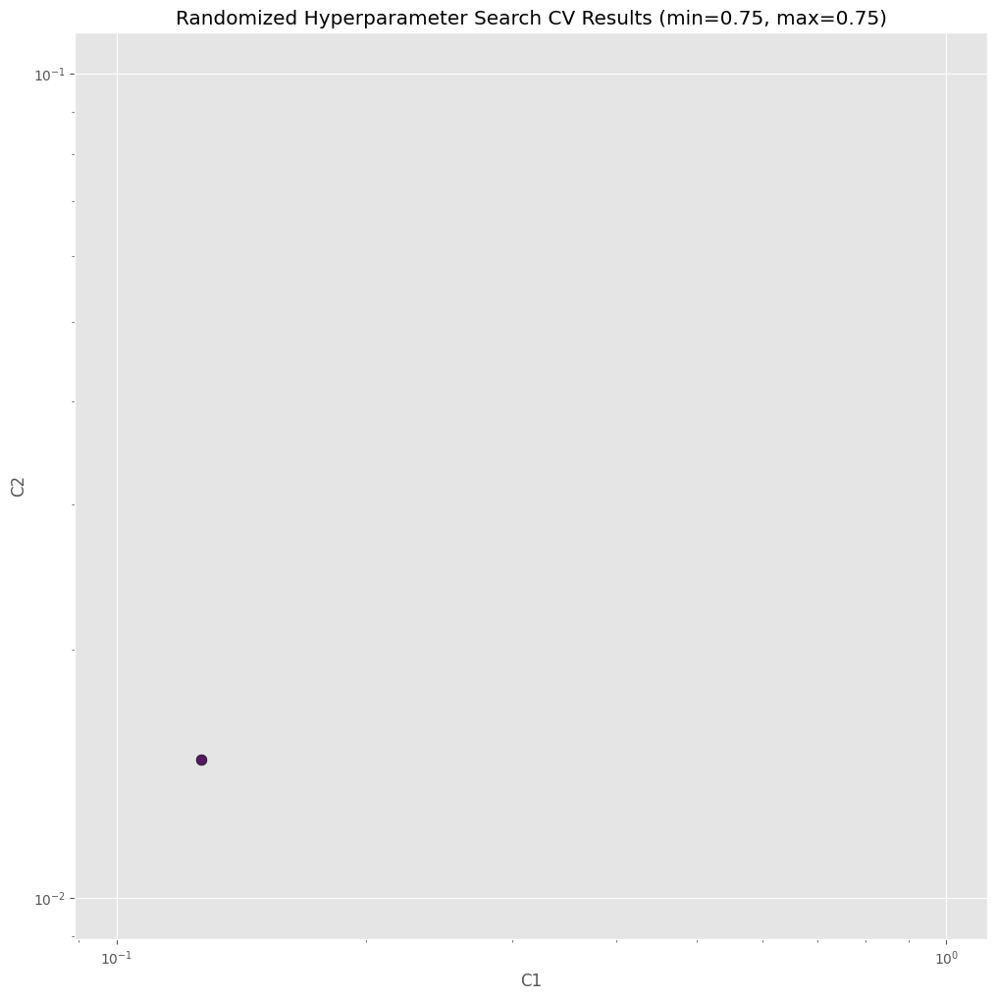

time: 2.89 s (started: 2025-01-14 02:59:16 +00:00)


In [ ]:
# crf = rs.best_estimator_
rs
print('best params:', rs.best_params_)
print('best CV score:', rs.best_score_)
print('model size: {:0.2f}M'.format(rs.best_estimator_.size_ / 1000000))
#best params: {'c2': 0.06146442424219609, 'c1': 0.30343585910230675}
#best CV score: 0.748852160441
#model size: 1.08M

"""
_x = [s.parameters['c1'] for s in rs.grid_scores_]
_y = [s.parameters['c2'] for s in rs.grid_scores_]
_c = [s.mean_validation_score for s in rs.grid_scores_]

_x = [s.parameters['c1'] for s in rs.cv_results_['params']]
_y = [s.parameters['c2'] for s in rs.cv_results_['params']]
_c = rs.cv_results_['mean_test_score']
"""
_x = [s['c1'] for s in rs.cv_results_['params']]
_y = [s['c2'] for s in rs.cv_results_['params']]
_c = rs.cv_results_['mean_test_score']

fig = plt.figure()
fig.set_size_inches(12, 12)
ax = plt.gca()
ax.set_yscale('log')
ax.set_xscale('log')
ax.set_xlabel('C1')
ax.set_ylabel('C2')
ax.set_title("Randomized Hyperparameter Search CV Results (min={:0.3}, max={:0.3})".format(
    min(_c), max(_c)
))

ax.scatter(_x, _y, c=_c, s=60, alpha=0.9, edgecolors=[0,0,0])

print("Dark blue => {:0.4}, dark red => {:0.4}".format(min(_c), max(_c)))

crf = rs.best_estimator_
y_pred = crf.predict(X_test)
print(metrics.flat_classification_report(
    y_test, y_pred, labels=sorted_labels, digits=3
))

from collections import Counter

def print_transitions(trans_features):
    for (label_from, label_to), weight in trans_features:
        print("%-6s -> %-7s %0.6f" % (label_from, label_to, weight))

print("Top likely transitions:")
print_transitions(Counter(crf.transition_features_).most_common(20))

print("\nTop unlikely transitions:")
print_transitions(Counter(crf.transition_features_).most_common()[-20:])

def print_state_features(state_features):
    for (attr, label), weight in state_features:
        print("%0.6f %-8s %s" % (weight, label, attr))

print("Top positive:")
print_state_features(Counter(crf.state_features_).most_common(30))

print("\nTop negative:")
print_state_features(Counter(crf.state_features_).most_common()[-30:])

In [ ]:
len(test_sents)
print(test_sents[0:3])


[[('La', 'DA', 'B-LOC'), ('Coruña', 'NC', 'I-LOC'), (',', 'Fc', 'O'), ('23', 'Z', 'O'), ('may', 'NC', 'O'), ('(', 'Fpa', 'O'), ('EFECOM', 'NP', 'B-ORG'), (')', 'Fpt', 'O'), ('.', 'Fp', 'O')], [('-', 'Fg', 'O')], [('Las', 'DA', 'O'), ('reservas', 'NC', 'O'), ('"', 'Fe', 'O'), ('on', 'NC', 'O'), ('line', 'AQ', 'O'), ('"', 'Fe', 'O'), ('de', 'SP', 'O'), ('billetes', 'NC', 'O'), ('aéreos', 'AQ', 'O'), ('a', 'SP', 'O'), ('través', 'NC', 'O'), ('de', 'SP', 'O'), ('Internet', 'NC', 'B-MISC'), ('aumentaron', 'VMI', 'O'), ('en', 'SP', 'O'), ('España', 'VMN', 'B-LOC'), ('un', 'DI', 'O'), ('300', 'Z', 'O'), ('por', 'SP', 'O'), ('ciento', 'PN', 'O'), ('en', 'SP', 'O'), ('el', 'DA', 'O'), ('primer', 'AO', 'O'), ('trimestre', 'NC', 'O'), ('de', 'SP', 'O'), ('este', 'DD', 'O'), ('año', 'NC', 'O'), ('con', 'SP', 'O'), ('respecto', 'NC', 'O'), ('al', 'SP', 'O'), ('mismo', 'DI', 'O'), ('período', 'NC', 'O'), ('de', 'SP', 'O'), ('1999', 'Z', 'O'), (',', 'Fc', 'O'), ('aseguró', 'VMI', 'O'), ('hoy', 'RG', 

In [ ]:
train_sents

In [ ]:
"""
crf = sklearn_crfsuite.CRF(
    algorithm='lbfgs',
    c1=0.1,
    c2=0.1,
    max_iterations=100,
    all_possible_transitions=True
)
crf.fit(X_train, y_train)
"""

In [ ]:
#!pip install transformers

In [ ]:
import torch
import torch.nn as nn

# Define the shared projection layer for both text and image embeddings
class ProjectionLayer(nn.Module):
    def __init__(self, text_dim, image_dim, projection_dim):
        super(ProjectionLayer, self).__init__()
        # Textual projection layer (from text_dim to projection_dim)
        self.text_proj = nn.Linear(text_dim, projection_dim)

        # Image projection layer (from image_dim to projection_dim)
        self.image_proj = nn.Linear(image_dim, projection_dim)

    def forward(self, text_embedding, image_embedding):
        # Apply projections to both text and image embeddings
        projected_text = self.text_proj(text_embedding)
        projected_image = self.image_proj(image_embedding)

        return projected_text, projected_image

# Example usage
if __name__ == "__main__":
    # Define the dimensions of the text and image embeddings
    text_dim = 768   # e.g., output dimension of a BERT-based model
    image_dim = 512  # e.g., output dimension of a Vision Transformer (ViT)
    projection_dim = 256  # Shared projection space

    # Instantiate the projection layer
    projection_layer = ProjectionLayer(text_dim, image_dim, projection_dim)

    # Example input embeddings
    text_embedding = torch.randn(1, text_dim)  # Batch size = 1, text_dim = 768
    image_embedding = torch.randn(1, image_dim)  # Batch size = 1, image_dim = 512

    # Get projected embeddings
    projected_text, projected_image = projection_layer(text_embedding, image_embedding)

    print("Projected Text Embedding Shape:", projected_text.shape)
    print("Projected Image Embedding Shape:", projected_image.shape)

Projected Text Embedding Shape: torch.Size([1, 256])
Projected Image Embedding Shape: torch.Size([1, 256])


In [ ]:
projected_text

tensor([[ 2.0794e-02, -2.3199e-01,  1.4742e-01, -3.0086e-01,  2.6239e-01,
          1.8547e-01, -1.4428e-01,  6.5894e-02,  5.3667e-01, -7.8140e-01,
         -2.4871e-01,  6.3592e-01, -1.6374e-03, -3.5848e-01,  1.8097e-01,
         -7.3525e-01,  1.4344e-01,  1.5385e-01, -4.8625e-01,  1.3680e+00,
          3.2973e-01, -5.2728e-01, -4.2848e-01, -3.8534e-01, -7.9808e-01,
          2.6274e-01, -3.4248e-01, -1.0546e+00, -2.0428e-01, -1.0172e+00,
          1.0926e-01, -4.8777e-01,  6.5501e-01,  1.1676e+00,  1.1641e+00,
          2.3981e-01, -5.7710e-01,  3.8484e-01,  1.6315e-01, -1.1198e+00,
          1.3696e-02,  3.3016e-01, -3.3324e-01, -3.9302e-01,  3.2192e-01,
          5.9234e-01, -1.0132e+00,  6.8966e-01,  7.8917e-01,  3.1557e-01,
          2.4651e-01, -7.4646e-02, -7.4670e-01,  1.0337e+00, -5.8843e-01,
          5.3393e-01,  3.2158e-01,  5.4977e-02, -2.3771e-01, -3.8313e-01,
          7.2900e-01,  4.4407e-01,  9.2188e-02,  5.3870e-01, -5.8884e-01,
         -4.9002e-03,  9.0604e-02, -8.

In [ ]:
import torch
import torch.nn as nn
from transformers import BertTokenizer, BertModel
from torchvision import models, transforms
from PIL import Image

# Define the projection layer for both text and image embeddings
class ProjectionLayer(nn.Module):
    def __init__(self, text_dim, image_dim, projection_dim):
        super(ProjectionLayer, self).__init__()
        self.text_proj = nn.Linear(text_dim, projection_dim)  # Text to shared space
        self.image_proj = nn.Linear(image_dim, projection_dim)  # Image to shared space

    def forward(self, text_embedding, image_embedding):
        # Apply projections to both text and image embeddings
        projected_text = self.text_proj(text_embedding)
        projected_image = self.image_proj(image_embedding)

        return projected_text, projected_image

# Define the image model (e.g., a pre-trained ResNet for image feature extraction)
class ImageModel(nn.Module):
    def __init__(self, output_dim=512):
        super(ImageModel, self).__init__()
        # Load pre-trained ResNet18 model and modify the final layer
        resnet = models.resnet18(pretrained=True)
        self.resnet = nn.Sequential(*list(resnet.children())[:-1])  # Remove the final fully connected layer
        self.fc = nn.Linear(resnet.fc.in_features, output_dim)  # Custom output dimension

    def forward(self, x):
        x = self.resnet(x)
        x = x.view(x.size(0), -1)  # Flatten the output
        x = self.fc(x)  # Get the final image embedding
        return x

# Define the text model (e.g., a pre-trained BERT model for text feature extraction)
class TextModel(nn.Module):
    def __init__(self, model_name='bert-base-uncased', output_dim=768):
        super(TextModel, self).__init__()
        # Load pre-trained BERT model
        self.bert = BertModel.from_pretrained(model_name)
        self.fc = nn.Linear(self.bert.config.hidden_size, output_dim)  # Custom output dimension

    def forward(self, input_ids, attention_mask):
        # Get BERT outputs
        outputs = self.bert(input_ids=input_ids, attention_mask=attention_mask)
        # Use the last hidden state to get the embeddings
        embeddings = outputs.last_hidden_state[:, 0, :]  # Use [CLS] token's embedding
        embeddings = self.fc(embeddings)  # Project to desired output dimension
        return embeddings

p = "d1.jpg"
# Example usage
if __name__ == "__main__":
    # Textual inputs (using BERT tokenizer)
    text = "A dog is sitting on a mat"
    tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
    text_inputs = tokenizer(text, return_tensors="pt", padding=True, truncation=True, max_length=32)
    input_ids = text_inputs['input_ids']
    attention_mask = text_inputs['attention_mask']

    # Image input (using pre-trained ResNet)
    img = Image.open(p)  # Replace with your image path
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    img_tensor = transform(img).unsqueeze(0)  # Add batch dimension

    # Instantiate models and projection layer
    image_model = ImageModel(output_dim=512)  # Image model with 512-dimensional output
    text_model = TextModel(model_name='bert-base-uncased', output_dim=768)  # Text model with 768-dimensional output
    projection_layer = ProjectionLayer(text_dim=768, image_dim=512, projection_dim=256)  # Projection to 256-dimensional shared space

    # Get image and text embeddings
    image_embedding = image_model(img_tensor)  # Get the image embedding
    text_embedding = text_model(input_ids, attention_mask)  # Get the text embedding

    # Project to shared embedding space
    projected_text, projected_image = projection_layer(text_embedding, image_embedding)

    print("Projected Text Embedding Shape:", projected_text.shape)
    print("Projected Image Embedding Shape:", projected_image.shape)

    # Example similarity calculation (cosine similarity)
    similarity = torch.nn.functional.cosine_similarity(projected_text, projected_image)
    print("Cosine Similarity:", similarity.item())

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 47.6MB/s]


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Projected Text Embedding Shape: torch.Size([1, 256])
Projected Image Embedding Shape: torch.Size([1, 256])
Cosine Similarity: 0.1799834668636322


In [ ]:
from torch.nn.utils.rnn import pad_sequence

def collate_fn(batch):
    # Unzip the batch into text and image data
    input_ids, attention_mask, img = zip(*batch)

    # Pad text sequences (input_ids and attention_mask) to the same length
    input_ids = pad_sequence(input_ids, batch_first=True, padding_value=0)  # 0 is the padding token id
    attention_mask = pad_sequence(attention_mask, batch_first=True, padding_value=0)  # 0 is the padding token id

    # Stack the images into a batch
    img = torch.stack(img, dim=0)

    return input_ids, attention_mask, img

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from transformers import BertTokenizer, BertModel
from torchvision import models, transforms
from PIL import Image


# Define the Projection Layer (same as before)
class ProjectionLayer(nn.Module):
    def __init__(self, text_dim, image_dim, projection_dim):
        super(ProjectionLayer, self).__init__()
        self.text_proj = nn.Linear(text_dim, projection_dim)  # Text to shared space
        self.image_proj = nn.Linear(image_dim, projection_dim)  # Image to shared space

    def forward(self, text_embedding, image_embedding):
        projected_text = self.text_proj(text_embedding)
        projected_image = self.image_proj(image_embedding)
        return projected_text, projected_image

# Image Model (ResNet for image feature extraction)
class ImageModel(nn.Module):
    def __init__(self, output_dim=512):
        super(ImageModel, self).__init__()
        resnet = models.resnet18(pretrained=True)
        self.resnet = nn.Sequential(*list(resnet.children())[:-1])  # Remove the final layer
        self.fc = nn.Linear(resnet.fc.in_features, output_dim)  # Custom output dim

    def forward(self, x):
        x = self.resnet(x)
        x = x.view(x.size(0), -1)  # Flatten
        x = self.fc(x)
        return x

# Ensure that text inputs are correctly handled in the forward pass of the TextModel
class TextModel(nn.Module):
    def __init__(self, model_name='bert-base-uncased', output_dim=768):
        super(TextModel, self).__init__()
        self.bert = BertModel.from_pretrained(model_name)
        self.fc = nn.Linear(self.bert.config.hidden_size, output_dim)  # Custom output dim

    def forward(self, input_ids, attention_mask):
        # Ensure that the inputs are padded and have attention masks
        outputs = self.bert(input_ids=input_ids, attention_mask=attention_mask)
        embeddings = outputs.last_hidden_state[:, 0, :]  # [CLS] token embedding
        embeddings = self.fc(embeddings)
        return embeddings

# Contrastive Loss Function (InfoNCE loss)
class ContrastiveLoss(nn.Module):
    def __init__(self, temperature=0.07):
        super(ContrastiveLoss, self).__init__()
        self.temperature = temperature

    def forward(self, text_proj, image_proj):
        # Normalize both text and image projections
        text_proj = torch.nn.functional.normalize(text_proj, p=2, dim=-1)
        image_proj = torch.nn.functional.normalize(image_proj, p=2, dim=-1)

        # Cosine similarity between text and image
        similarity = torch.matmul(text_proj, image_proj.T) / self.temperature

        # Contrastive loss (softmax cross-entropy)
        labels = torch.arange(similarity.size(0)).to(similarity.device)
        loss = nn.CrossEntropyLoss()(similarity, labels)
        return loss

# Dataset (for demonstration, assume paired text-image data)
class TextImageDataset(Dataset):
    def __init__(self, text_data, image_paths, transform=None):
        self.text_data = text_data  # List of text descriptions
        self.image_paths = image_paths  # List of image file paths
        self.transform = transform

        tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
        self.tokenizer = tokenizer

    def __len__(self):
        return len(self.text_data)

    def __getitem__(self, idx):
        text = self.text_data[idx]
        img_path = self.image_paths[idx]

        # Process text (tokenize)
        text_inputs = self.tokenizer(text, return_tensors="pt", padding=True, truncation=True, max_length=32)
        input_ids = text_inputs['input_ids'].squeeze(0)
        attention_mask = text_inputs['attention_mask'].squeeze(0)

        # Process image
        img = Image.open(img_path).convert('RGB')
        if self.transform:
            img = self.transform(img)

        return input_ids, attention_mask, img

# Training Loop
def train(model, train_loader, optimizer, contrastive_loss_fn, device):
    #model.train()
    total_loss = 0

    for input_ids, attention_mask, img in train_loader:
        input_ids = input_ids.to(device)
        attention_mask = attention_mask.to(device)
        img = img.to(device)

        # Forward pass (text and image models)
        text_embedding = model['text_model'](input_ids, attention_mask)
        image_embedding = model['image_model'](img)

        # Project to shared space
        projected_text, projected_image = model['projection_layer'](text_embedding, image_embedding)

        # Compute contrastive loss
        loss = contrastive_loss_fn(projected_text, projected_image)
        total_loss += loss.item()

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    avg_loss = total_loss / len(train_loader)
    print(f"Training Loss: {avg_loss:.4f}")
    return avg_loss

# Example usage
if __name__ == "__main__":
    # Hyperparameters
    batch_size = 32
    lr = 1e-4
    epochs = 10
    projection_dim = 256

    # Dummy dataset paths (replace with actual data)
    text_data = ["A white dog on a tree", "A ginger cat on grass"]  # Example texts
    image_paths = ["d1.jpg", "cat1.jpg"]  # Example image paths
    text_data = text_data*4
    image_paths = image_paths*4

    # Data transforms
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    # Dataset and DataLoader
    dataset = TextImageDataset(text_data, image_paths, transform)
    #train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)


    # Initialize models
    text_model = TextModel(output_dim=768)
    image_model = ImageModel(output_dim=512)
    projection_layer = ProjectionLayer(text_dim=768, image_dim=512, projection_dim=projection_dim)

    # Optimizer
    model = {
        'text_model': text_model,
        'image_model': image_model,
        'projection_layer': projection_layer
    }
    optimizer = optim.Adam(list(text_model.parameters()) + list(image_model.parameters()) +
                           list(projection_layer.parameters()), lr=lr)

    # Contrastive Loss Function
    contrastive_loss_fn = ContrastiveLoss()

    # Move models to device
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    text_model.to(device)
    image_model.to(device)
    projection_layer.to(device)

    # Training loop
    for epoch in range(epochs):
        print(f"Epoch {epoch+1}/{epochs}")
        train(model, train_loader, optimizer, contrastive_loss_fn, device)


Epoch 1/10
Training Loss: 2.1929
Epoch 2/10
Training Loss: 5.1465
Epoch 3/10
Training Loss: 2.0208
Epoch 4/10
Training Loss: 1.9513
Epoch 5/10
Training Loss: 1.5204
Epoch 6/10
Training Loss: 1.4140
Epoch 7/10
Training Loss: 1.3868
Epoch 8/10
Training Loss: 1.3864
Epoch 9/10
Training Loss: 1.3864
Epoch 10/10
Training Loss: 1.3864


In [ ]:
import torch
import matplotlib.pyplot as plt
from PIL import Image
from transformers import BertTokenizer

# Assuming you have a trained model
text_model = TextModel(output_dim=768).to(device)
image_model = ImageModel(output_dim=512).to(device)
projection_layer = ProjectionLayer(text_dim=768, image_dim=512, projection_dim=256).to(device)

# Tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

def encode_text(text):
    inputs = tokenizer(text, return_tensors="pt", padding=True, truncation=True, max_length=32)
    input_ids = inputs['input_ids'].to(device)
    attention_mask = inputs['attention_mask'].to(device)

    with torch.no_grad():
        text_embedding = text_model(input_ids, attention_mask)
    return text_embedding

e = encode_text("cat barking")
e

tensor([[ 8.8030e-02, -2.0774e-01,  3.4567e-01,  1.3689e-01,  1.6059e-01,
          4.2007e-01,  1.6454e-01, -3.4261e-01, -3.1865e-01,  1.5646e-01,
         -2.3449e-01,  3.5509e-01, -1.6463e-01, -2.9152e-01, -1.5360e-02,
         -2.8013e-01,  1.7303e-01,  9.5770e-02,  3.2703e-01, -5.1918e-01,
         -7.8506e-02, -2.3400e-01, -6.9753e-02, -2.0130e-01, -1.2082e-01,
          3.4300e-01, -6.7464e-02, -4.1347e-02,  5.2332e-02,  5.7656e-01,
          2.1779e-01,  2.5498e-01,  2.2896e-01,  2.9966e-01, -1.3787e-01,
         -5.5535e-01, -3.8225e-01,  2.4054e-01, -3.4826e-01,  9.5891e-02,
         -4.8447e-01, -3.0806e-03, -6.8236e-01,  1.2201e-01,  5.1100e-01,
         -5.7998e-01, -1.1554e-01, -1.5329e-01, -2.9808e-01,  7.8196e-02,
         -7.1238e-02,  3.5873e-01,  2.2590e-01,  3.5641e-02,  3.1137e-02,
         -3.9608e-01, -3.2693e-01,  3.6535e-02,  4.2619e-01,  1.3616e-01,
         -1.2580e-01, -2.0543e-01,  4.0837e-01, -1.5926e-01,  2.3205e-01,
          3.2948e-01,  8.3323e-02,  2.

In [ ]:
import torch.nn.functional as F

# Example image embeddings pre-computed from images in the dataset
# (these should be stored beforehand during training)
image_embeddings = torch.load('image_embeddings.pth')  # Load pre-computed image embeddings
image_paths = ['image1.jpg', 'image2.jpg', 'image3.jpg']  # Corresponding image paths

# Function to compute cosine similarity
def compute_similarity(text_embedding, image_embeddings):
    text_embedding = F.normalize(text_embedding, p=2, dim=-1)
    image_embeddings = F.normalize(image_embeddings, p=2, dim=-1)
    similarity = torch.matmul(text_embedding, image_embeddings.T)  # Cosine similarity
    return similarity

# Retrieve most relevant image
def retrieve_image(text_embedding):
    similarity = compute_similarity(text_embedding, image_embeddings)
    most_similar_idx = torch.argmax(similarity, dim=1).item()  # Find the index of the most similar image
    return image_paths[most_similar_idx]

# Example usage: Infer from a text prompt
text_prompt = "A dog sitting on a mat"
text_embedding = encode_text(text_prompt)

# Retrieve the most relevant image based on the text prompt
predicted_image_path = retrieve_image(text_embedding)

# Display the predicted image
img = Image.open(predicted_image_path)
plt.imshow(img)
plt.axis('off')  # Hide axes
plt.show()


In [ ]:
import torch.nn.functional as F

# Example image embeddings pre-computed from images in the dataset
# (these should be stored beforehand during training)
image_embeddings = torch.load('image_embeddings.pth')  # Load pre-computed image embeddings
image_paths = ['image1.jpg', 'image2.jpg', 'image3.jpg']  # Corresponding image paths

# Function to compute cosine similarity
def compute_similarity(text_embedding, image_embeddings):
    text_embedding = F.normalize(text_embedding, p=2, dim=-1)
    image_embeddings = F.normalize(image_embeddings, p=2, dim=-1)
    similarity = torch.matmul(text_embedding, image_embeddings.T)  # Cosine similarity
    return similarity

# Retrieve most relevant image
def retrieve_image(text_embedding):
    similarity = compute_similarity(text_embedding, image_embeddings)
    most_similar_idx = torch.argmax(similarity, dim=1).item()  # Find the index of the most similar image
    return image_paths[most_similar_idx]

# Example usage: Infer from a text prompt
text_prompt = "A dog sitting on a mat"
text_embedding = encode_text(text_prompt)

# Retrieve the most relevant image based on the text prompt
predicted_image_path = retrieve_image(text_embedding)

# Display the predicted image
img = Image.open(predicted_image_path)
plt.imshow(img)
plt.axis('off')  # Hide axes
plt.show()


In [ ]:
import torch
from transformers import CLIPProcessor, CLIPModel

# Initialize the CLIP model and processor (tokenizer + model)
model_name = "openai/clip-vit-base-patch16"
model = CLIPModel.from_pretrained(model_name)
processor = CLIPProcessor.from_pretrained(model_name)

def create_text_embedding(text_prompt):
    # Preprocess the text prompt and convert it into tokens
    inputs = processor(text=text_prompt, return_tensors="pt", padding=True, truncation=True, max_length=77)

    # Pass the tokenized input through the CLIP model to get the text embedding
    with torch.no_grad():
        text_embeddings = model.get_text_features(**inputs)

    return text_embeddings

# Example usage: Creating text embeddings from a text prompt
text_prompt = "A beautiful landscape with mountains and a river"
text_embedding = create_text_embedding(text_prompt)

# The shape of text_embedding will be (batch_size, embedding_dim)
print(text_embedding.shape)

config.json:   0%|          | 0.00/4.10k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/599M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

torch.Size([1, 512])


In [ ]:
import torch.nn.functional as F

# Normalize the text embeddings
text_embedding = F.normalize(text_embedding, p=2, dim=-1)

In [ ]:
class TextToImageProjection(nn.Module):
    def __init__(self, text_dim, image_dim, projection_dim):
        super(TextToImageProjection, self).__init__()
        self.fc = nn.Linear(text_dim, projection_dim)
        self.image_projection = nn.Linear(projection_dim, image_dim)

    def forward(self, text_embedding):
        # Project text embedding to image space
        projected_embedding = self.fc(text_embedding)
        projected_embedding = self.image_projection(projected_embedding)
        return projected_embedding

# Initialize the projection layer
projection_layer = TextToImageProjection(text_dim=512, image_dim=512, projection_dim=256)

# Project the text embedding to the image space
projected_embedding = projection_layer(text_embedding)
projected_embedding

"""
# Assuming we have a text-to-image model (like DALL·E) that takes in the text embedding
generated_image = dalle_model.generate_image_from_embedding(text_embedding)

# Visualize the image
import matplotlib.pyplot as plt
plt.imshow(generated_image)
plt.axis('off')
plt.show()

# Example (pseudocode) for using a pre-trained DALL·E model
from dalle_pytorch import DALLE
from PIL import Image

# Load a pre-trained DALL·E model
dalle = DALLE.load_model("path/to/your/dalle/model")

# Pass the text embedding into DALL·E's image generation pipeline
generated_image = dalle.generate_images(text_embedding)

# Convert tensor to PIL Image for display
generated_image_pil = Image.fromarray(generated_image)

# Display the generated image
generated_image_pil.show()

# Is there a library to display CLIP embeddings into images or it is only for retrieval?

"""

tensor([[-7.8571e-02,  9.4506e-05, -5.1254e-02, -5.0500e-02,  7.2264e-02,
          7.4971e-02,  1.9989e-02, -8.5920e-02,  1.0130e-01,  5.3304e-02,
         -6.9108e-02, -7.8822e-02, -4.3868e-02, -2.2632e-02, -6.2510e-04,
          5.2989e-02, -2.2927e-02,  3.2509e-02,  4.9083e-03,  1.9974e-02,
         -6.4324e-02,  4.5747e-02,  8.7440e-02,  7.4696e-02, -3.5619e-02,
          6.7074e-03,  1.9150e-02, -5.1056e-02,  2.5347e-02, -4.9642e-03,
         -4.8996e-02,  4.6873e-02, -2.6646e-02,  4.0853e-02, -2.1005e-02,
         -2.5848e-02,  4.2991e-02,  5.8793e-02, -8.6170e-03,  7.8674e-02,
         -4.6992e-02, -2.1893e-02, -2.8632e-02, -8.1340e-02,  7.3642e-02,
          1.6408e-02, -3.5867e-02,  6.7203e-02, -7.5611e-02, -7.7637e-02,
          8.7210e-02, -1.3986e-02, -4.8820e-02, -4.5512e-02, -3.7907e-02,
          6.5620e-02,  4.3767e-02,  4.8914e-02, -7.8143e-03,  5.0242e-02,
          9.0247e-02, -5.3070e-02,  6.7093e-02, -1.1487e-02,  3.7521e-02,
         -6.1326e-02,  3.0538e-02, -3.

In [ ]:
import torch
from transformers import CLIPProcessor, CLIPModel
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Initialize the CLIP model and processor
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

# Example images and text prompts
images_path = ["cat1.jpg", "d1.jpg"]
text_prompts = ["A cat on grass", "A dog on tree"]
images = []
for i in images_path: images.append(Image.open(i))

# Preprocess the images and text
##inputs = processor(text=text_prompts, images=images, return_tensors="pt", padding=True)
# Preprocess the images and text separately
image_inputs = processor(images=images, return_tensors="pt", padding=True)
text_inputs = processor(text=text_prompts, return_tensors="pt", padding=True)



# Extract image and text features
with torch.no_grad():
    #image_features = model.get_image_features(**inputs)
    #text_features = model.get_text_features(**inputs)
    image_features = model.get_image_features(**image_inputs)
    text_features = model.get_text_features(**text_inputs)

# Normalize the features
image_features = image_features / image_features.norm(p=2, dim=-1, keepdim=True)
text_features = text_features / text_features.norm(p=2, dim=-1, keepdim=True)

# Combine the features (images + text) for visualization
all_features = torch.cat([image_features, text_features], dim=0)


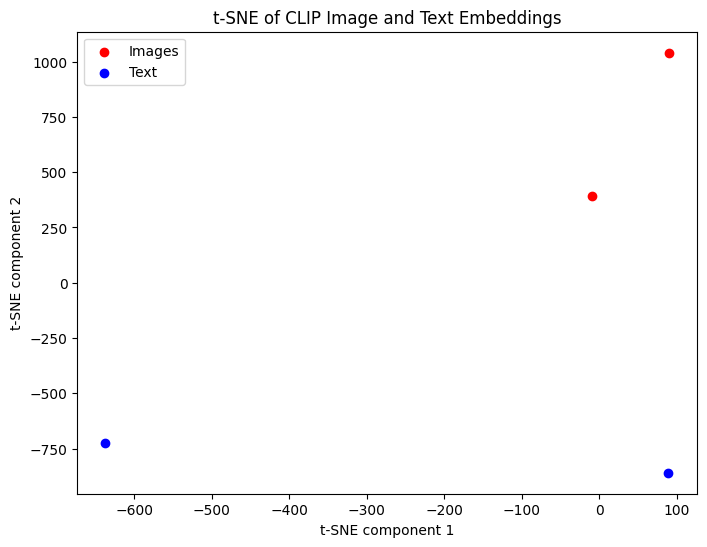

In [ ]:
# Perform t-SNE for dimensionality reduction (from high-dimensional embeddings to 2D)
tsne = TSNE(n_components=2, random_state=0, perplexity=2)
reduced_features = tsne.fit_transform(all_features.cpu().numpy())

# Split the reduced features for visualization (image and text embeddings)
image_reduced = reduced_features[:len(images)]
text_reduced = reduced_features[len(images):]

# Plot the embeddings
plt.figure(figsize=(8, 6))
plt.scatter(image_reduced[:, 0], image_reduced[:, 1], c='r', label='Images')
plt.scatter(text_reduced[:, 0], text_reduced[:, 1], c='b', label='Text')
plt.legend()
plt.title("t-SNE of CLIP Image and Text Embeddings")
plt.xlabel("t-SNE component 1")
plt.ylabel("t-SNE component 2")
plt.show()


In [ ]:
from transformers import AutoTokenizer, AutoModelForCausalLM
#4-1-2025

model_id = "utter-project/EuroLLM-1.7B-Instruct"
tokenizer = AutoTokenizer.from_pretrained(model_id)
model = AutoModelForCausalLM.from_pretrained(model_id)

text = '<|im_start|>system\n<|im_end|>\n<|im_start|>user\nTranslate the following English source text to Bulgarian:\nEnglish: I am a language model for european languages and the weather is very good - it is raining dogs and cows. \Bulgarian: <|im_end|>\n<|im_start|>assistant\n'

inputs = tokenizer(text, return_tensors="pt")
outputs = model.generate(**inputs, max_new_tokens=200)
print(tokenizer.decode(outputs[0], skip_special_tokens=True))

tokenizer_config.json:   0%|          | 0.00/47.4k [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/2.41M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/8.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/443 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/712 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/3.31G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/132 [00:00<?, ?B/s]

Setting `pad_token_id` to `eos_token_id`:4 for open-end generation.


system
 
 user
Translate the following English source text to Bulgarian:
English: I am a language model for european languages and the weather is very good - it is raining dogs and cows. \Bulgarian:  
 assistant
Аз съм модел за езици в Европейския съюз, и времето е много добро - ва


In [ ]:
text = '<|im_start|>system\n<|im_end|>\n<|im_start|>user\nTranslate the following English source text to Bulgarian:\nEnglish: I am a language model for european languages and the weather is very good - it is raining dogs and cows. \Bulgarian: <|im_end|>\n<|im_start|>assistant\n'

inputs = tokenizer(text, return_tensors="pt")
outputs = model.generate(**inputs, max_new_tokens=200)
print(tokenizer.decode(outputs[0], skip_special_tokens=True))

Setting `pad_token_id` to `eos_token_id`:4 for open-end generation.


system
 
 user
Translate the following English source text to Bulgarian:
English: I am a language model for european languages and the weather is very good - it is raining dogs and cows. \Bulgarian:  
 assistant
Чувам висше мое отпечатъци за европейски езици и времето е чудесно – дъжд с кучета и крави.


In [ ]:
# Много лоши резултати на български!
text = '<|im_start|>system\n<|im_end|>\n<|im_start|>user\nTranslate the following English source text to Bulgarian:\nEnglish: Fuck you asshole!. \Bulgarian: <|im_end|>\n<|im_start|>assistant\n'

inputs = tokenizer(text, return_tensors="pt")
outputs = model.generate(**inputs, max_new_tokens=200)
print(tokenizer.decode(outputs[0], skip_special_tokens=True))

Setting `pad_token_id` to `eos_token_id`:4 for open-end generation.


system
 
 user
Translate the following English source text to Bulgarian:
English: Fuck you asshole!. \Bulgarian:  
 assistant
Болка, ааш, същество!.


In [ ]:
!pip install pgmpy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 17.4 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
from pgmpy.models import BayesianNetwork
from pgmpy.estimators import ExpectationMaximization
data = pd.DataFrame(np.random.randint(low=0, high=2, size=(1000, 5)),
                      columns=['A', 'B', 'C', 'D', 'E'])
model = BayesianNetwork([('A', 'B'), ('C', 'B'), ('C', 'D'), ('B', 'E')])
estimator = ExpectationMaximization(model, data)
print(estimator)

import numpy as np
import pandas as pd
from pgmpy.models import BayesianNetwork
from pgmpy.estimators import ExpectationMaximization as EM
data = pd.DataFrame(np.random.randint(low=0, high=2, size=(1000, 3)),
                      columns=['A', 'C', 'D'])
model = BayesianNetwork([('A', 'B'), ('C', 'B'), ('C', 'D')], latents={'B'})
estimator = EM(model, data)
estimator.get_parameters(latent_card={'B': 3})

print(estimator)

  0%|          | 0/100 [00:00<?, ?it/s]

In [ ]:
#3-1-2025
# Import required modules
from pgmpy.factors.discrete import TabularCPD
from scipy.stats import entropy
import numpy as np

# Define the true distribution P (a Tabular CPD)
# Let's say we have a single random variable X with two states: 0 and 1
P_cpd = TabularCPD(variable="X", variable_card=3, values=[[0.1], [0.9], [0.0]])

# Define the learned/approximate distribution Q (another Tabular CPD)
Q_cpd = TabularCPD(variable="Y", variable_card=3, values=[[0.1], [0.8], [0.1]]) #, [0.1]])
#0.1, 0.2 are probabilities
#the same number of states! - so some could be just 0 if the other one has many states
#Q_cpd = TabularCPD(variable="Y", variable_card=2, values=[[0.1], [0.8], [0.1]]) error, the same shape

# Extract the probability arrays from the TabularCPDs
P_values = P_cpd.get_values().flatten()  # [0.8, 0.2]
Q_values = Q_cpd.get_values().flatten()  # [0.6, 0.4]

# Compute KL divergence (scipy's entropy function calculates D_KL(P || Q))
kl_div = entropy(P_values, Q_values, base=2)  # Use base 2 for bits (optional)

# Output the result
print(f"KL Divergence D_KL(P || Q): {kl_div}")

KL Divergence D_KL(P || Q): 0.15293250129808114


In [ ]:
#https://pgmpy.org/examples/Learning%20Parameters%20in%20Discrete%20Bayesian%20Networks.html
#Parameter Learning in Discrete Bayesian Networks
#In this notebook, we demonstrate examples of learning the parameters (CPDs) of a Discrete Bayesian Network given the data and the model structure. pgmpy has three main algorithms for learning model parameters:
#3-1-2025
"""
Maximum Likelihood Estimator (pgmpy.estimators.MaximumLikelihoodEstimator): Simply estimates the Maximum Likelihood estimates of the parameters.

Bayesian Estimator (pgmpy.estimators.BayesianEstimator): Allows users to specify priors.

Expectation Maximization (pgmpy.estimators.ExpectationMaximization): Enables learning model parameters when latent variables are present in the model.

Each of the parameter estimation classes have the following two methods:

estimate_cpd: Estimates the CPD of the specified variable.

get_parameters: Estimates the CPDs of all the variables in the model.

Step 0: Generate some simulated data and a model structure
To do parameter estimation we require two things: 1. Data: For the examples, we simulate some data from the alarm model (https://www.bnlearn.com/bnrepository/discrete-medium.html#alarm) and use it to learn back the model parameters. 2. Model structure: We also need to specify the model structure to which to fit the data to. In this example, we simply use the structure to the alarm model.
"""
from pgmpy.utils import get_example_model
from pgmpy.models import BayesianNetwork

# Load the alarm model and simulate data from it.
alarm_model = get_example_model(model="alarm")
samples = alarm_model.simulate(n_samples=int(1e3))

print(samples.head())

# Define a new model with the same structure as the alarm model.
new_model = BayesianNetwork(ebunch=alarm_model.edges())
"""
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: -1.4901161193847656e-08. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1175870895385742e-08. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1175870895385742e-08. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 2.2351741790771484e-08. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 2.2351741790771484e-08. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: -9.313225746154785e-09. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 2.2351741790771484e-08. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1175870895385742e-08. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: -9.313225746154785e-09. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: -1.6763806343078613e-08. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 2.2351741790771484e-08. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 2.2351741790771484e-08. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
WARNING:pgmpy:Probability values don't exactly sum to 1. Differ by: 1.1102230246251565e-16. Adjusting values.
   EXPCO2  INTUBATION    PCWP   HREKG VENTLUNG  SAO2 VENTALV PULMEMBOLUS  \
0     LOW      NORMAL  NORMAL    HIGH     ZERO   LOW    ZERO       FALSE
1     LOW      NORMAL  NORMAL  NORMAL     ZERO   LOW    ZERO       FALSE
2     LOW      NORMAL    HIGH    HIGH      LOW  HIGH    HIGH       FALSE
3  NORMAL    ONESIDED  NORMAL    HIGH      LOW   LOW     LOW       FALSE
4     LOW  ESOPHAGEAL     LOW    HIGH     ZERO   LOW     LOW       FALSE

  ERRLOWOUTPUT      HR  ... LVFAILURE KINKEDTUBE HISTORY HYPOVOLEMIA  \
0        FALSE  NORMAL  ...     FALSE      FALSE   FALSE       FALSE
1        FALSE    HIGH  ...     FALSE      FALSE   FALSE       FALSE
2         TRUE    HIGH  ...     FALSE      FALSE   FALSE        TRUE
3        FALSE    HIGH  ...     FALSE      FALSE   FALSE       FALSE
4        FALSE    HIGH  ...     FALSE      FALSE   FALSE       FALSE

  STROKEVOLUME VENTMACH VENTTUBE     CVP   SHUNT MINVOLSET
0       NORMAL   NORMAL      LOW  NORMAL  NORMAL    NORMAL
1       NORMAL      LOW     ZERO  NORMAL  NORMAL    NORMAL
2       NORMAL     HIGH     HIGH    HIGH  NORMAL    NORMAL
3       NORMAL   NORMAL      LOW  NORMAL    HIGH    NORMAL
4       NORMAL   NORMAL     ZERO     LOW  NORMAL    NORMAL

[5 rows x 37 columns]
Using the Maximumum Likelihood Estimator
"""
from pgmpy.estimators import MaximumLikelihoodEstimator

# Initialize the estimator object.
mle_est = MaximumLikelihoodEstimator(model=new_model, data=samples)
# Estimate the CPD of the node FIO2.
print(mle_est.estimate_cpd(node="FIO2"))
"""
+--------------+-------+
| FIO2(LOW)    | 0.058 |
+--------------+-------+
| FIO2(NORMAL) | 0.942 |
+--------------+-------+
"""
# Estimate the CPD of node CVP
mle_est.estimate_cpd(node="CVP")
#<TabularCPD representing P(CVP:3 | LVEDVOLUME:3) at 0x7b043ec68860>
# Estimate all the CPDs for `new_model`
all_cpds = mle_est.get_parameters(n_jobs=1)

# Add the estimated CPDs to the model.
new_model.add_cpds(*all_cpds)

# Check if the CPDs are added to the model
new_model.get_cpds('PCWP')
"""<TabularCPD representing P(PCWP:3 | LVEDVOLUME:3) at 0x7b0427cb85f0>
Using the Bayesian Estimator
"""
# Initialize the Bayesian Estimator
from pgmpy.estimators import BayesianEstimator

be_est = BayesianEstimator(model=new_model, data=samples)
#The estimator methods in BayesianEstimator class allows for a few different ways to specify the priors. The prior type can be chosen by specifying the prior_type argument. Please refer the documentation for details on different ways these priors can be specified: https://pgmpy.org/param_estimator/bayesian_est.html#bayesian-estimator

#Dirichlet prior (prior_type="dirichlet"): Requires specifying pseudo_counts argument. The pseudo_counts arguments specifies the priors to use for the CPD estimation.

#BDeu prior (prior_type="BDeu"): Requires specifying equivalent_sample_size arguemnt. The equivaluent_sample_size is used to compute the priors to use for CPD estimation.

#K2 (prior_type="K2"): Short hand for dirichlet prior with pseudo_count=1.

print(be_est.estimate_cpd(node="FIO2", prior_type="BDeu", equivalent_sample_size=1000))
print(be_est.estimate_cpd(node="CVP", prior_type="dirichlet", pseudo_counts=100))
"""
+--------------+-------+
| FIO2(LOW)    | 0.279 |
+--------------+-------+
| FIO2(NORMAL) | 0.721 |
+--------------+-------+
+-------------+---------------------+-----+---------------------+
| LVEDVOLUME  | LVEDVOLUME(HIGH)    | ... | LVEDVOLUME(NORMAL)  |
+-------------+---------------------+-----+---------------------+
| CVP(HIGH)   | 0.48841698841698844 | ... | 0.10685483870967742 |
+-------------+---------------------+-----+---------------------+
| CVP(LOW)    | 0.19884169884169883 | ... | 0.13709677419354838 |
+-------------+---------------------+-----+---------------------+
| CVP(NORMAL) | 0.3127413127413127  | ... | 0.7560483870967742  |
+-------------+---------------------+-----+---------------------+
be_est.get_parameters(prior_type="K2", equivalent_sample_size=1000)
[<TabularCPD representing P(HYPOVOLEMIA:2) at 0x7b050bad4590>,
 <TabularCPD representing P(LVEDVOLUME:3 | HYPOVOLEMIA:2, LVFAILURE:2) at 0x7b0427cb9c40>,
 <TabularCPD representing P(STROKEVOLUME:3 | HYPOVOLEMIA:2, LVFAILURE:2) at 0x7b0427cb9250>,
 <TabularCPD representing P(CVP:3 | LVEDVOLUME:3) at 0x7b0427cb9070>,
 <TabularCPD representing P(PCWP:3 | LVEDVOLUME:3) at 0x7b0427cbb080>,
 <TabularCPD representing P(LVFAILURE:2) at 0x7b0427cbb110>,
 <TabularCPD representing P(HISTORY:2 | LVFAILURE:2) at 0x7b0427cbaf90>,
 <TabularCPD representing P(CO:3 | HR:3, STROKEVOLUME:3) at 0x7b0427cbaa20>,
 <TabularCPD representing P(ERRLOWOUTPUT:2) at 0x7b0427cbb020>,
 <TabularCPD representing P(HRBP:3 | ERRLOWOUTPUT:2, HR:3) at 0x7b0427cbb2c0>,
 <TabularCPD representing P(ERRCAUTER:2) at 0x7b0427cbb4d0>,
 <TabularCPD representing P(HREKG:3 | ERRCAUTER:2, HR:3) at 0x7b0427cbb1a0>,
 <TabularCPD representing P(HRSAT:3 | ERRCAUTER:2, HR:3) at 0x7b0427cbac00>,
 <TabularCPD representing P(INSUFFANESTH:2) at 0x7b0427cba3c0>,
 <TabularCPD representing P(CATECHOL:2 | ARTCO2:3, INSUFFANESTH:2, SAO2:3, TPR:3) at 0x7b0427cbb170>,
 <TabularCPD representing P(ANAPHYLAXIS:2) at 0x7b0427cbaea0>,
 <TabularCPD representing P(TPR:3 | ANAPHYLAXIS:2) at 0x7b0427cbb200>,
 <TabularCPD representing P(BP:3 | CO:3, TPR:3) at 0x7b0427cbb0b0>,
 <TabularCPD representing P(KINKEDTUBE:2) at 0x7b0427cba1b0>,
 <TabularCPD representing P(PRESS:4 | INTUBATION:3, KINKEDTUBE:2, VENTTUBE:4) at 0x7b0427cb98e0>,
 <TabularCPD representing P(VENTLUNG:4 | INTUBATION:3, KINKEDTUBE:2, VENTTUBE:4) at 0x7b0427cbb350>,
 <TabularCPD representing P(FIO2:2) at 0x7b0427cbade0>,
 <TabularCPD representing P(PVSAT:3 | FIO2:2, VENTALV:4) at 0x7b0427cba900>,
 <TabularCPD representing P(SAO2:3 | PVSAT:3, SHUNT:2) at 0x7b0427cb8d70>,
 <TabularCPD representing P(PULMEMBOLUS:2) at 0x7b0427cbb2f0>,
 <TabularCPD representing P(PAP:3 | PULMEMBOLUS:2) at 0x7b0427cb9790>,
 <TabularCPD representing P(SHUNT:2 | INTUBATION:3, PULMEMBOLUS:2) at 0x7b0427cbb3e0>,
 <TabularCPD representing P(INTUBATION:3) at 0x7b0427cbb4a0>,
 <TabularCPD representing P(MINVOL:4 | INTUBATION:3, VENTLUNG:4) at 0x7b0427cbb530>,
 <TabularCPD representing P(VENTALV:4 | INTUBATION:3, VENTLUNG:4) at 0x7b0427cbb560>,
 <TabularCPD representing P(DISCONNECT:2) at 0x7b0427cbb590>,
 <TabularCPD representing P(VENTTUBE:4 | DISCONNECT:2, VENTMACH:4) at 0x7b0427cbb5c0>,
 <TabularCPD representing P(MINVOLSET:3) at 0x7b0427cbb5f0>,
 <TabularCPD representing P(VENTMACH:4 | MINVOLSET:3) at 0x7b0427cbb620>,
 <TabularCPD representing P(EXPCO2:4 | ARTCO2:3, VENTLUNG:4) at 0x7b0427cbb650>,
 <TabularCPD representing P(ARTCO2:3 | VENTALV:4) at 0x7b0427cbb680>,
 <TabularCPD representing P(HR:3 | CATECHOL:2) at 0x7b0427cbb6b0>]
Using Expectation Maximization
The Expectation Maximization (EM) estimator can work in the case when latent variables are present in the model. To simulate this scenario, we will specify some of the variables in our new_model as latents and drop those variables from samples to simulate missing data.
"""

model_latent = BayesianNetwork(alarm_model.edges(), latents={'HISTORY', 'CVP'})
samples_latent = samples.drop(['HISTORY', 'CVP'], axis=1)
from pgmpy.estimators import ExpectationMaximization as EM
em_est = EM(model=model_latent, data=samples_latent)
em_est.get_parameters()
"""
[<TabularCPD representing P(EXPCO2:4 | ARTCO2:3, VENTLUNG:4) at 0x7b0427e26930>,
 <TabularCPD representing P(INTUBATION:3) at 0x7b0427cbbe90>,
 <TabularCPD representing P(PCWP:3 | LVEDVOLUME:3) at 0x7b0427e27590>,
 <TabularCPD representing P(HREKG:3 | ERRCAUTER:2, HR:3) at 0x7b0427d01fd0>,
 <TabularCPD representing P(VENTLUNG:4 | INTUBATION:3, KINKEDTUBE:2, VENTTUBE:4) at 0x7b0427cb9eb0>,
 <TabularCPD representing P(SAO2:3 | PVSAT:3, SHUNT:2) at 0x7b0427e27d10>,
 <TabularCPD representing P(VENTALV:4 | INTUBATION:3, VENTLUNG:4) at 0x7b0427d019a0>,
 <TabularCPD representing P(PULMEMBOLUS:2) at 0x7b0427e260f0>,
 <TabularCPD representing P(ERRLOWOUTPUT:2) at 0x7b0427d01910>,
 <TabularCPD representing P(HR:3 | CATECHOL:2) at 0x7b0427d01bb0>,
 <TabularCPD representing P(HRSAT:3 | ERRCAUTER:2, HR:3) at 0x7b0427d02480>,
 <TabularCPD representing P(DISCONNECT:2) at 0x7b0427ca7290>,
 <TabularCPD representing P(ERRCAUTER:2) at 0x7b0427d01f40>,
 <TabularCPD representing P(CO:3 | HR:3, STROKEVOLUME:3) at 0x7b0427cba150>,
 <TabularCPD representing P(BP:3 | CO:3, TPR:3) at 0x7b0427d02720>,
 <TabularCPD representing P(LVEDVOLUME:3 | HYPOVOLEMIA:2, LVFAILURE:2) at 0x7b0427d02870>,
 <TabularCPD representing P(ANAPHYLAXIS:2) at 0x7b0427ca6c90>,
 <TabularCPD representing P(TPR:3 | ANAPHYLAXIS:2) at 0x7b0427d025a0>,
 <TabularCPD representing P(HRBP:3 | ERRLOWOUTPUT:2, HR:3) at 0x7b0427cba0c0>,
 <TabularCPD representing P(PVSAT:3 | FIO2:2, VENTALV:4) at 0x7b0427d02b10>,
 <TabularCPD representing P(CATECHOL:2 | ARTCO2:3, INSUFFANESTH:2, SAO2:3, TPR:3) at 0x7b0427cb96d0>,
 <TabularCPD representing P(INSUFFANESTH:2) at 0x7b0427cba8d0>,
 <TabularCPD representing P(FIO2:2) at 0x7b0427d02390>,
 <TabularCPD representing P(ARTCO2:3 | VENTALV:4) at 0x7b0427d02ab0>,
 <TabularCPD representing P(PAP:3 | PULMEMBOLUS:2) at 0x7b0427d01af0>,
 <TabularCPD representing P(MINVOL:4 | INTUBATION:3, VENTLUNG:4) at 0x7b0427d02fc0>,
 <TabularCPD representing P(PRESS:4 | INTUBATION:3, KINKEDTUBE:2, VENTTUBE:4) at 0x7b0427cbadb0>,
 <TabularCPD representing P(LVFAILURE:2) at 0x7b044b06f4a0>,
 <TabularCPD representing P(KINKEDTUBE:2) at 0x7b0427d02e10>,
 <TabularCPD representing P(HYPOVOLEMIA:2) at 0x7b0427d03170>,
 <TabularCPD representing P(STROKEVOLUME:3 | HYPOVOLEMIA:2, LVFAILURE:2) at 0x7b0427cbafc0>,
 <TabularCPD representing P(VENTMACH:4 | MINVOLSET:3) at 0x7b0427d02f30>,
 <TabularCPD representing P(VENTTUBE:4 | DISCONNECT:2, VENTMACH:4) at 0x7b0427d01ca0>,
 <TabularCPD representing P(SHUNT:2 | INTUBATION:3, PULMEMBOLUS:2) at 0x7b0427ca6e10>,
 <TabularCPD representing P(MINVOLSET:3) at 0x7b0427e256d0>,
 <TabularCPD representing P(CVP:2 | LVEDVOLUME:3) at 0x7b043ef333b0>,
 <TabularCPD representing P(HISTORY:2 | LVFAILURE:2) at 0x7b043ec68b60>]
Shortcut for learning and adding CPDs to the model
The BayesianNetwork class also provies a fit method that acts as a shortcut way to estimate and add CPDs to the model.
"""
# Shortcut for learning all the parameters and adding the CPDs to the model.

model_struct = BayesianNetwork(ebunch=alarm_model.edges())
model_struct.fit(data=samples, estimator=MaximumLikelihoodEstimator)
print(model_struct.get_cpds("FIO2"))

model_struct = BayesianNetwork(ebunch=alarm_model.edges())
model_struct.fit(
    data=samples,
    estimator=BayesianEstimator,
    prior_type="BDeu",
    equivalent_sample_size=1000,
)
print(model_struct.get_cpds("FIO2"))
"""
+--------------+-------+
| FIO2(LOW)    | 0.058 |
+--------------+-------+
| FIO2(NORMAL) | 0.942 |
+--------------+-------+
+--------------+-------+
| FIO2(LOW)    | 0.279 |
+--------------+-------+
| FIO2(NORMAL) | 0.721 |
+--------------+-------+
Logo

Navigation
Getting Started
Base Model Structures
Models
Parameterization
Exact Inference
Model Testing
Approximate Inference
Parameter Estimation
Structure Learning
Metrics for testing models
Reading/Writing to File
Plotting Models
Example Notebooks
Creating Discrete Bayesian Networks
Basic Operations on Bayesian Networks
Parameter Learning in Discrete Bayesian Networks
Structure Learning in Bayesian Networks
Learning Tree Structure from Data using the Chow-Liu Algorithm
Learning Tree-augmented Naive Bayes (TAN) Structure from Data
Inference in Discrete Bayesian Network
Causal Inference Examples
Causal Games
Monty Hall Problem
Simulating Data From Bayesian Networks
Extending pgmpy
Tutorial Notebooks
Quick search
©2023, Ankur Ankan. | Powered by Sphinx 7.4.7 & Alabaster 0.7.16 | Page source
from pgmpy.utils import get_example_model
from pgmpy.models import BayesianNetwork
"""
# Load the alarm model and simulate data from it.
alarm_model = get_example_model(model="alarm")
samples = alarm_model.simulate(n_samples=int(1e3))

print(samples.head())

# Define a new model with the same structure as the alarm model.
new_model = BayesianNetwork(ebunch=alarm_model.edges())
from pgmpy.estimators import MaximumLikelihoodEstimator

# Initialize the estimator object.
mle_est = MaximumLikelihoodEstimator(model=new_model, data=samples)
# Estimate the CPD of the node FIO2.
print(mle_est.estimate_cpd(node="FIO2"))
# Estimate the CPD of node CVP
mle_est.estimate_cpd(node="CVP")
# Estimate all the CPDs for `new_model`
all_cpds = mle_est.get_parameters(n_jobs=1)

# Add the estimated CPDs to the model.
new_model.add_cpds(*all_cpds)

# Check if the CPDs are added to the model
new_model.get_cpds('PCWP')
# Initialize the Bayesian Estimator
from pgmpy.estimators import BayesianEstimator

be_est = BayesianEstimator(model=new_model, data=samples)
print(be_est.estimate_cpd(node="FIO2", prior_type="BDeu", equivalent_sample_size=1000))
print(be_est.estimate_cpd(node="CVP", prior_type="dirichlet", pseudo_counts=100))
be_est.get_parameters(prior_type="K2", equivalent_sample_size=1000)
model_latent = BayesianNetwork(alarm_model.edges(), latents={'HISTORY', 'CVP'})
samples_latent = samples.drop(['HISTORY', 'CVP'], axis=1)
from pgmpy.estimators import ExpectationMaximization as EM
em_est = EM(model=model_latent, data=samples_latent)
em_est.get_parameters()
# Shortcut for learning all the parameters and adding the CPDs to the model.

model_struct = BayesianNetwork(ebunch=alarm_model.edges())
model_struct.fit(data=samples, estimator=MaximumLikelihoodEstimator)
print(model_struct.get_cpds("FIO2"))

model_struct = BayesianNetwork(ebunch=alarm_model.edges())
model_struct.fit(
    data=samples,
    estimator=BayesianEstimator,
    prior_type="BDeu",
    equivalent_sample_size=1000,
)
print(model_struct.get_cpds("FIO2"))


  0%|          | 0/37 [00:00<?, ?it/s]

   INTUBATION      BP  SAO2 PRESS PVSAT     PAP   SHUNT    HR    HRBP MINVOL  \
0      NORMAL    HIGH   LOW   LOW   LOW  NORMAL  NORMAL  HIGH    HIGH   ZERO   
1  ESOPHAGEAL     LOW   LOW  HIGH   LOW  NORMAL  NORMAL  HIGH    HIGH    LOW   
2      NORMAL     LOW   LOW  HIGH   LOW  NORMAL  NORMAL  HIGH    HIGH   ZERO   
3      NORMAL  NORMAL   LOW   LOW   LOW  NORMAL  NORMAL  HIGH    HIGH   ZERO   
4      NORMAL  NORMAL  HIGH  HIGH  HIGH  NORMAL  NORMAL   LOW  NORMAL   HIGH   

   ... ERRCAUTER     TPR LVFAILURE VENTALV      CO LVEDVOLUME    PCWP  \
0  ...     FALSE    HIGH     FALSE    ZERO    HIGH     NORMAL  NORMAL   
1  ...     FALSE  NORMAL     FALSE     LOW    HIGH        LOW     LOW   
2  ...     FALSE     LOW     FALSE    ZERO    HIGH     NORMAL  NORMAL   
3  ...     FALSE    HIGH      TRUE    ZERO     LOW        LOW     LOW   
4  ...     FALSE  NORMAL     FALSE    HIGH  NORMAL     NORMAL  NORMAL   

  VENTMACH     CVP ERRLOWOUTPUT  
0   NORMAL  NORMAL        FALSE  
1   NORMAL  

  0%|          | 0/100 [00:00<?, ?it/s]

+--------------+-------+
| FIO2(LOW)    | 0.052 |
+--------------+-------+
| FIO2(NORMAL) | 0.948 |
+--------------+-------+
+--------------+-------+
| FIO2(LOW)    | 0.276 |
+--------------+-------+
| FIO2(NORMAL) | 0.724 |
+--------------+-------+


  0%|          | 0/37 [00:00<?, ?it/s]

  INTUBATION      BP SAO2   PRESS PVSAT     PAP   SHUNT    HR    HRBP MINVOL  \
0     NORMAL     LOW  LOW    HIGH   LOW  NORMAL  NORMAL  HIGH    HIGH   ZERO   
1     NORMAL    HIGH  LOW    HIGH   LOW  NORMAL  NORMAL  HIGH  NORMAL   ZERO   
2     NORMAL     LOW  LOW    HIGH   LOW  NORMAL  NORMAL  HIGH    HIGH   ZERO   
3     NORMAL     LOW  LOW     LOW   LOW  NORMAL  NORMAL  HIGH    HIGH   ZERO   
4     NORMAL  NORMAL  LOW  NORMAL   LOW  NORMAL  NORMAL  HIGH    HIGH   ZERO   

   ... ERRCAUTER     TPR LVFAILURE VENTALV    CO LVEDVOLUME    PCWP VENTMACH  \
0  ...     FALSE    HIGH     FALSE    ZERO  HIGH     NORMAL  NORMAL   NORMAL   
1  ...     FALSE  NORMAL     FALSE    ZERO  HIGH       HIGH    HIGH   NORMAL   
2  ...     FALSE     LOW     FALSE    ZERO  HIGH       HIGH    HIGH     ZERO   
3  ...     FALSE     LOW     FALSE    ZERO  HIGH     NORMAL  NORMAL   NORMAL   
4  ...     FALSE    HIGH     FALSE    ZERO   LOW     NORMAL  NORMAL   NORMAL   

      CVP ERRLOWOUTPUT  
0  NORMAL    

  0%|          | 0/100 [00:00<?, ?it/s]

+--------------+-------+
| FIO2(LOW)    | 0.039 |
+--------------+-------+
| FIO2(NORMAL) | 0.961 |
+--------------+-------+
+--------------+--------+
| FIO2(LOW)    | 0.2695 |
+--------------+--------+
| FIO2(NORMAL) | 0.7305 |
+--------------+--------+


Building tree:   0%|          | 0/10.0 [00:00<?, ?it/s]

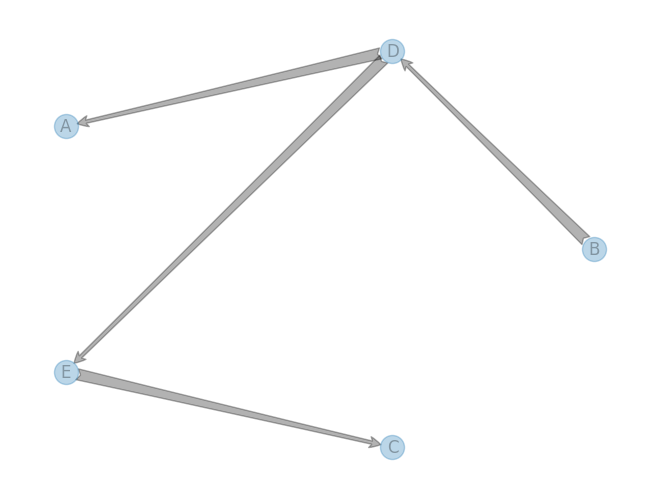

Building tree:   0%|          | 0/10.0 [00:00<?, ?it/s]

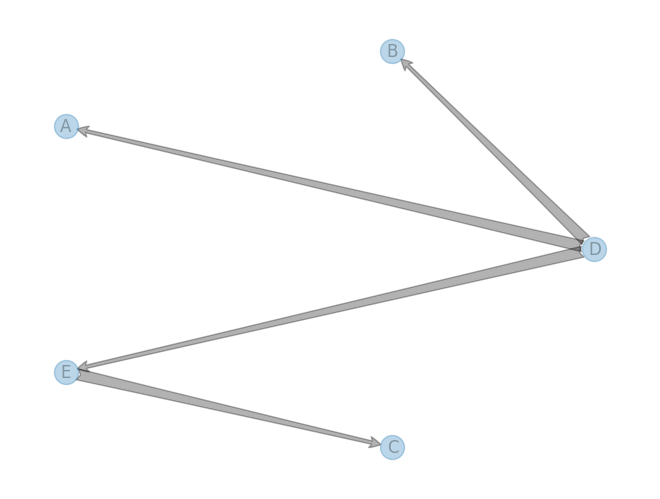

Building tree:   0%|          | 0/10.0 [00:00<?, ?it/s]

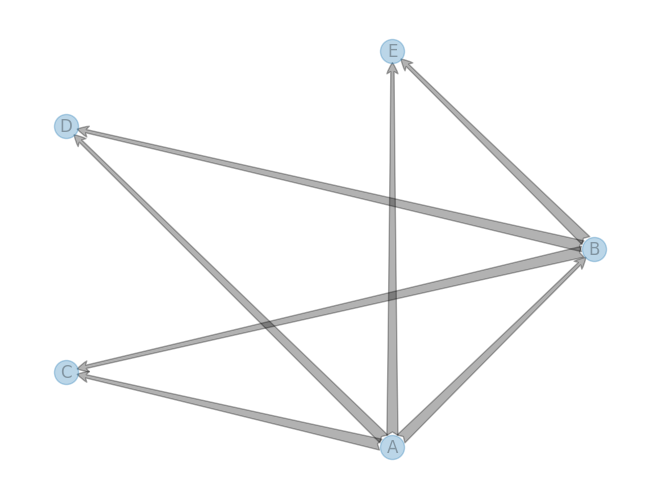

Building tree:   0%|          | 0/10.0 [00:00<?, ?it/s]

Building tree:   0%|          | 0/10.0 [00:00<?, ?it/s]

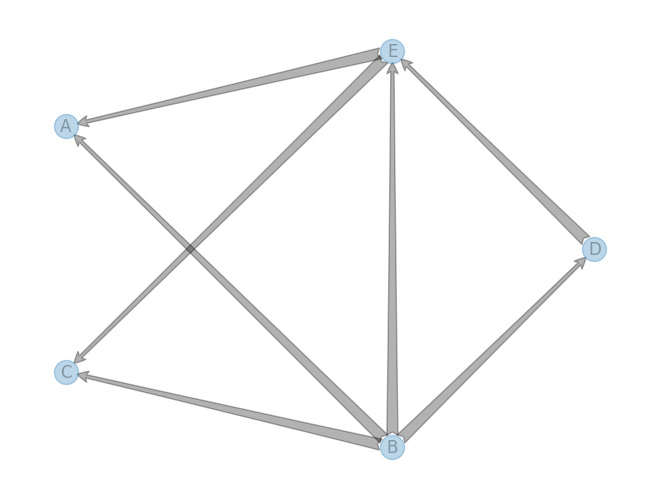

In [ ]:
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from pgmpy.estimators import TreeSearch
values = pd.DataFrame(np.random.randint(low=0, high=2, size=(1000, 5)),
                      columns=['A', 'B', 'C', 'D', 'E'])
est = TreeSearch(values, root_node='B')
model = est.estimate(estimator_type='chow-liu')
nx.draw_circular(model, with_labels=True, arrowsize=20, arrowstyle='fancy',
                 alpha=0.3)
plt.show()
est = TreeSearch(values)
model = est.estimate(estimator_type='chow-liu')
nx.draw_circular(model, with_labels=True, arrowsize=20, arrowstyle='fancy',
                 alpha=0.3)
plt.show()
est = TreeSearch(values, root_node='B')
model = est.estimate(estimator_type='tan', class_node='A')
nx.draw_circular(model, with_labels=True, arrowsize=20, arrowstyle='fancy',
                 alpha=0.3)
plt.show()
est = TreeSearch(values)
model = est.estimate(estimator_type='tan', class_node='B')
#model = est.estimate(estimator_type='tan', class_node='A')
nx.draw_circular(model, with_labels=True, arrowsize=20, arrowstyle='fancy',
                 alpha=0.3)
plt.show()

In [ ]:
#29-12-2024  DeepSeekv3  https://chat.deepseek.com/a/chat/s/e3b1abd5-dbe6-4f29-a0e9-cf73f86434f9
import numpy as np

# Define the vocabulary
vocab = ["the", "cat", "dog", "runs", "barks", "loudly", "sun", "shines", "brightly", "birds", "sing", "morning", "she", "reads", "book"]

# Define the true model P (as a dictionary of sentence probabilities)
P = {
    "the cat runs": 0.01,
    "a dog barks loudly": 0.005,
    "the sun shines brightly": 0.003,
    "birds sing in the morning": 0.002,
    "she reads a book": 0.004
}

# Define the approximate model Q (as a dictionary of sentence probabilities)
Q = {
    "the cat runs": 0.005,
    "a dog barks loudly": 0.002,
    "the sun shines brightly": 0.001,
    "birds sing in the morning": 0.0015,
    "she reads a book": 0.003
}

# Function to compute KL divergence
def kl_divergence(P, Q):
    """
    Compute KL divergence D_KL(P || Q) for two probability distributions P and Q.
    """
    kl_div = 0.0
    for sentence, p_prob in P.items():
        q_prob = Q.get(sentence, 1e-10)  # Avoid division by zero by adding a small epsilon
        if p_prob > 0:
            kl_div += p_prob * np.log(p_prob / q_prob)
    return kl_div

# Compute KL divergence
kl_div = kl_divergence(P, Q)
print(f"KL Divergence D_KL(P || Q): {kl_div:.4f}")

KL Divergence D_KL(P || Q): 0.0165


In [ ]:
!pip install pgmpy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 20.3 MB/s eta 0:00:00


In [ ]:
#31-12-2024

from pgmpy.models import DynamicBayesianNetwork as DBN
from pgmpy.factors.discrete import DiscreteFactor
from pgmpy.factors.discrete import TabularCPD
from pgmpy.inference import VariableElimination

# Create the DBN model
dbn = DBN()

# Add nodes and edges for the variables at time t=1
dbn.add_edges_from([(('X', 1), ('X', 2)),
                    (('Y', 1), ('Y', 2)),
                    (('X', 1), ('Y', 1))])

# Add conditional probability distributions (CPDs) for time t=1

# Define the nodes before adding the CPDs
dbn.add_nodes_from(['X', 'Y']) #This line adds the nodes to the DBN.


# P(X1)
cpd_X1 = TabularCPD(variable='X', variable_card=2,
                    values=[[0.7], [0.3]])  # P(X1 = 0) = 0.7, P(X1 = 1) = 0.3

# P(Y1 | X1)
cpd_Y1 = TabularCPD(variable='Y', variable_card=2,
                    values=[[0.9, 0.5], [0.1, 0.5]],  # P(Y1 | X1=0) = 0.9, P(Y1 | X1=1) = 0.5
                    evidence=['X'],
                    evidence_card=[2])

# Add CPDs to the model
dbn.add_cpds(cpd_X1, cpd_Y1)

# Add edges and CPDs for time t=2
# P(X2 | X1)
cpd_X2 = TabularCPD(variable='X', variable_card=2,
                    values=[[0.8, 0.2], [0.2, 0.8]],  # P(X2 | X1=0) = 0.8, P(X2 | X1=1) = 0.2
                    evidence=['X'],
                    evidence_card=[2])

# P(Y2 | X2, Y1)
cpd_Y2 = TabularCPD(variable='Y', variable_card=2,
                    values=[[0.8, 0.5, 0.6, 0.2], [0.2, 0.5, 0.4, 0.8]],  # P(Y2 | X2, Y1)
                    evidence=['X', 'Y'],
                    evidence_card=[2, 2])

# Add CPDs to the model
dbn.add_cpds(cpd_X2, cpd_Y2)

# Check if the model is valid
assert dbn.check_model()

# Display the model structure
print("Model Structure:")
print(dbn.edges())

ValueError: ('CPD defined on variable not in the model', <TabularCPD representing P(X:2) at 0x7cb634e9c0a0>)

In [ ]:
from pgmpy.models import DynamicBayesianNetwork as DBN
from pgmpy.factors.discrete import TabularCPD
from pgmpy.inference import VariableElimination

# Create a Dynamic Bayesian Network (DBN) model
dbn = DBN()

# Add nodes and edges for sentiment at time t=1 and t=2
# Sentiment at time 1 -> Sentiment at time 2
dbn.add_edges_from([(('sentiment', 1), ('sentiment', 2))])  # sentiment at t=1 -> sentiment at t+1

# Add CPDs for sentiment at time t = 1
cpd_sentiment_1 = TabularCPD(variable='sentiment_1', variable_card=3, values=[[1/3], [1/3], [1/3]])

# Transition probabilities for sentiment from time t to t+1
cpd_sentiment_transition = TabularCPD(variable='sentiment_2', variable_card=3,
                                      values=[[0.6, 0.3, 0.1],  # Positive -> Positive, Negative, Neutral
                                              [0.2, 0.6, 0.2],  # Negative -> Positive, Negative, Neutral
                                              [0.3, 0.3, 0.4]], # Neutral -> Positive, Negative, Neutral
                                      evidence=['sentiment_1'], evidence_card=[3])

# Add CPDs to the model
dbn.add_cpds(cpd_sentiment_1, cpd_sentiment_transition)

# Check the model's validity
assert dbn.check_model()

# Display the model structure
print("Model Structure:")
print(dbn.edges())

# Perform inference using Variable Elimination
inference = VariableElimination(dbn)

# Query the probability distribution for sentiment at time 2, given sentiment at time 1
result = inference.query(variables=['sentiment_2'], evidence={'sentiment_1': 1})  # Assume sentiment_1 = 1 (negative)

print("\nSentiment at time 2 (given sentiment at time 1 = negative):")
print(result)


ValueError: ('CPD defined on variable not in the model', <TabularCPD representing P(sentiment_1:3) at 0x7cb62e8df880>)

In [ ]:
# Generate random probabilities for P and Q
sentences = [" ".join(np.random.choice(vocab, size=np.random.randint(1, 8))) for _ in range(1000)]
P = {sentence: np.random.rand() for sentence in sentences}
Q = {sentence: np.random.rand() for sentence in sentences}

# Normalize to make them valid probability distributions
P_total = sum(P.values())
Q_total = sum(Q.values())
P = {sentence: prob / P_total for sentence, prob in P.items()}
Q = {sentence: prob / Q_total for sentence, prob in Q.items()}

# Compute KL divergence
kl_div = kl_divergence(P, Q)
print(f"KL Divergence D_KL(P || Q): {kl_div:.4f}")
print(sentences)

KL Divergence D_KL(P || Q): 0.4692
['barks', 'cat brightly', 'she', 'book loudly', 'shines dog brightly shines the morning cat', 'birds runs book', 'the birds', 'cat birds dog', 'sun the dog', 'brightly barks shines book book', 'she book', 'loudly book shines runs', 'reads', 'runs', 'cat dog cat', 'barks sing dog reads morning morning', 'the cat runs loudly she shines', 'morning sun brightly', 'birds loudly shines sun cat sun', 'loudly book loudly the loudly', 'sun cat runs shines cat morning sing', 'loudly birds she', 'barks she', 'dog morning sun brightly sun dog', 'dog cat barks shines', 'the runs cat brightly runs reads the', 'runs shines she cat reads sing shines', 'the dog dog', 'loudly', 'loudly brightly', 'brightly the birds', 'reads reads', 'loudly', 'loudly loudly dog barks runs runs', 'runs birds book birds', 'dog cat', 'she book cat', 'runs loudly shines', 'birds she', 'runs morning', 'reads dog', 'sun loudly shines morning shines', 'brightly barks barks shines', 'shines sh

In [ ]:
#25-12-2024 DenseNet and then timm: pytorch image models
#  https://huggingface.co/datasets/timm/imagenet-22k-wds     https://timm.fast.ai/models

import torch
import torch.nn as nn
import torch.nn.functional as F

class DenseLayer(nn.Module):
    def __init__(self, in_channels, growth_rate):
        super(DenseLayer, self).__init__()
        # A simple convolutional layer followed by batch normalization and ReLU
        self.conv = nn.Conv2d(in_channels, growth_rate, kernel_size=3, padding=1, bias=False)
        self.bn = nn.BatchNorm2d(growth_rate)

    def forward(self, x):
        out = F.relu(self.bn(self.conv(x)))
        return out

class DenseBlock(nn.Module):
    def __init__(self, num_layers, in_channels, growth_rate):
        super(DenseBlock, self).__init__()
        self.layers = nn.ModuleList()
        for i in range(num_layers):
            # Each layer receives the output from all previous layers in the block
            self.layers.append(DenseLayer(in_channels + i * growth_rate, growth_rate))

    def forward(self, x):
        for layer in self.layers:
            out = layer(x)
            x = torch.cat([x, out], dim=1)  # Concatenate input with output of the layer
        return x

class DenseNet(nn.Module):
    def __init__(self, num_blocks, num_layers_per_block, growth_rate, num_classes):
        super(DenseNet, self).__init__()
        self.initial_conv = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.blocks = nn.ModuleList()

        in_channels = 64
        for i in range(num_blocks):
            self.blocks.append(DenseBlock(num_layers_per_block, in_channels, growth_rate))
            in_channels += num_layers_per_block * growth_rate  # Increase the number of channels

        self.fc = nn.Linear(in_channels, num_classes)

    def forward(self, x):
        x = self.initial_conv(x)
        for block in self.blocks:
            x = block(x)
        x = F.adaptive_avg_pool2d(x, (1, 1))  # Global average pooling
        x = x.view(x.size(0), -1)  # Flatten the output for the fully connected layer
        x = self.fc(x)
        return x

# Example usage:
# Instantiate the model
model = DenseNet(num_blocks=3, num_layers_per_block=4, growth_rate=32, num_classes=10)

# Print model architecture
print(model)

# Dummy input tensor with 3 channels (RGB image) and 32x32 spatial dimensions
input_tensor = torch.randn(8, 3, 32, 32)

# Forward pass
output = model(input_tensor)
print("Output shape:", output.shape)

DenseNet(
  (initial_conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (blocks): ModuleList(
    (0): DenseBlock(
      (layers): ModuleList(
        (0): DenseLayer(
          (conv): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): DenseLayer(
          (conv): Conv2d(96, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (2): DenseLayer(
          (conv): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (3): DenseLayer(
          (conv): Conv2d(160, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn): Ba

In [ ]:
import timm
model = timm.create_model('densenet121', pretrained=True)
model.eval()

model.safetensors:   0%|          | 0.00/32.3M [00:00<?, ?B/s]

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNormAct2d(
      64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True
      (drop): Identity()
      (act): ReLU(inplace=True)
    )
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): DenseBlock(
      (denselayer1): DenseLayer(
        (norm1): BatchNormAct2d(
          64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True
          (drop): Identity()
          (act): ReLU(inplace=True)
        )
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNormAct2d(
          128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True
          (drop): Identity()
          (act): ReLU(inplace=True)
        )
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
  

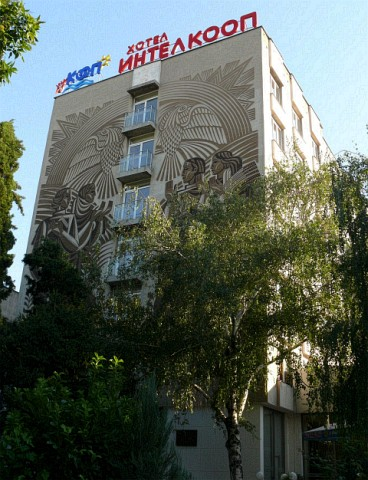

In [ ]:
import urllib
from PIL import Image
from timm.data import resolve_data_config
from timm.data.transforms_factory import create_transform

config = resolve_data_config({}, model=model)
transform = create_transform(**config)

url, filename = ("https://github.com/pytorch/hub/raw/master/images/dog.jpg", "dog.jpg")

p = "/content/dog.jpg"
p = "/content/d1.jpg"
p = "https://twenkid.com/mind/5-godini_hackafe_1.jpg" #https://twenkid.com/mind/IMG_20180419_124611x900.jpg" #https://twenkid.com/mind/IMG_20180419_122918.jpg" #https://twenkid.com/mind/hackkafez.jpg" #http://bulgariancomputers.freeservers.com/cgi-bin/i/pravetz-82/Pravetz-8C_ad_800x580.jpg"
p = "https://twenkid.com/mind/IMG_20180419_124611x900.jpg" #https://twenkid.com/mind/IMG_20180419_122918.jpg" #https://twenkid.com/mind/hackkafez.jpg" #http://bulgariancomputers.freeservers.com/cgi-bin/i/pravetz-82/Pravetz-8C_ad_800x580.jpg"
p = "https://twenkid.com/mind/SIGI-2012-3-800.jpg"
p = "https://twenkid.com/mind/intel_coop.jpg"
url, filename = (p, "dog.jpg")
urllib.request.urlretrieve(url, filename)
img = Image.open(filename).convert('RGB')
#img = Image.open(p).convert('RGB')
tensor = transform(img).unsqueeze(0) # transform and add batch dimension
img

In [ ]:
import torch
with torch.no_grad():
    out = model(tensor)
probabilities = torch.nn.functional.softmax(out[0], dim=0)
print(probabilities.shape)
# prints: torch.Size([1000])

torch.Size([1000])


In [ ]:
# Get imagenet class mappings
url, filename = ("https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt", "imagenet_classes.txt")
urllib.request.urlretrieve(url, filename)
with open("imagenet_classes.txt", "r") as f:
    categories = [s.strip() for s in f.readlines()]

# Print top categories per image
top5_prob, top5_catid = torch.topk(probabilities, 5)
for i in range(top5_prob.size(0)):
    print(categories[top5_catid[i]], top5_prob[i].item())
# prints class names and probabilities like:
# [('Samoyed', 0.6425196528434753), ('Pomeranian', 0.04062102362513542), ('keeshond', 0.03186424449086189), ('white wolf', 0.01739676296710968), ('Eskimo dog', 0.011717947199940681)]
print(categories)

mosque 0.19111719727516174
monastery 0.1569896787405014
bell cote 0.07150257378816605
church 0.07102788239717484
planetarium 0.06427378207445145
['tench', 'goldfish', 'great white shark', 'tiger shark', 'hammerhead', 'electric ray', 'stingray', 'cock', 'hen', 'ostrich', 'brambling', 'goldfinch', 'house finch', 'junco', 'indigo bunting', 'robin', 'bulbul', 'jay', 'magpie', 'chickadee', 'water ouzel', 'kite', 'bald eagle', 'vulture', 'great grey owl', 'European fire salamander', 'common newt', 'eft', 'spotted salamander', 'axolotl', 'bullfrog', 'tree frog', 'tailed frog', 'loggerhead', 'leatherback turtle', 'mud turtle', 'terrapin', 'box turtle', 'banded gecko', 'common iguana', 'American chameleon', 'whiptail', 'agama', 'frilled lizard', 'alligator lizard', 'Gila monster', 'green lizard', 'African chameleon', 'Komodo dragon', 'African crocodile', 'American alligator', 'triceratops', 'thunder snake', 'ringneck snake', 'hognose snake', 'green snake', 'king snake', 'garter snake', 'water s

In [ ]:

# Print top categories per image
top5_prob, top5_catid = torch.topk(probabilities, 5)
for i in range(top5_prob.size(0)):
    print(categories[top5_catid[i]], top5_prob[i].item())
# prints class names and probabilities like:
# [('Samoyed', 0.6425196528434753), ('Pomeranian', 0.04062102362513542), ('keeshond', 0.03186424449086189), ('white wolf', 0.01739676296710968), ('Eskimo dog', 0.011717947199940681)]
print(categories)

menu 0.36613836884498596
envelope 0.20427119731903076
book jacket 0.05949144810438156
binder 0.031576287001371384
cash machine 0.020592356100678444
['tench', 'goldfish', 'great white shark', 'tiger shark', 'hammerhead', 'electric ray', 'stingray', 'cock', 'hen', 'ostrich', 'brambling', 'goldfinch', 'house finch', 'junco', 'indigo bunting', 'robin', 'bulbul', 'jay', 'magpie', 'chickadee', 'water ouzel', 'kite', 'bald eagle', 'vulture', 'great grey owl', 'European fire salamander', 'common newt', 'eft', 'spotted salamander', 'axolotl', 'bullfrog', 'tree frog', 'tailed frog', 'loggerhead', 'leatherback turtle', 'mud turtle', 'terrapin', 'box turtle', 'banded gecko', 'common iguana', 'American chameleon', 'whiptail', 'agama', 'frilled lizard', 'alligator lizard', 'Gila monster', 'green lizard', 'African chameleon', 'Komodo dragon', 'African crocodile', 'American alligator', 'triceratops', 'thunder snake', 'ringneck snake', 'hognose snake', 'green snake', 'king snake', 'garter snake', 'wate

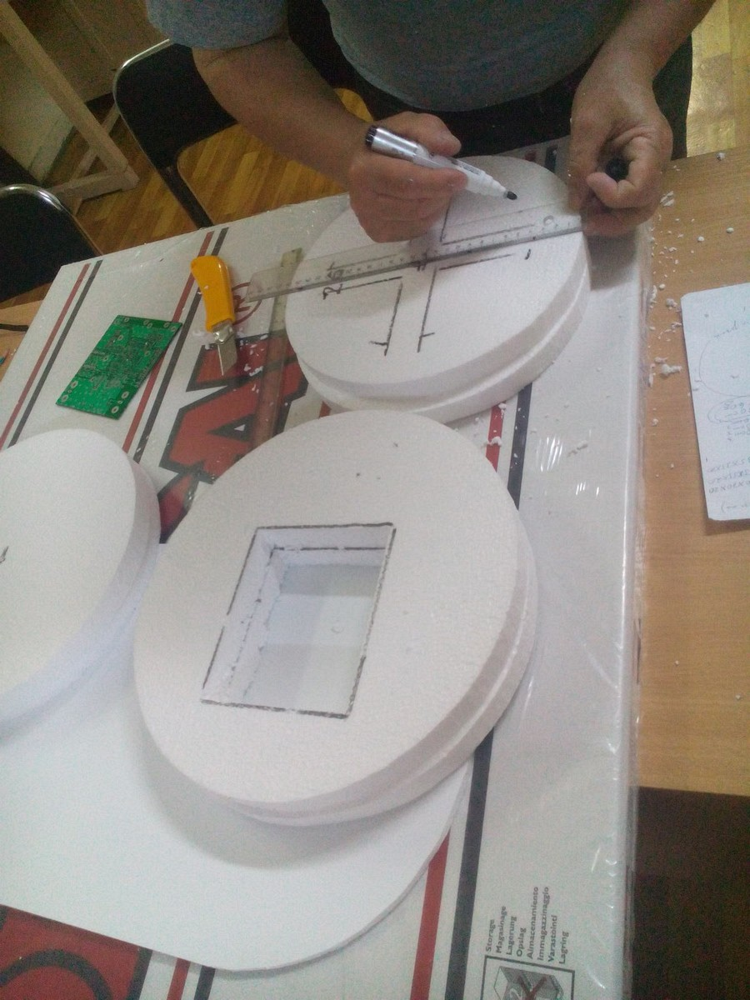

In [ ]:
img

In [ ]:
#3D, stereo, ... 19.12.2024
import numpy as np

# Function to compute the closest points on two skew rays
def closest_points_on_rays(P1, d1, P2, d2):
    # Vector between the origins of the rays
    P1P2 = P2 - P1

    # Compute the scalar t1 and t2 that minimize the distance between the rays
    d1_cross_d2 = np.cross(d1, d2)
    denom = np.dot(d1_cross_d2, d1_cross_d2)  # The denominator is always positive for skew rays

    # Find t1 and t2 using the formula for the shortest distance between two skew lines
    t1 = np.dot(np.cross(P1P2, d2), d1_cross_d2) / denom
    t2 = np.dot(np.cross(P1P2, d1), d1_cross_d2) / denom

    # Compute the closest points on each ray
    Q1 = P1 + t1 * d1
    Q2 = P2 + t2 * d2

    return Q1, Q2

# Function to compute the midpoint of the shortest line segment between two rays
def midpoint_of_shortest_segment(P1, d1, P2, d2):
    # Find the closest points on each ray
    Q1, Q2 = closest_points_on_rays(P1, d1, P2, d2)

    # Calculate the mid-point
    midpoint = (Q1 + Q2) / 2
    return midpoint

# Define the origin points and direction vectors for the two rays
P1 = np.array([1, 2, 3])  # Origin of Ray 1
d1 = np.array([1, 0, 0])  # Direction of Ray 1

P2 = np.array([4, 5, 6])  # Origin of Ray 2
d2 = np.array([0, 1, 0])  # Direction of Ray 2

# Compute the midpoint of the shortest line segment
midpoint = midpoint_of_shortest_segment(P1, d1, P2, d2)

print("Midpoint of the shortest line segment:", midpoint)


Midpoint of the shortest line segment: [4.  2.  4.5]


In [ ]:
#24-12-2024
import requests
import torch
from PIL import Image
from transformers import AlignProcessor, AlignModel

processor = AlignProcessor.from_pretrained("kakaobrain/align-base")
model = AlignModel.from_pretrained("kakaobrain/align-base")

url = "http://images.cocodataset.org/val2017/000000039769.jpg"
image = Image.open(requests.get(url, stream=True).raw)
candidate_labels = ["an image of a cat", "an image of a dog"]

inputs = processor(images=image ,text=candidate_labels, return_tensors="pt")

with torch.no_grad():
    outputs = model(**inputs)

# this is the image-text similarity score
logits_per_image = outputs.logits_per_image

# we can take the softmax to get the label probabilities
probs = logits_per_image.softmax(dim=1)
print(probs)

preprocessor_config.json:   0%|          | 0.00/508 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/399 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/5.25k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/690M [00:00<?, ?B/s]

tensor([[0.9981, 0.0019]])


In [ ]:
candidate_labels = ["an image of a TV", "an image of a remote", "an image of buttons", "an image of a sofa"]

inputs = processor(images=image ,text=candidate_labels, return_tensors="pt")

with torch.no_grad():
    outputs = model(**inputs)

# this is the image-text similarity score
logits_per_image = outputs.logits_per_image

# we can take the softmax to get the label probabilities
probs = logits_per_image.softmax(dim=1)
print(probs)

tensor([[0.0246, 0.8864, 0.0693, 0.0197]])


In [ ]:
candidate_labels = ["apple", "pear", "cucubmber", "human"]

inputs = processor(images=image ,text=candidate_labels, return_tensors="pt")

with torch.no_grad():
    outputs = model(**inputs)

# this is the image-text similarity score
logits_per_image = outputs.logits_per_image

# we can take the softmax to get the label probabilities
probs = logits_per_image.softmax(dim=1)
print(probs)

tensor([[0.1900, 0.0031, 0.6622, 0.1448]])


In [ ]:
#15-12-2024
from transformers import BertTokenizer, BertModel
import torch

# Initialize BERT tokenizer and model
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

# Two example sentences
sentence1 = "I went to the bank to deposit money."
sentence2 = "We sat on the river bank."
sentence3 = "I filled the bank with fish,went to the river and invested 100$ next day."

# Tokenize and get embeddings for both sentences
def get_word_embedding(sentence, target_word):
    # Tokenize the sentence
    inputs = tokenizer(sentence, return_tensors='pt')

    # Get model outputs
    outputs = model(**inputs)

    # Get the embeddings from the last hidden state
    embeddings = outputs.last_hidden_state[0]  # Remove batch dimension

    # Find the token index for the target word
    tokens = tokenizer.convert_ids_to_tokens(inputs['input_ids'][0])
    word_index = tokens.index(target_word)

    # Get the embedding for the target word
    return embeddings[word_index].detach().numpy()

# Get embeddings for "bank" in both contexts
bank1_embedding = get_word_embedding(sentence1, 'bank')
bank2_embedding = get_word_embedding(sentence2, 'bank')
bank3_embedding = get_word_embedding(sentence3, 'bank')

# Print first 10 dimensions of each embedding
print("First 10 dimensions of 'bank' (financial context):")
print(bank1_embedding[:10])
print("\nFirst 10 dimensions of 'bank' (riverside context):")
print(bank2_embedding[:10])
print("\nFirst 10 dimensions of 'bank' (mixed context):")
print(bank3_embedding[:10])

# Calculate cosine similarity between the two embeddings
cos_sim = torch.nn.functional.cosine_similarity(
    torch.tensor(bank1_embedding),
    torch.tensor(bank2_embedding),
    dim=0
)
print(f"\nCosine similarity between the 1,2 two 'bank' embeddings: {cos_sim:.4f}")


cos_sim2 = torch.nn.functional.cosine_similarity(
    torch.tensor(bank1_embedding),
    torch.tensor(bank3_embedding),
    dim=0
)
print(f"\nCosine similarity between the 1,3 two 'bank' embeddings: {cos_sim2:.4f}")


cos_sim3 = torch.nn.functional.cosine_similarity(
    torch.tensor(bank2_embedding),
    torch.tensor(bank3_embedding),
    dim=0
)
print(f"\nCosine similarity between the 2,3 two 'bank' embeddings: {cos_sim3:.4f}")


First 10 dimensions of 'bank' (financial context):
[ 0.70910347 -0.2590419  -0.01858745 -0.09361548  1.2636602   0.02228456
 -0.3096248   0.97135824 -0.10284936  0.20124735]

First 10 dimensions of 'bank' (riverside context):
[ 0.3673271  -0.6023078  -0.10507938 -0.30648026 -0.43910488  0.12196416
  0.15226263  1.547021    0.07655513 -0.45480222]

First 10 dimensions of 'bank' (mixed context):
[ 0.04418173 -0.03615598 -0.14434522 -0.00142033  0.67813957  0.5530255
 -0.18803146  0.469983    0.25422636 -0.5410964 ]

Cosine similarity between the 1,2 two 'bank' embeddings: 0.4919

Cosine similarity between the 1,3 two 'bank' embeddings: 0.5312

Cosine similarity between the 2,3 two 'bank' embeddings: 0.6172


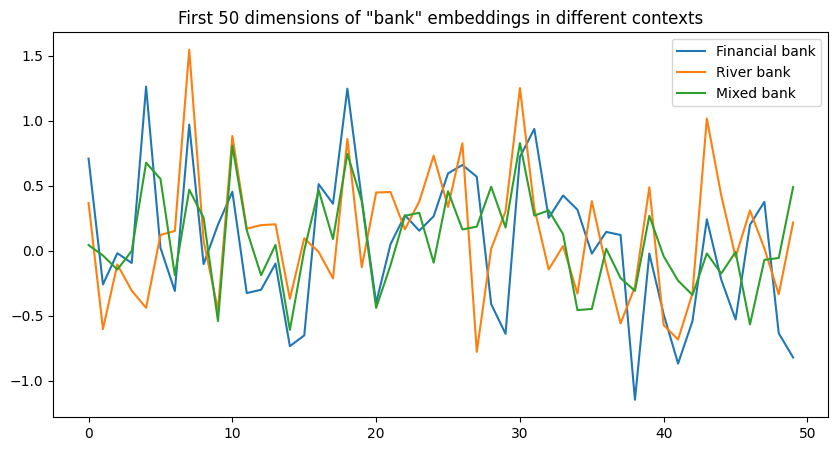

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.plot(bank1_embedding[:50], label='Financial bank')
plt.plot(bank2_embedding[:50], label='River bank')
plt.plot(bank3_embedding[:50], label='Mixed bank')
plt.title('First 50 dimensions of "bank" embeddings in different contexts')
plt.legend()
plt.show()

Plücker Coordinates: [1 2 3 4 5 6]


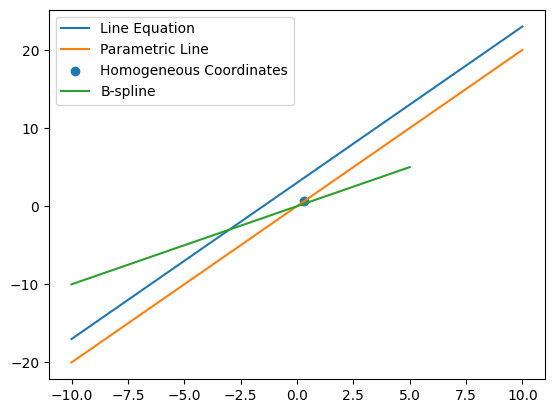

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Line Equation (y = mx + c)
def line_equation(x, m, c):
    return m * x + c

# Parametric Line Representation (x = x0 + at, y = y0 + bt)
def parametric_line(x0, y0, a, b, t):
    x = x0 + a * t
    y = y0 + b * t
    return x, y

# Homogeneous Coordinates (x, y, w)
def homogeneous_coordinates(x, y, w):
    return x / w, y / w

# Plücker Coordinates (L = (a, b, c, d, e, f))
def plucker_coordinates(a, b, c, d, e, f):
    return np.array([a, b, c, d, e, f])

# B-spline and NURBS (Non-uniform rational B-spline)
def bspline(x, y, t):
    t2 = t ** 2
    t3 = t ** 3
    mt = 1 - t
    mt2 = mt ** 2
    mt3 = mt ** 3
    x_new = mt3 * x[0] + 3 * mt2 * t * x[1] + 3 * mt * t2 * x[2] + t3 * x[3]
    y_new = mt3 * y[0] + 3 * mt2 * t * y[1] + 3 * mt * t2 * y[2] + t3 * y[3]
    return x_new, y_new

# Example usage
if __name__ == "__main__":
    # Line Equation
    m = 2
    c = 3
    x = np.linspace(-10, 10, 100)
    y = line_equation(x, m, c)
    plt.plot(x, y, label="Line Equation")

    # Parametric Line Representation
    x0 = 0
    y0 = 0
    a = 1
    b = 2
    t = np.linspace(-10, 10, 100)
    x, y = parametric_line(x0, y0, a, b, t)
    plt.plot(x, y, label="Parametric Line")

    # Homogeneous Coordinates
    x = 1
    y = 2
    w = 3
    x_new, y_new = homogeneous_coordinates(x, y, w)
    plt.scatter(x_new, y_new, label="Homogeneous Coordinates")

    # Plücker Coordinates
    a = 1
    b = 2
    c = 3
    d = 4
    e = 5
    f = 6
    L = plucker_coordinates(a, b, c, d, e, f)
    print("Plücker Coordinates:", L)

    # B-spline
    x = np.array([-10, -5, 0, 5])
    y = np.array([-10, -5, 0, 5])
    t = np.linspace(0, 1, 100)
    x_new = []
    y_new = []
    for ti in t:
        xi, yi = bspline(x, y, ti)
        x_new.append(xi)
        y_new.append(yi)
    plt.plot(x_new, y_new, label="B-spline")

    plt.legend()
    plt.show()

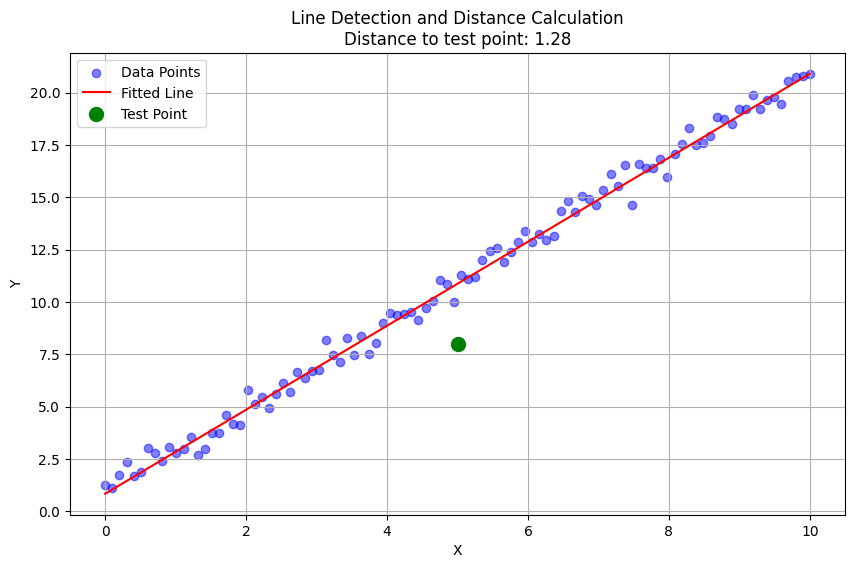

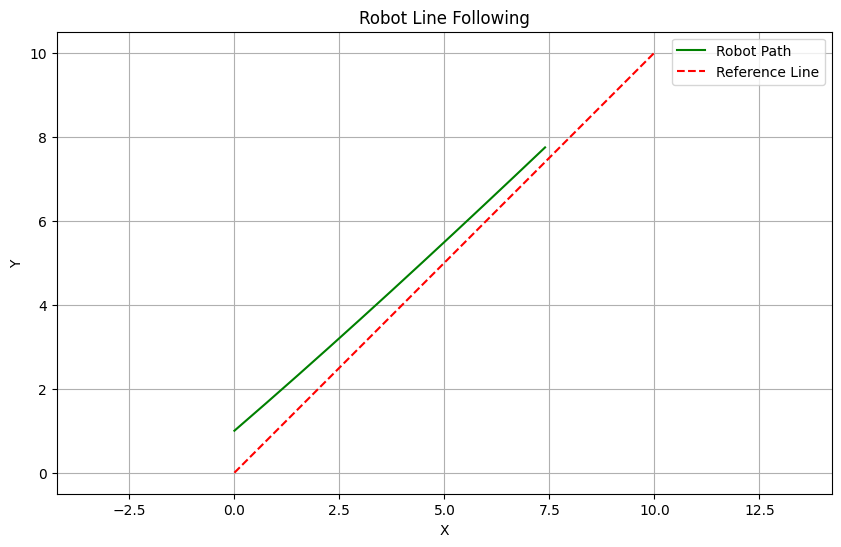

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import RANSACRegressor

class LineRepresentation:
    def __init__(self):
        pass

    # Parametric Form (Point and Direction)
    class ParametricLine:
        def __init__(self, point, direction):
            self.point = np.array(point, dtype=np.float64) #dtype=np.float64
            self.direction = np.array(direction) / np.linalg.norm(direction)

        def get_point_at_t(self, t):
            return self.point + t * self.direction

        def distance_to_point(self, point):
            point = np.array(point)
            v = point - self.point
            proj = np.dot(v, self.direction) * self.direction
            return np.linalg.norm(v - proj)

    # Implicit Form (ax + by + c = 0)
    class ImplicitLine:
        def __init__(self, a, b, c):
            self.a = a
            self.b = b
            self.c = c
            self.normalize()

        def normalize(self):
            norm = np.sqrt(self.a**2 + self.b**2)
            self.a /= norm
            self.b /= norm
            self.c /= norm

        def distance_to_point(self, point):
            x, y = point
            return abs(self.a*x + self.b*y + self.c)

    # Polar Form (ρ-θ representation)
    class PolarLine:
        def __init__(self, rho, theta):
            self.rho = rho
            self.theta = theta

        def to_implicit(self):
            a = np.cos(self.theta)
            b = np.sin(self.theta)
            c = -self.rho
            return LineRepresentation.ImplicitLine(a, b, c)

# Line Detection using RANSAC
def detect_lines_ransac(points, threshold=0.1):
    X = points[:, 0].reshape(-1, 1)
    y = points[:, 1]

    ransac = RANSACRegressor(residual_threshold=threshold)
    ransac.fit(X, y)

    # Get line parameters
    slope = ransac.estimator_.coef_[0]
    intercept = ransac.estimator_.intercept_

    return slope, intercept

# Example Usage and Visualization
def main():
    # Generate sample points with noise
    np.random.seed(42)
    x = np.linspace(0, 10, 100)
    y = 2*x + 1 + np.random.normal(0, 0.5, 100)
    points = np.column_stack((x, y))

    # Detect line using RANSAC
    slope, intercept = detect_lines_ransac(points)

    # Create different line representations
    # Parametric
    point = np.array([0, intercept])
    direction = np.array([1, slope])
    param_line = LineRepresentation.ParametricLine(point, direction)

    # Implicit (from slope-intercept to implicit form)
    a = slope
    b = -1
    c = intercept
    impl_line = LineRepresentation.ImplicitLine(a, b, c)

    # Visualization
    plt.figure(figsize=(10, 6))
    plt.scatter(x, y, c='blue', alpha=0.5, label='Data Points')
    plt.plot(x, slope*x + intercept, 'r-', label='Fitted Line')

    # Test points for distance calculation
    test_point = np.array([5, 8])
    dist_param = param_line.distance_to_point(test_point)
    dist_impl = impl_line.distance_to_point(test_point)

    plt.scatter([test_point[0]], [test_point[1]], c='green', s=100, label='Test Point')
    plt.title(f'Line Detection and Distance Calculation\nDistance to test point: {dist_param:.2f}')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.legend()
    plt.grid(True)
    plt.show()

# Line-based Robot Navigation Example
class RobotNavigation:
    def __init__(self, position, orientation):
        self.position = np.array(position,dtype=np.float64)
        self.orientation = orientation
        self.path = [position]

    def follow_line(self, line, steps=10):
        for _ in range(steps):
            # Calculate distance to line
            dist = line.distance_to_point(self.position)

            # Simple proportional control
            correction = dist * 0.1

            # Update position (simplified motion model)
            direction = line.direction
            self.position += direction - np.sign(dist) * correction * np.array([-direction[1], direction[0]])
            self.path.append(self.position.copy())

        return np.array(self.path)

if __name__ == "__main__":
    main()

    # Robot navigation demo
    robot = RobotNavigation([0, 1], 0)
    line = LineRepresentation.ParametricLine([0, 0], [1, 1])
    path = robot.follow_line(line)

    plt.figure(figsize=(10, 6))
    plt.plot(path[:, 0], path[:, 1], 'g-', label='Robot Path')
    plt.plot([0, 10], [0, 10], 'r--', label='Reference Line')
    plt.title('Robot Line Following')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.legend()
    plt.grid(True)
    plt.axis('equal')
    plt.show()

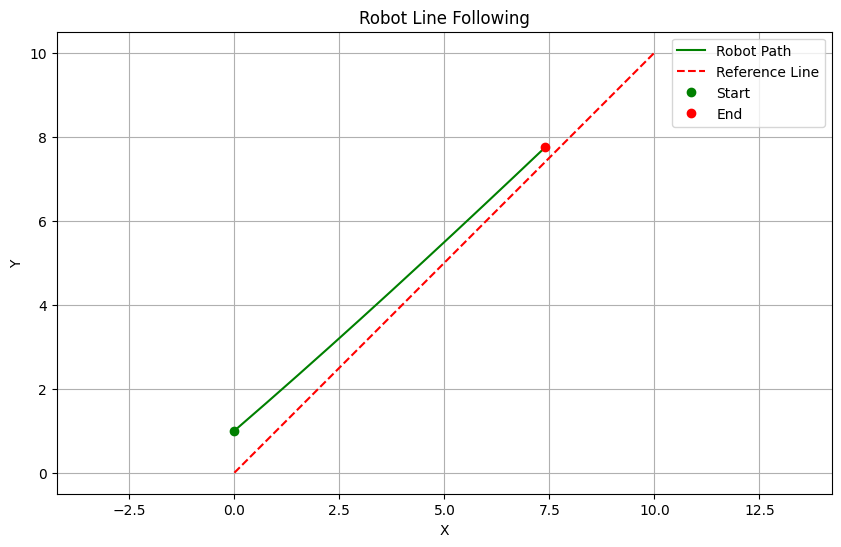

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import RANSACRegressor

class LineRepresentation:
    def __init__(self):
        pass

    # Parametric Form (Point and Direction)
    class ParametricLine:
        def __init__(self, point, direction):
            self.point = np.array(point, dtype=np.float64)
            self.direction = np.array(direction, dtype=np.float64)
            self.direction /= np.linalg.norm(self.direction)

        def get_point_at_t(self, t):
            return self.point + t * self.direction

        def distance_to_point(self, point):
            point = np.array(point, dtype=np.float64)
            v = point - self.point
            proj = np.dot(v, self.direction) * self.direction
            return np.linalg.norm(v - proj)

class RobotNavigation:
    def __init__(self, position, orientation):
        self.position = np.array(position, dtype=np.float64)  # Ensure float type
        self.orientation = float(orientation)
        self.path = [self.position.copy()]

    def follow_line(self, line, steps=10):
        for _ in range(steps):
            # Calculate distance to line
            dist = line.distance_to_point(self.position)

            # Simple proportional control
            correction = dist * 0.1

            # Update position (simplified motion model)
            direction = line.direction
            normal = np.array([-direction[1], direction[0]], dtype=np.float64)
            self.position += direction - np.sign(dist) * correction * normal
            self.path.append(self.position.copy())

        return np.array(self.path)

def main():
    # Generate sample points with noise
    np.random.seed(42)
    x = np.linspace(0, 10, 100)
    y = 2*x + 1 + np.random.normal(0, 0.5, 100)
    points = np.column_stack((x, y))

    # Create a parametric line for the robot to follow
    start_point = np.array([0.0, 0.0])
    direction = np.array([1.0, 1.0])
    line = LineRepresentation.ParametricLine(start_point, direction)

    # Create robot and simulate line following
    robot = RobotNavigation([0.0, 1.0], 0.0)
    path = robot.follow_line(line)

    # Visualization
    plt.figure(figsize=(10, 6))

    # Plot robot path
    plt.plot(path[:, 0], path[:, 1], 'g-', label='Robot Path')
    plt.plot([0, 10], [0, 10], 'r--', label='Reference Line')

    # Plot start and end points
    plt.plot(path[0, 0], path[0, 1], 'go', label='Start')
    plt.plot(path[-1, 0], path[-1, 1], 'ro', label='End')

    plt.title('Robot Line Following')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.legend()
    plt.grid(True)
    plt.axis('equal')
    plt.show()

if __name__ == "__main__":
    main()

In [ ]:
!pip install ai2thor

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.6/68.6 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.2/13.2 MB 24.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 182.2/182.2 kB 5.5 MB/s eta 0:00:00


In [ ]:
!apt-get update
!apt-get install -y xvfb x11-utils
!pip install pyvirtualdisplay

from pyvirtualdisplay import Display
display = Display(visible=0, size=(1400, 900))
display.start()

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:3 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:4 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Get:5 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:6 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Hit:7 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:9 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:11 http://archive.ubuntu.com/ubuntu jammy-updates/restricted amd64 Packages [3,446 kB]
Fetched 3,703 kB in 2s (1,548 kB/s)
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu j

In [ ]:
from pyvirtualdisplay import Display
display = Display(visible=0, size=(1400, 900))
display.start()

In [ ]:
from ai2thor.controller import Controller

controller = Controller(
    headless=False, #RIGHT! not headless True,  # Run in headless mode (no graphical output)
    scene="FloorPlan214", #1
    server_timeout=300,
    # Increase server start timeout to 300 seconds
    server_start_timeout=300,
    # renderDepthImage if you want depth frames
    renderDepthImage=False,
    # renderInstanceSegmentation if you want instance segmentation
    renderInstanceSegmentation=False
)

# Perform actions in the environment
controller.step(action='Initialize')
controller.step(action='MoveAhead')

<ai2thor.server.Event at 0x7d5fe2899390
    .metadata["lastAction"] = MoveAhead
    .metadata["lastActionSuccess"] = True
    .metadata["errorMessage"] = "
    .metadata["actionReturn"] = None
>

In [ ]:
# Get the list of all scenes (including floor plans)
all_scenes = controller.scene_names()

# Filter for floor plans (scenes starting with "FloorPlan")
floor_plans = [scene for scene in all_scenes if scene.startswith("FloorPlan")]

# Print the available floor plans
print("Available Floor Plans:")
for floor_plan in floor_plans:
    print(floor_plan)

Available Floor Plans:
FloorPlan1_physics
FloorPlan2_physics
FloorPlan3_physics
FloorPlan4_physics
FloorPlan5_physics
FloorPlan6_physics
FloorPlan7_physics
FloorPlan8_physics
FloorPlan9_physics
FloorPlan10_physics
FloorPlan11_physics
FloorPlan12_physics
FloorPlan13_physics
FloorPlan14_physics
FloorPlan15_physics
FloorPlan16_physics
FloorPlan17_physics
FloorPlan18_physics
FloorPlan19_physics
FloorPlan20_physics
FloorPlan21_physics
FloorPlan22_physics
FloorPlan23_physics
FloorPlan24_physics
FloorPlan25_physics
FloorPlan26_physics
FloorPlan27_physics
FloorPlan28_physics
FloorPlan29_physics
FloorPlan30_physics
FloorPlan201_physics
FloorPlan202_physics
FloorPlan203_physics
FloorPlan204_physics
FloorPlan205_physics
FloorPlan206_physics
FloorPlan207_physics
FloorPlan208_physics
FloorPlan209_physics
FloorPlan210_physics
FloorPlan211_physics
FloorPlan212_physics
FloorPlan213_physics
FloorPlan214_physics
FloorPlan215_physics
FloorPlan216_physics
FloorPlan217_physics
FloorPlan218_physics
FloorPla

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Take a step and get the frame
event = controller.step(action='LookDown')
#controller.step(action='MoveRight')
controller.step(action='MoveLeft')

frame = event.frame
# Display the frame using matplotlib
plt.imshow(frame)
plt.axis('off')
plt.show()

for i in range(20):
  print(i)
  #controller.step(action='MoveLeft')
  controller.step(action='RotateLeft', degrees=5)
  controller.step(action='LookUp', degrees=10)
  if i//2 == 0:
    frame = event.frame
    #if i>17:
    plt.imshow(frame)
    plt.axis('off')
    plt.show()



ValueError: write to closed file

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

# Function to display the current frame
def display_frame(event):
    img = Image.fromarray(event.frame) # convert event.frame to PIL Image
    plt.imshow(img)
    plt.show()


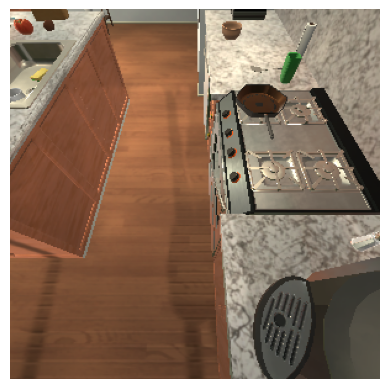

0
RotateLeft action failed. Error: InvalidOperationException: Cannot rotate by 0 degrees as this previously defaulted to rotating by a diferent amount.. trace:   at UnityStandardAssets.Characters.FirstPerson.PhysicsRemoteFPSAgentController.RotateLeft (System.Nullable`1[T] degrees, System.Boolean manualInteract, System.Boolean forceAction, System.Single speed, System.Boolean waitForFixedUpdate, System.Boolean returnToStart, System.Boolean disableRendering, System.Single fixedDeltaTime) [0x00034] in <40d6a6c54fa349fab67f7470c3432f83>:0 
  at (wrapper managed-to-native) System.Reflection.MonoMethod.InternalInvoke(System.Reflection.MonoMethod,object,object[],System.Exception&)
  at System.Reflection.MonoMethod.Invoke (System.Object obj, System.Reflection.BindingFlags invokeAttr, System.Reflection.Binder binder, System.Object[] parameters, System.Globalization.CultureInfo culture) [0x00032] in <695d1cc93cca45069c528c15c9fdd749>:0 
Event metadata: {'objects': [{'name': 'ArmChair_bd3270d9', '

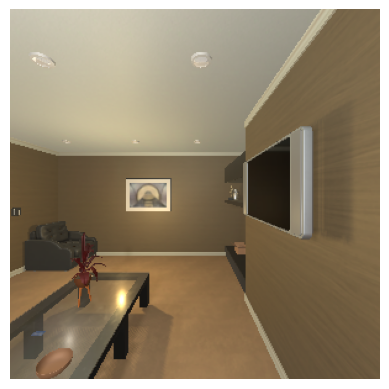

1
RotateLeft action was successful.
True


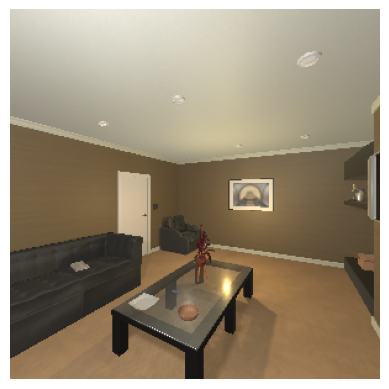

2
RotateLeft action was successful.
True


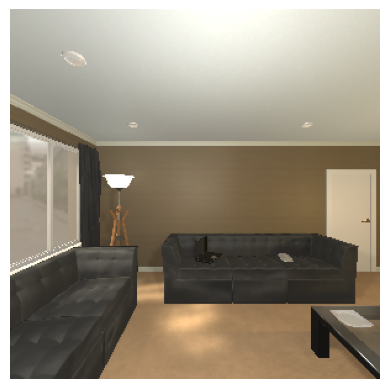

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL

# Function to display the current frame
def display_frame(event):
    img = Image.fromarray(event.frame) # convert event.frame to PIL Image
    plt.imshow(img)
    plt.show()

# Take a step and get the frame
#event = controller.step(action='LookDown')
#controller.step(action='MoveRight')
#controller.step(action='MoveLeft')
controller.step(action='MoveRight')

frame = event.frame
# Display the frame using matplotlib
plt.imshow(frame)
plt.axis('off')
plt.show()

left = 0
up = 0
st = 30
bAll = True
for i in range(3):
  print(i)
  #controller.step(action='MoveLeft')
  #controller.step(action='RotateLeft', degrees=left) #must assign to event!
  event = controller.step(action='RotateLeft', degrees=left)
  # Check for action success and print metadata
  if event.metadata['lastActionSuccess']:
       print("RotateLeft action was successful.")
  else:
    print("RotateLeft action failed. Error:", event.metadata['errorMessage'])
    print("Event metadata:", event.metadata)

  #event = controller.step(action='LookUp', degrees=up)
  #print(event.metadata['lastActionSuccess'])
  event = controller.step(action='MoveBack')
  print(event.metadata['lastActionSuccess'])
  #display_frame(event)
  #"""
  if bAll or i//2 == 0: #2
    frame = event.frame
    #if i>17:
    plt.imshow(frame)
    plt.axis('off')
    plt.show()
  #"""
  up+=st; left+=st



0
RotateLeft action failed. Error: StoveTopDoor1 is blocking Agent 0 from moving by (0.0000, 0.0000, 0.2500).
Event metadata: {'objects': [{'name': 'Apple_f33eaaa0', 'position': {'x': -1.0949554443359375, 'y': 0.9632999897003174, 'z': -0.01994890719652176}, 'rotation': {'x': 3.46158766746521, 'y': 309.2325744628906, 'z': 269.8892822265625}, 'visible': False, 'isInteractable': False, 'receptacle': False, 'toggleable': False, 'isToggled': False, 'breakable': False, 'isBroken': False, 'canFillWithLiquid': False, 'isFilledWithLiquid': False, 'fillLiquid': None, 'dirtyable': False, 'isDirty': False, 'canBeUsedUp': False, 'isUsedUp': False, 'cookable': False, 'isCooked': False, 'temperature': 'RoomTemp', 'isHeatSource': False, 'isColdSource': False, 'sliceable': True, 'isSliced': False, 'openable': False, 'isOpen': False, 'openness': 0.0, 'pickupable': True, 'isPickedUp': False, 'moveable': False, 'mass': 0.20000000298023224, 'salientMaterials': ['Food'], 'receptacleObjectIds': None, 'distan

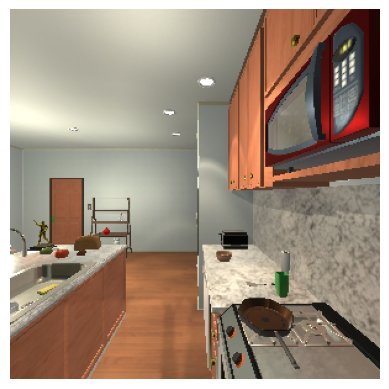

1
RotateLeft action failed. Error: StoveTopDoor1 is blocking Agent 0 from moving by (0.0000, 0.0000, 0.2500).
Event metadata: {'objects': [{'name': 'Apple_f33eaaa0', 'position': {'x': -1.0949554443359375, 'y': 0.9632999897003174, 'z': -0.01994890719652176}, 'rotation': {'x': 3.46158766746521, 'y': 309.2325744628906, 'z': 269.8892822265625}, 'visible': False, 'isInteractable': False, 'receptacle': False, 'toggleable': False, 'isToggled': False, 'breakable': False, 'isBroken': False, 'canFillWithLiquid': False, 'isFilledWithLiquid': False, 'fillLiquid': None, 'dirtyable': False, 'isDirty': False, 'canBeUsedUp': False, 'isUsedUp': False, 'cookable': False, 'isCooked': False, 'temperature': 'RoomTemp', 'isHeatSource': False, 'isColdSource': False, 'sliceable': True, 'isSliced': False, 'openable': False, 'isOpen': False, 'openness': 0.0, 'pickupable': True, 'isPickedUp': False, 'moveable': False, 'mass': 0.20000000298023224, 'salientMaterials': ['Food'], 'receptacleObjectIds': None, 'distan

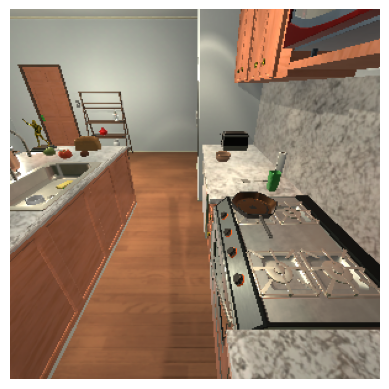

2
RotateLeft action failed. Error: StoveTopDoor1 is blocking Agent 0 from moving by (0.0000, 0.0000, 0.2500).
Event metadata: {'objects': [{'name': 'Apple_f33eaaa0', 'position': {'x': -1.0949554443359375, 'y': 0.9632999897003174, 'z': -0.01994890719652176}, 'rotation': {'x': 3.46158766746521, 'y': 309.2325744628906, 'z': 269.8892822265625}, 'visible': False, 'isInteractable': False, 'receptacle': False, 'toggleable': False, 'isToggled': False, 'breakable': False, 'isBroken': False, 'canFillWithLiquid': False, 'isFilledWithLiquid': False, 'fillLiquid': None, 'dirtyable': False, 'isDirty': False, 'canBeUsedUp': False, 'isUsedUp': False, 'cookable': False, 'isCooked': False, 'temperature': 'RoomTemp', 'isHeatSource': False, 'isColdSource': False, 'sliceable': True, 'isSliced': False, 'openable': False, 'isOpen': False, 'openness': 0.0, 'pickupable': True, 'isPickedUp': False, 'moveable': False, 'mass': 0.20000000298023224, 'salientMaterials': ['Food'], 'receptacleObjectIds': None, 'distan

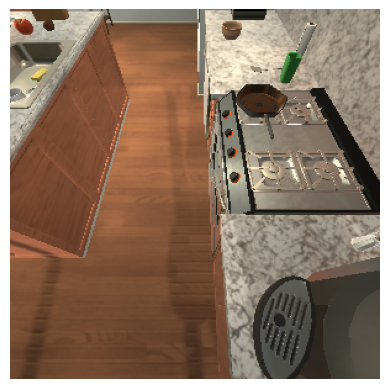

3
RotateLeft action failed. Error: StoveTopDoor1 is blocking Agent 0 from moving by (0.0000, 0.0000, 0.2500).
Event metadata: {'objects': [{'name': 'Apple_f33eaaa0', 'position': {'x': -1.0949554443359375, 'y': 0.9632999897003174, 'z': -0.01994890719652176}, 'rotation': {'x': 3.46158766746521, 'y': 309.2325744628906, 'z': 269.8892822265625}, 'visible': False, 'isInteractable': False, 'receptacle': False, 'toggleable': False, 'isToggled': False, 'breakable': False, 'isBroken': False, 'canFillWithLiquid': False, 'isFilledWithLiquid': False, 'fillLiquid': None, 'dirtyable': False, 'isDirty': False, 'canBeUsedUp': False, 'isUsedUp': False, 'cookable': False, 'isCooked': False, 'temperature': 'RoomTemp', 'isHeatSource': False, 'isColdSource': False, 'sliceable': True, 'isSliced': False, 'openable': False, 'isOpen': False, 'openness': 0.0, 'pickupable': True, 'isPickedUp': False, 'moveable': False, 'mass': 0.20000000298023224, 'salientMaterials': ['Food'], 'receptacleObjectIds': None, 'distan

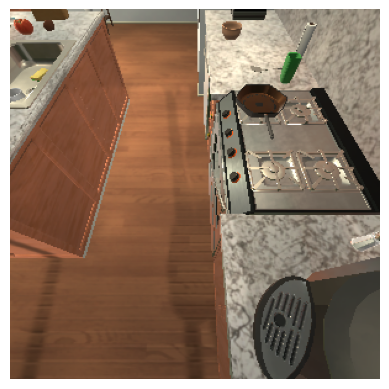

In [ ]:
for i in range(4):
  print(i)
  #controller.step(action='MoveLeft')
  #controller.step(action='RotateLeft', degrees=left) #must assign to event!
  event = controller.step(action='MoveAhead')
  # Check for action success and print metadata
  if event.metadata['lastActionSuccess']:
       print("RotateLeft action was successful.")
  else:
    print("RotateLeft action failed. Error:", event.metadata['errorMessage'])
    print("Event metadata:", event.metadata)

  event = controller.step(action='LookDown', degrees=30)
  #print(event.metadata['lastActionSuccess'])
  #event = controller.step(action='MoveBack')
  #print(event.metadata['lastActionSuccess'])
  #display_frame(event)
  #"""
  if bAll or i//2 == 0: #2
    frame = event.frame
    #if i>17:
    plt.imshow(frame)
    plt.axis('off')
    plt.show()
  #"""
  up+=st; left+=st


In [ ]:
for i in range(1):
  print(i)
  event=controller.step(action='MoveLeft')
  #controller.step(action='RotateLeft', degrees=left) #must assign to event!
  event = controller.step(action='MoveAhead')
  # Check for action success and print metadata
  if event.metadata['lastActionSuccess']:
       print("MoveLeft action was successful.")
  else:
    print("RotateLeft action failed. Error:", event.metadata['errorMessage'])
    print("Event metadata:", event.metadata)

  #event = controller.step(action='LookDown', degrees=30)
  #print(event.metadata['lastActionSuccess'])
  #event = controller.step(action='MoveBack')
  #print(event.metadata['lastActionSuccess'])
  #display_frame(event)
  #"""
  if bAll or i//2 == 0: #2
    frame = event.frame
    #if i>17:
    plt.imshow(frame)
    plt.axis('off')
    plt.show()
  #"""
  up+=st; left+=st


0


ValueError: write to closed file

In [ ]:
# Teleport to a position behind and above the agent for third-person view
event = controller.step(
    action="TeleportFull",
    x=0.0, #-1.25,
    y=0.94,
    z=-0.5,
    #rotation=dict(x=0, y=180, z=0),
    #horizon=30  # Adjust horizon for camera angle
    rotation=dict(x=0, y=180, z=0),  # Provide rotation as a dictionary
    horizon=30,  # Provide horizon as a value (it's not a dictionary)
    standing=True
)
print(event.metadata['lastActionSuccess'])
print("Error:", event.metadata['errorMessage'])
print("Event metadata:", event.metadata)
display_frame(event)

TimeoutError: Error encountered when running action {'action': 'TeleportFull', 'x': 0.0, 'y': 0.94, 'z': -0.5, 'rotation': {'x': 0, 'y': 180, 'z': 0}, 'horizon': 30, 'standing': True, 'sequenceId': 86} in scene FloorPlan10_physics.

In [ ]:
print(left,up)

45 45


In [ ]:
#4-12-2024 3M lines ... Google question-answers short ... Allen
!git clone https://github.com/allenai/gooaq

Cloning into 'gooaq'...
remote: Enumerating objects: 95, done.
remote: Counting objects: 100% (95/95), done.
remote: Compressing objects: 100% (64/64), done.
remote: Total 95 (delta 36), reused 79 (delta 26), pack-reused 0 (from 0)
Receiving objects: 100% (95/95), 31.27 KiB | 1.20 MiB/s, done.
Resolving deltas: 100% (36/36), done.
Filtering content: 100% (2/2), 1.96 GiB | 22.77 MiB/s, done.


In [ ]:
import pandas as pd
import json
p = "/content/gooaq/data/gooaq.jsonl"
p = "/content/gooaq/data/split.json"
#p = "/content/gooaq/data/"
""""
# The file is a JSON Lines file, so we need to read it line by line
# and then concatenate the resulting DataFrames.
df = pd.concat([pd.read_json(line, lines=True) for line in open(p)], ignore_index=True)
"""
#df = pd.concat([pd.read_json(line, lines=True) for line in open(p)], ignore_index=True)
#df = pd.read_json(p)

# Read the JSON file into a list of dictionaries
with open(p, 'r') as f:
    data = [json.loads(line) for line in f]
    # json.loads is used to parse each line since split.json may be a JSON Lines file

# Convert the list of dictionaries to a DataFrame
df = pd.DataFrame(data)
# Pandas will automatically handle potential inconsistencies in data



display(df.head())


JSONDecodeError: Expecting property name enclosed in double quotes: line 2 column 1 (char 2)

In [ ]:
f = open(p, "rt")
a = json.load(f)
f.close(f)


NameError: name 'close' is not defined

In [ ]:
print(a)

Buffered data was truncated after reaching the output size limit.

In [ ]:
import json

arr = []
def print_first_10_lines(file_path,r):
  """Prints the first 10 lines of a JSON Lines file."""
  with open(file_path, 'r') as f:
    for i in range(r):
      line = f.readline()
      if line:  # Check if the line is not empty
        try:
          data = json.loads(line)  # Parse the JSON data
          #print(data)
          arr.append(data)
        except json.JSONDecodeError as e:
          print(f"Error decoding JSON on line {i + 1}: {e}")
      else:
        print(f"File has less than 10 lines.")
        break

# Example usage:
file_path = '/content/gooaq/data/gooaq.jsonl'  # Replace with your file path
print_first_10_lines(file_path,100000)

for i in range(25000,25100):
    print(arr[i])

{'id': 25001, 'question': '1 meters means how many centimeters?', 'short_answer': '100 Centimeters', 'answer': '1 Meter = 100 Centimeters 1 Meter is equal to 100 cm.', 'answer_type': 'feat_snip', 'answer_url': 'https://www.asknumbers.com/meters-to-cm.aspx#:~:text=1%20Meter%20%3D%20100%20Centimeters&text=1%20Meter%20is%20equal%20to%20100%20cm.'}
{'id': 25002, 'question': '1 meters means how many cm?', 'short_answer': '100 Centimeters', 'answer': '1 Meter = 100 Centimeters 1 Meter is equal to 100 cm.', 'answer_type': 'feat_snip', 'answer_url': 'https://www.asknumbers.com/meters-to-cm.aspx#:~:text=1%20Meter%20%3D%20100%20Centimeters&text=1%20Meter%20is%20equal%20to%20100%20cm.'}
{'id': 25003, 'question': '1 meters means how many feet?', 'short_answer': '3.280839895 Feet', 'answer': '1 Meter = 3.280839895 Feet 1 Meter is equal to 3 feet and 3.3700787 inches.', 'answer_type': 'feat_snip', 'answer_url': 'https://www.asknumbers.com/meters-to-feet.aspx#:~:text=1%20Meter%20%3D%203.280839895%20F

In [ ]:
import json

arr = []
def print_first_10_lines(file_path,r):
  """Prints the first 10 lines of a JSON Lines file."""
  with open(file_path, 'r') as f:
    for i in range(r):
      line = f.readline()
      if line:  # Check if the line is not empty
        try:
          data = json.loads(line)  # Parse the JSON data
          #print(data)
          arr.append(data)
        except json.JSONDecodeError as e:
          print(f"Error decoding JSON on line {i + 1}: {e}")
      else:
        print(f"File has less than 10 lines.")
        break

# Example usage:
file_path = '/content/gooaq/data/gooaq.jsonl'  # Replace with your file path
file_path = '/content/gooaq/data/split.json'  # Replace with your file path
print_first_10_lines(file_path,100000)

for i in range(25000,25100):
    print(arr[i])

Streaming output truncated to the last 5000 lines.
Error decoding JSON on line 93335: Expecting value: line 2 column 1 (char 10)
Error decoding JSON on line 93336: Extra data: line 1 column 20 (char 19)
Error decoding JSON on line 93338: Expecting value: line 1 column 9 (char 8)
Error decoding JSON on line 93339: Expecting value: line 2 column 1 (char 10)
Error decoding JSON on line 93340: Extra data: line 1 column 19 (char 18)
Error decoding JSON on line 93342: Expecting value: line 1 column 9 (char 8)
Error decoding JSON on line 93343: Expecting value: line 2 column 1 (char 10)
Error decoding JSON on line 93344: Extra data: line 1 column 20 (char 19)
Error decoding JSON on line 93346: Expecting value: line 1 column 9 (char 8)
Error decoding JSON on line 93347: Expecting value: line 2 column 1 (char 10)
Error decoding JSON on line 93348: Extra data: line 1 column 20 (char 19)
Error decoding JSON on line 93350: Expecting value: line 1 column 9 (char 8)
Error decoding JSON on line 93351

IndexError: list index out of range

In [ ]:
f = open(file_path, "rt")
s = f.read()
f.close()
print(s[500000:502000])

         1699753,
            1.0
        ],
        [
            2724862,
            1.0
        ],
        [
            469195,
            1.0
        ],
        [
            2784967,
            0.6666666666666666
        ],
        [
            599084,
            0.5
        ],
        [
            2207762,
            0.5
        ],
        [
            2932146,
            0.75
        ],
        [
            2411026,
            0.5
        ],
        [
            361229,
            0.5
        ],
        [
            3533631,
            0.6666666666666666
        ],
        [
            5842995,
            1.0
        ],
        [
            2465498,
            0.6
        ],
        [
            2947462,
            1.0
        ],
        [
            2493821,
            0.6
        ],
        [
            1022812,
            1.0
        ],
        [
            325105,
            1.0
        ],
        [
            8325823,
            1.0
        ],


In [ ]:
st = 0 # 999999;
w = 1000
print(s[st:st+w])

{
    "dev": [
        3880119,
        1038845,
        2069835,
        1960624,
        2938642,
        6339282,
        3850689,
        1956889,
        2911029,
        2915622,
        2081821,
        1826044,
        6649618,
        2886495,
        2681130,
        2796174,
        6646468,
        3818122,
        1981553,
        7328236,
        2025382,
        7251901,
        83658,
        1931288,
        2047775,
        2930960,
        1921843,
        3569742,
        2023383,
        2018992,
        8067580,
        6348958,
        1999109,
        2929100,
        6528023,
        2083826,
        2018699,
        1165571,
        1167840,
        1856936,
        2876804,
        2984707,
        5318137,
        3165218,
        3680803,
        3007226,
        2800713,
        5411914,
        3685950,
        1990325,
        2982257,
        1925996,
        5407134,
        2825541,
        1864621,
        3590167,
        2930286,
        6432461,
 

In [ ]:
import json

arr = []

def print_first_10_lines(file_path, r):
  n=0
  with open(file_path, 'r') as f:
    for i in range(r):
      line = f.readline()
      if line:
        n=n+1
        try:
          data = json.loads(line)
          arr.append(data)
        except json.JSONDecodeError as e:
          print(f"Error decoding JSON on line {i + 1}: {e}")
      else:
        print(f"File has less than 10 lines.")
        break

file_path = '/content/gooaq/data/gooaq.jsonl'
print_first_10_lines(file_path, 3000000) #1000000)
print(n)
for i in range(1255000, 1255300):
    print(arr[i])

0
{'id': 1255001, 'question': 'how long do i have to fast on ash wednesday?', 'short_answer': None, 'answer': "All adults (those who have attained the 'age of majority', which is 21 years in canon law) are bound by law to fast on Ash Wednesday and Good Friday until the beginning of their sixtieth year.", 'answer_type': 'feat_snip', 'answer_url': 'https://en.wikipedia.org/wiki/Fasting_and_abstinence_in_the_Catholic_Church'}
{'id': 1255002, 'question': 'how long do i have to fast on keto?', 'short_answer': None, 'answer': 'Ketogenic diet researchers suggest a longer intermittent fast followed by shorter daily intermittent fasts. You can use a fasting protocol that includes fasting for up to 3 days, 3 times a year with a shorter 16 to 20 hour fast on the days before and after the 3-day fasts.', 'answer_type': 'feat_snip', 'answer_url': 'https://www.ruled.me/intermittent-fasting-on-keto-diet/'}
{'id': 1255003, 'question': 'how long do i have to fast to be in ketosis?', 'short_answer': None

In [ ]:
i = 250000
for k in arr[i]:
  print(k)
  #print(type(k))
  print(arr[i][k])
  #print(type(arr[i][k]))
print(arr[i])

id
250001
question
are butterfly knives illegal in us?
short_answer
None
answer
In some parts of the United States, it is illegal to possess or carry such a knife in public. In certain jurisdictions, balisongs are categorized as a "gravity knife", "switchblade", or "dagger".
answer_type
feat_snip
answer_url
https://en.wikipedia.org/wiki/Butterfly_knife#:~:text=In%20some%20parts%20of%20the,%22%2C%20or%20%22dagger%22.
{'id': 250001, 'question': 'are butterfly knives illegal in us?', 'short_answer': None, 'answer': 'In some parts of the United States, it is illegal to possess or carry such a knife in public. In certain jurisdictions, balisongs are categorized as a "gravity knife", "switchblade", or "dagger".', 'answer_type': 'feat_snip', 'answer_url': 'https://en.wikipedia.org/wiki/Butterfly_knife#:~:text=In%20some%20parts%20of%20the,%22%2C%20or%20%22dagger%22.'}


In [ ]:
# 4-12-2024

w = " car"
w = "computer"
w = "bulgaria"

def query(w,mx=100):
#mx = 20

  w = w.tolower()
  n=0
  for line in arr:
    if n>mx: break
    #if line['question'].contains(w):
    short = False; answer = False
    if line['short_answer'] != None: short = line['short_answer'].find(w)>0
    if line['answer'] != None: answer = line['answer'].find(w)>0
    if (line['question'].find(w)>0) or short or answer: #  or line['answer'].find(w)>0 or short:
        n=n+1
    #for k in line:
      #print(k)
      #print(type(k))
        print(line[k])
        print("Q:",line['question'])
        #print("SHORT_ANSWER:")
        print("SHORT:", line['short_answer'])
        print("ANSWER:",line['answer'])
      #print(type(arr[i][k]))

  #print(arr[i])
while True:
      q = input("Query... q for exit:")
      if (q=="q"): break
      query(q)


Query... q for exit:Sof
https://www.careerride.com/mchoice/alpha-beta-testing-are-forms-of-acceptance-testing-software-specification-measuremen-2309.aspx#:~:text=Online%20test-,Alpha%20%26%20Beta%20Testing%20are%20forms,acceptance%20testing%20%2D%20Software%20Specification%20%26%20Measurement&text=Q.
Q: alpha and beta testing are forms of which testing?
SHORT: acceptance testing - Software Specification
ANSWER: Alpha & Beta Testing are forms of acceptance testing - Software Specification & Measurement. Q.
Query... q for exit:Sofia
Query... q for exit:sofia
None
Q: 1 ano do ensino medio filosofia?
SHORT: None
ANSWER: None
None
Q: a dor do amor a luz da filosofia?
SHORT: None
ANSWER: None
None
Q: a filosofia do aikido pdf?
SHORT: None
ANSWER: None
None
Q: a filosofia do sucesso napoleon hill?
SHORT: None
ANSWER: None
None
Q: a filosofia nasceu do espanto?
SHORT: None
ANSWER: None
None
Q: a filosofia nasceu do mito?
SHORT: None
ANSWER: None
None
Q: a lei do mais forte filosofia?
SHORT: No

In [ ]:
a = df.iloc[0]
print(a)

AttributeError: 'int' object has no attribute 'pdf'

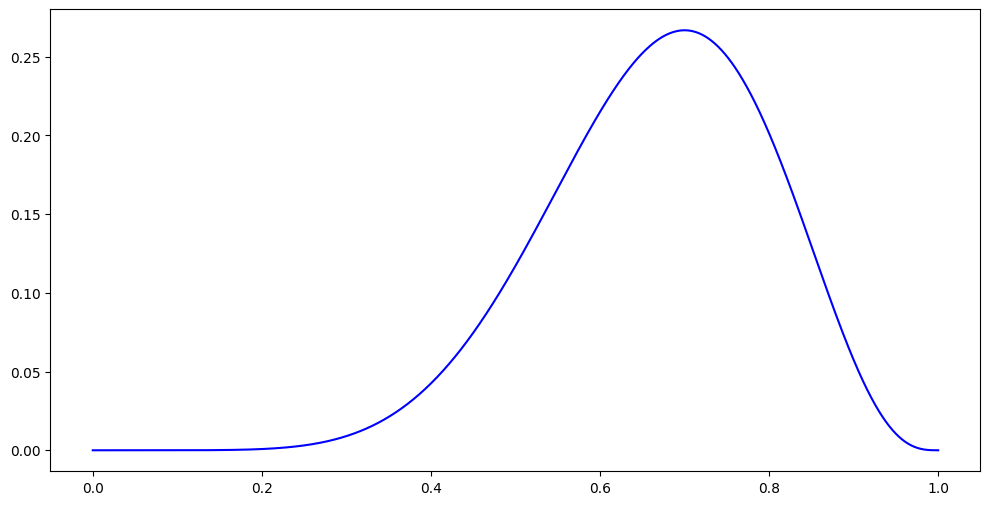

In [ ]:
#Likelihood

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import binom, beta

# Data
n = 10  # number of coin flips
k = 7   # number of heads

# Likelihood function
def likelihood(p, k, n):
    return binom.pmf(k, n, p)

# Prior distribution (Beta distribution)
alpha = 2  # prior parameter
beta = 2   # prior parameter

# Posterior distribution (Beta distribution)
posterior_alpha = alpha + k
posterior_beta = beta + n - k

# Plotting
p_values = np.linspace(0, 1, 1000)

plt.figure(figsize=(12, 6))

# Plot the likelihood function
likelihood_values = [likelihood(p, k, n) for p in p_values]
plt.plot(p_values, likelihood_values, label='Likelihood', color='blue')

# Plot the prior distribution
prior_values = beta.pdf(p_values, alpha, beta)
plt.plot(p_values, prior_values, label='Prior', color='green')

# Plot the posterior distribution
posterior_values = beta.pdf(p_values, posterior_alpha, posterior_beta)
plt.plot(p_values, posterior_values, label='Posterior', color='red')

plt.title('Likelihood, Prior, and Posterior Distributions')
plt.xlabel('Probability of Heads (p)')
plt.ylabel('Density')
plt.legend()
plt.grid(True)
plt.show()

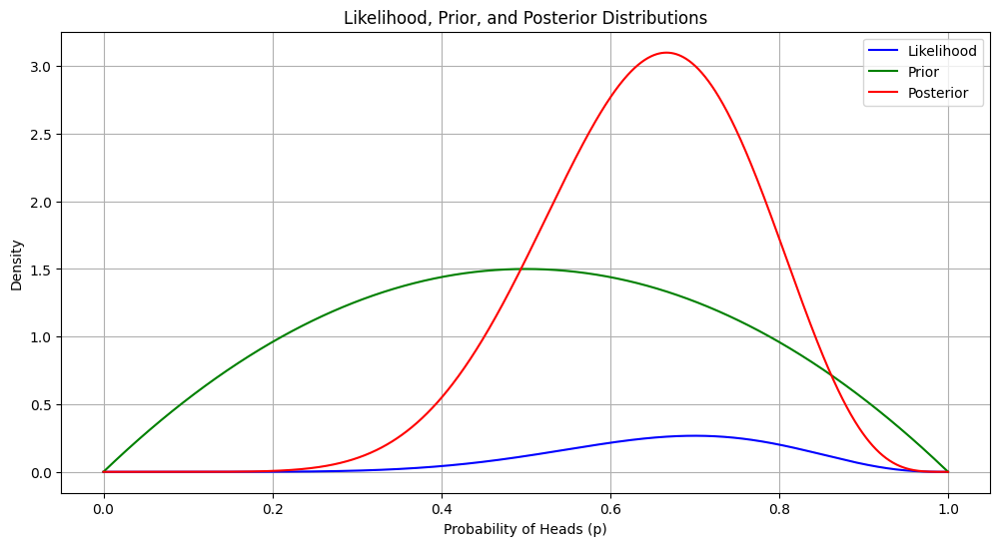

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import binom, beta

# Data
n = 10  # number of coin flips
k = 7   # number of heads

# Likelihood function
def likelihood(p, k, n):
    return binom.pmf(k, n, p)

# Prior distribution (Beta distribution)
alpha_prior = 2  # prior parameter
beta_prior = 2   # prior parameter

# Posterior distribution (Beta distribution)
alpha_posterior = alpha_prior + k
beta_posterior = beta_prior + n - k

# Plotting
p_values = np.linspace(0, 1, 1000)

plt.figure(figsize=(12, 6))

# Plot the likelihood function
likelihood_values = [likelihood(p, k, n) for p in p_values]
plt.plot(p_values, likelihood_values, label='Likelihood', color='blue')

# Plot the prior distribution
prior_values = beta.pdf(p_values, alpha_prior, beta_prior)
plt.plot(p_values, prior_values, label='Prior', color='green')

# Plot the posterior distribution
posterior_values = beta.pdf(p_values, alpha_posterior, beta_posterior)
plt.plot(p_values, posterior_values, label='Posterior', color='red')

plt.title('Likelihood, Prior, and Posterior Distributions')
plt.xlabel('Probability of Heads (p)')
plt.ylabel('Density')
plt.legend()
plt.grid(True)
plt.show()

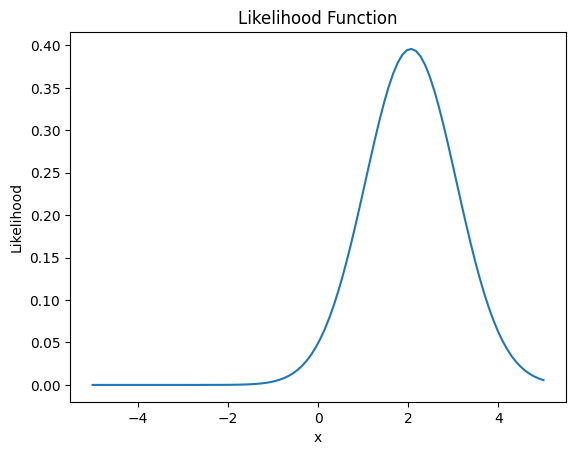

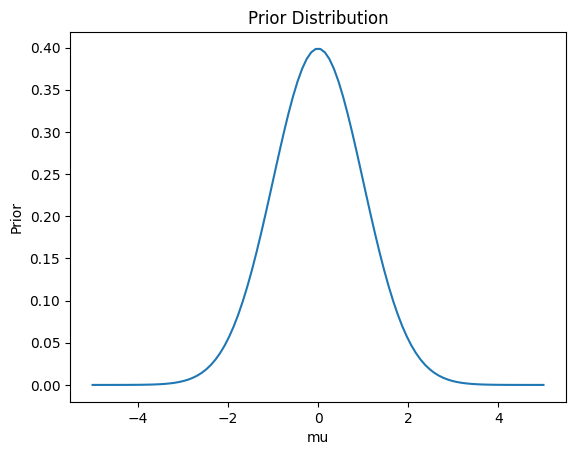

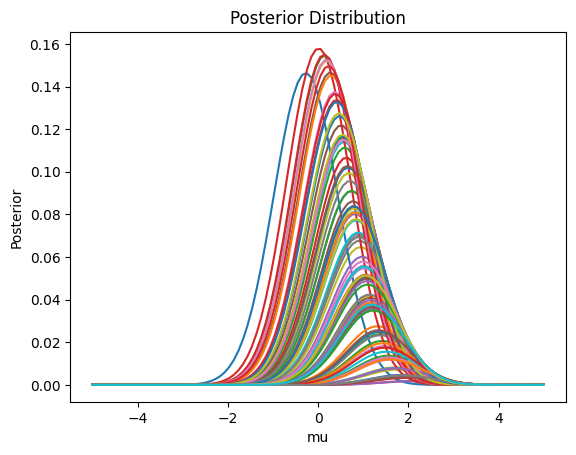

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Define the likelihood function
def likelihood(x, mu, sigma):
    return norm.pdf(x, loc=mu, scale=sigma)

# Define the prior distribution
def prior(mu, mu_prior, sigma_prior):
    return norm.pdf(mu, loc=mu_prior, scale=sigma_prior)

# Define the posterior distribution
def posterior(x, mu, sigma, mu_prior, sigma_prior):
    return likelihood(x, mu, sigma) * prior(mu, mu_prior, sigma_prior)

# Generate some data
np.random.seed(0)
x = np.random.normal(loc=2, scale=1, size=100)

# Estimate the model parameters using maximum likelihood
mu_ml = np.mean(x)
sigma_ml = np.std(x)

# Plot the likelihood function
x_values = np.linspace(-5, 5, 100)
likelihood_values = [likelihood(x_value, mu_ml, sigma_ml) for x_value in x_values]
plt.plot(x_values, likelihood_values)
plt.xlabel('x')
plt.ylabel('Likelihood')
plt.title('Likelihood Function')
plt.show()

# Plot the prior distribution
mu_prior = 0
sigma_prior = 1
mu_values = np.linspace(-5, 5, 100)
prior_values = [prior(mu_value, mu_prior, sigma_prior) for mu_value in mu_values]
plt.plot(mu_values, prior_values)
plt.xlabel('mu')
plt.ylabel('Prior')
plt.title('Prior Distribution')
plt.show()

# Plot the posterior distribution
posterior_values = [posterior(x, mu_value, sigma_ml, mu_prior, sigma_prior) for mu_value in mu_values]
plt.plot(mu_values, posterior_values)
plt.xlabel('mu')
plt.ylabel('Posterior')
plt.title('Posterior Distribution')
plt.show()

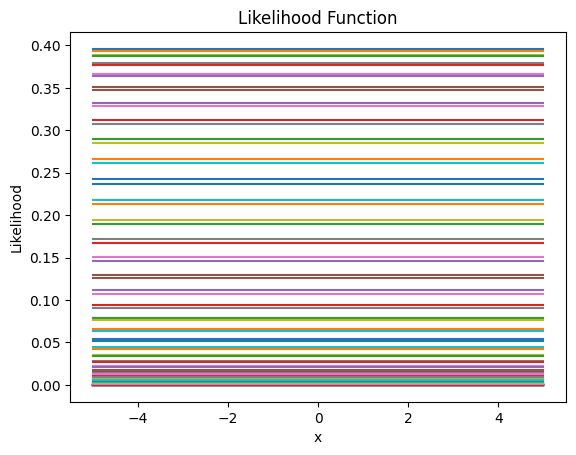

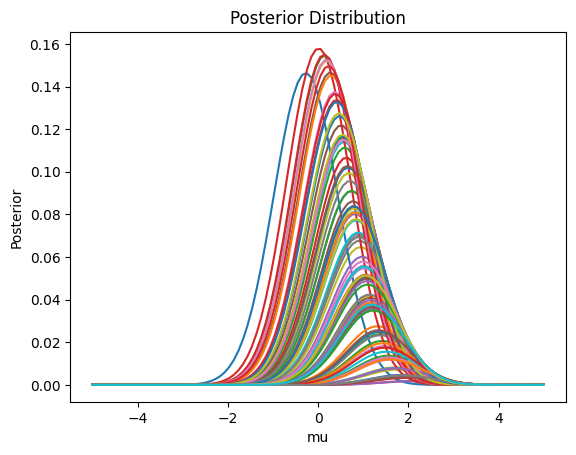

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Define the likelihood function
def likelihood(x, mu, sigma):
    return norm.pdf(x, loc=mu, scale=sigma)

# Define the prior distribution
def prior(mu):
    return norm.pdf(mu, loc=0, scale=1)

# Define the posterior distribution
def posterior(x, mu, sigma):
    return likelihood(x, mu, sigma) * prior(mu)

# Generate some data
np.random.seed(0)
x = np.random.normal(loc=2, scale=1, size=100)

# Estimate the model parameters using maximum likelihood
mu_ml = np.mean(x)
sigma_ml = np.std(x)

# Plot the likelihood function
x_values = np.linspace(-5, 5, 100)
likelihood_values = [likelihood(x_values, mu_ml, sigma_ml) for x_value in x_values]
plt.plot(x_values, likelihood_values)
plt.xlabel('x')
plt.ylabel('Likelihood')
plt.title('Likelihood Function')
plt.show()

# Plot the posterior distribution
mu_values = np.linspace(-5, 5, 100)
posterior_values = [posterior(x, mu_value, sigma_ml) for mu_value in mu_values]
plt.plot(mu_values, posterior_values)
plt.xlabel('mu')
plt.ylabel('Posterior')
plt.title('Posterior Distribution')
plt.show()

In [ ]:
pip install casadi

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.4/73.4 MB 6.3 MB/s eta 0:00:00


In [ ]:
#2-12-2024

from casadi import *


# Create scalar/matrix symbols
x = MX.sym('x',5)

# Compose into expressions
y = norm_2(x)

print(y)
# Sensitivity of expression -> new expression
grad_y = gradient(y,x);
print(grad_y)

# Create a Function to evaluate expression
f = Function('f',[x],[grad_y])
print(f)
#f1 = Function('f',[grad_y])
#print(f1)

# Evaluate numerically
grad_y_num = f([1,2,3,4,5]); #[0.13484, 0.26968, 0.40452, 0.53936, 0.6742]
#grad_y_num = f([1,1,1,1,1]); #0.447214, 0.447214, 0.447214, 0.447214, 0.447214]
grad_y_num = f([0,0,0,0,0]); #[-nan, -nan, -nan, -nan, -nan]
grad_y_num = f([0,1,1,1,1]); #[0, 0.5, 0.5, 0.5, 0.5]


print(grad_y_num)

||x||_F
(x/||x||_F)
f:(i0[5])->(o0[5]) MXFunction


NotImplementedError: Wrong number or type of arguments for overloaded function 'new_Function'.
  Possible prototypes are:
    Function()
    Function(str)
    Function(Function)
    Function(str,[SX],[SX],dict)
    Function(str,[MX],[MX],dict)
    Function(str,dict:SX,[str],[str],dict)
    Function(str,dict:MX,[str],[str],dict)
    Function(str,[SX],[SX],[str],[str],dict)
    Function(str,[MX],[MX],[str],[str],dict)
  You have: '(str,[MX])'


In [ ]:
for i in grad_y_num: print(i)
"""
---------------------------------------------------------------------------
Exception                                 Traceback (most recent call last)
<ipython-input-6-b2a875d52ad4> in <cell line: 1>()
----> 1 for i in grad_y_num: print(i)

/usr/local/lib/python3.10/dist-packages/casadi/casadi.py in __iter__(self)
  10900
  10901     def __iter__(self):
> 10902       raise Exception("""CasADi matrices are not iterable by design.
  10903                       Did you mean to iterate over m.nz, with m IM/DM/SX?
  10904                       Did you mean to iterate over horzsplit(m,1)/vertsplit(m,1) with m IM/DM/SX/MX?

Exception: CasADi matrices are not iterable by design.
                      Did you mean to iterate over m.nz, with m IM/DM/SX?
                      Did you mean to iterate over horzsplit(m,1)/vertsplit(m,1) with m IM/DM/SX/MX?

Exception: CasADi matrices are not iterable by design.
                      Did you mean to iterate over m.nz, with m IM/DM/SX?
                      Did you mean to iterate over horzsplit(m,1)/vertsplit(m,1) with m IM/DM/SX/MX?
                      

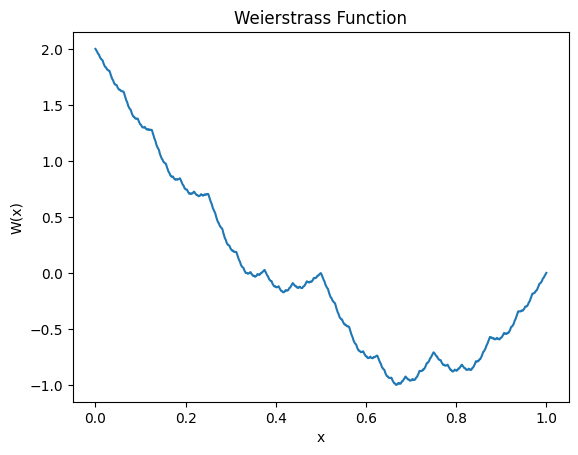

In [ ]:
#18-11-2024
import numpy as np
import matplotlib.pyplot as plt

def weierstrass(x, a=0.5, b=2):
    """Weierstrass function"""
    return sum(a**k * np.cos(b**k * np.pi * x) for k in range(20))

x = np.linspace(0, 1, 1000)
y = weierstrass(x)

plt.plot(x, y)
plt.title("Weierstrass Function")
plt.xlabel("x")
plt.ylabel("W(x)")
plt.show()

In [ ]:
import random

def random_search(objective_function, bounds, iterations):
  """
  Performs random search to find the minimum of a function.

  Args:
    objective_function: The function to be minimized.
    bounds: A list of tuples defining the lower and upper bounds for each dimension.
    iterations: The number of iterations to run.

  Returns:
    The best solution found and its corresponding objective function value.
  """

  best_solution = None
  best_value = float('inf')

  for _ in range(iterations):
    solution = [random.uniform(lb, ub) for lb, ub in bounds]
    value = objective_function(solution)
    print(str(value)+"["+str(best_value)+"]")
    if value < best_value:
      best_solution = solution
      best_value = value

  return best_solution, best_value

# Example usage:
def objective_function(x):
  return x[0]**2 + x[1]**2

bounds = [(-10, 10), (-10, 10)]
iterations = 100

best_solution, best_value = random_search(objective_function, bounds, iterations)
print("Best solution:", best_solution)
print("Best value:", best_value)

62.46896581128889[inf]
46.96184093648354[62.46896581128889]
111.7104995111257[46.96184093648354]
63.20495029643204[46.96184093648354]
26.330210944093068[46.96184093648354]
22.066718588602498[26.330210944093068]
91.0552912513591[22.066718588602498]
29.991466021736166[22.066718588602498]
112.37244063343712[22.066718588602498]
148.20160656218297[22.066718588602498]
94.91709208322506[22.066718588602498]
160.46004374944508[22.066718588602498]
72.81208177129555[22.066718588602498]
74.26995907681334[22.066718588602498]
18.274489274287077[22.066718588602498]
14.80564606873564[18.274489274287077]
38.15846624259076[14.80564606873564]
108.20943820075816[14.80564606873564]
83.2302933413351[14.80564606873564]
96.90433476553841[14.80564606873564]
135.47598883302908[14.80564606873564]
94.54889255432975[14.80564606873564]
77.11409262861153[14.80564606873564]
83.68907112751243[14.80564606873564]
46.63917115636029[14.80564606873564]
13.263032420375836[14.80564606873564]
146.750387654027[13.2630324203758

In [ ]:
import numpy as np

def pattern_search(objective_function, x0, delta_x, max_iter):
  """
  Performs pattern search optimization.

  Args:
    objective_function: The function to be minimized.
    x0: The initial guess.
    delta_x: The initial step size.
    max_iter: The maximum number of iterations.

  Returns:
    The best solution found.
  """

  x = x0.copy()
  best_value = objective_function(x)

  for _ in range(max_iter):
    improved = False
    for i in range(len(x)):
      # Pattern search in positive direction
      x_plus = x.copy()
      x_plus[i] += delta_x
      value_plus = objective_function(x_plus)

      # Pattern search in negative direction
      x_minus = x.copy()
      x_minus[i] -= delta_x
      value_minus = objective_function(x_minus)

      if value_plus < best_value:
        x = x_plus
        best_value = value_plus
        improved = True
      elif value_minus < best_value:
        x = x_minus
        best_value = value_minus
        improved = True

    # Reduce step size if no improvement
    if not improved:
      delta_x *= 0.5

  return x, best_value

# Example usage:
def objective_function_0(x):
  return x[0]**2 + x[1]**2

def objective_function(x):
  return x[0] - x[1]**2 + x[2]**3 + x[1]/x[2]*x[3] # 124


x0 = np.array([2, 2, 2, 1])
delta_x = 0.5
max_iter = 100

best_solution, best_value = pattern_search(objective_function, x0, delta_x, max_iter)
print("Best solution:", best_solution)
print("Best value:", best_value)

Best solution: [0 2 1 0]
Best value: -3.0


<ipython-input-9-333d20914ce8>:53: RuntimeWarning: divide by zero encountered in scalar divide
  return x[0] - x[1]**2 + x[2]**3 + x[1]/x[2]*x[3] # 124
<ipython-input-9-333d20914ce8>:53: RuntimeWarning: invalid value encountered in scalar multiply
  return x[0] - x[1]**2 + x[2]**3 + x[1]/x[2]*x[3] # 124


In [ ]:
import random

def simulated_annealing(objective_function, initial_solution, temperature_schedule, max_iter):
  """
  Performs simulated annealing optimization.

  Args:
    objective_function: The function to be minimized.
    initial_solution: The initial solution.
    temperature_schedule: A function to determine the temperature at each iteration.
    max_iter: The maximum number of iterations.

  Returns:
    The best solution found.
  """

  current_solution = initial_solution
  best_solution = current_solution.copy()
  best_value = objective_function(current_solution)

  for t in range(max_iter):
    # Generate a neighbor solution
    neighbor_solution = current_solution + np.random.randn(*current_solution.shape)

    # Calculate the difference in objective function values
    delta_e = objective_function(neighbor_solution) - objective_function(current_solution)

    # Accept the neighbor solution with a probability based on the temperature
    if delta_e < 0 or np.random.rand() < np.exp(-delta_e / temperature_schedule(t)):
      current_solution = neighbor_solution
      if objective_function(current_solution) < best_value:
        best_solution = current_solution
        best_value = objective_function(current_solution)
        print(best_value, best_solution)


  return best_solution, best_value

# Example usage:
def objective_function_0(x):
  return x[0]**2 + x[1]**2
def objective_function(x): # highly_nonlinear_function
    x1, x2, x3, x4, x5, x6 = x
    return (x1**2 * np.sin(x2) + x3**3 * np.cos(x4)) / (1 + x5**2 + x6**4)

def ackley_function(x):
  d = len(x)
  sum1 = np.sum(x**2)
  sum2 = np.sum(np.cos(2 * np.pi * x))
  return -20 * np.exp(-0.2 * np.sqrt(sum1 / d)) - np.exp(sum2 / d) + 20 + np.e


#initial_solution = np.array([2, 2])
initial_solution = np.array([0,0,0,0,0,0])
#initial_solution = np.array([111])
#objective_function = ackley_function
#ackley_function
temperature_schedule = lambda t: 10 * np.exp(-t/100)
max_iter = 1000

best_solution, best_value = simulated_annealing(objective_function, initial_solution, temperature_schedule, max_iter)
print("Best solution:", best_solution)
print("Best value:", best_value)

-1.3724082871322363 [-0.92272731 -0.70826991 -1.84150973 -0.22037077  1.94571186  0.49079906]
-3.559346813291785 [-12.04275047  12.06048164  16.00679365  20.68136735   8.24457142
   3.96885811]
-27.070216823649776 [-12.56450452  13.30983978  14.74796204  22.07809877   8.34325668
   2.56803424]
-27.62646480542494 [-12.37843772  15.38473359  12.80900942  22.29138151   7.92327125
   1.63399723]
-56.76907521314591 [-11.95721893  15.34073539  14.35350283  22.33086587   6.4606149
   1.52931986]
-84.63906307491813 [-11.4991498   15.06523746  16.1450715   22.87316341   4.63763443
   1.69009443]
-123.48932645368289 [-11.84047754  15.2225154   15.529232    22.10656078   4.59698321
   1.6528106 ]
-262.3227446435376 [-10.33673283  17.00844336  15.80322069  22.31735094   3.69380361
   0.1247859 ]
-324.2667912535765 [-12.29564681  15.98124106  15.35641505  22.26611505   3.14106717
   0.29705841]
-479.9859029932713 [-13.70539417  15.84835983  17.39015901  22.06628682   2.63404257
   1.32070272]
-605.

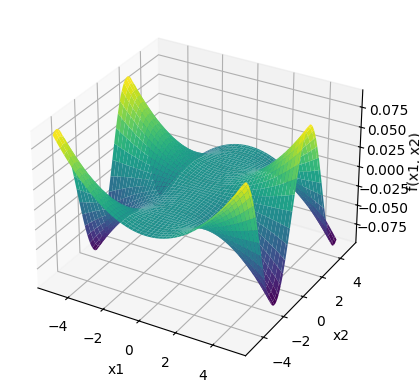

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Fix x3, x4, x5, and x6 to specific values
x3, x4, x5, x6 = 1, 2, 3, 4

def simplified_function(x1, x2):
    return (x1**2 * np.sin(x2) + x3**3 * np.cos(x4)) / (1 + x5**2 + x6**4)


# Create a meshgrid
x1 = np.linspace(-5, 5, 100)
x2 = np.linspace(-5, 5, 100)
X, Y = np.meshgrid(x1, x2)


# Plot the 3D surface
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z, cmap='viridis', edgecolor='none')
ax.set_xlabel('x1')
ax.set_ylabel('x2')
ax.set_zlabel('f(x1, x2)')
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def ackley_function(x):
    d = len(x)
    #sum1 = np.sum(x**2)
    sum1 = np.sum(np.square(x))  # Use np.square for element-wise squaring
    sum2 = np.sum(np.cos(2 * np.pi * x))
    return -20 * np.exp(-0.2 * np.sqrt(sum1 / d)) - np.exp(sum2 / d) + 20 + np.e

# Fix some variables
x3, x4, x5, x6 = 1, 2, 3, 4

def simplified_ackley(x1, x2):
    return ackley_function([x1, x2, x3, x4, x5, x6])

# Create a meshgrid
x1 = np.linspace(-5, 5, 100)
x2 = np.linspace(-5, 5, 100)
X, Y = np.meshgrid(x1, x2)
Z = simplified_ackley(X, Y)

# Plot the 3D surface
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(X, Y, Z, cmap='viridis', edgecolor='none')

# Add a color bar which maps values to colors
fig.colorbar(surf, shrink=0.5, aspect=5)

plt.xlabel('x1')
plt.ylabel('x2')
plt.title('Ackley Function (2D Slice)')
plt.show()

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (6,) + inhomogeneous part.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
def ackley_function(x):
    d = len(x)
    sum1 = np.sum(np.square(x))
    sum2 = np.sum(np.cos(2 * np.pi * x))
    return -20 * np.exp(-0.2 * np.sqrt(sum1 / d)) - np.exp(sum2 / d) + 20 + np.e

# Fix some variables
x3, x4, x5, x6 = 1, 2, 3, 4

def simplified_ackley(x1, x2):
    return ackley_function([x1, x2, x3, x4, x5, x6])

# Create a meshgrid
x1 = np.linspace(-5, 5, 100)
x2 = np.linspace(-5, 5, 100)
X, Y = np.meshgrid(x1, x2)

# Apply the simplified_ackley function to each pair of (x, y) values
Z = np.zeros_like(X)
for i in range(X.shape[0]):
    for j in range(X.shape[1]):
        Z[i, j] = simplified_ackley(X[i, j], Y[i, j])

# Plot the 3D surface
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(X, Y, Z, cmap='viridis', edgecolor='none')

# Add a color bar which maps values to colors
fig.colorbar(surf, shrink=0.5, aspect=5)

plt.xlabel('x1')
plt.ylabel('x2')
plt.title('Ackley Function (2D Slice)')
plt.show()

TypeError: can't multiply sequence by non-int of type 'float'

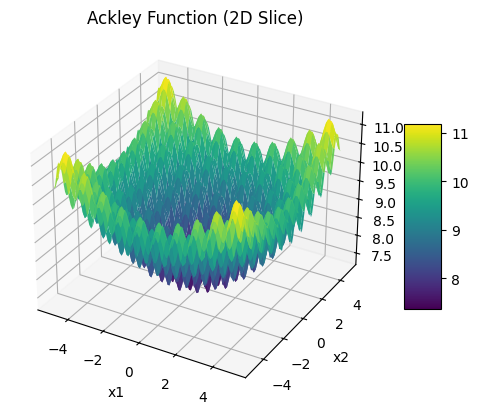

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def ackley_function(x):
    d = len(x)
    sum1 = np.sum(np.square(x))
    sum2 = np.sum(np.cos(2 * np.pi * x))
    return -20 * np.exp(-0.2 * np.sqrt(sum1 / d)) - np.exp(sum2 / d) + 20 + np.e

# Fix some variables
x3, x4, x5, x6 = 1, 2, 3, 4

def simplified_ackley(x1, x2):
    return ackley_function(np.array([x1, x2, x3, x4, x5, x6]))

# Create a meshgrid
x1 = np.linspace(-5, 5, 100)
x2 = np.linspace(-5, 5, 100)
X, Y = np.meshgrid(x1, x2)

# Apply the simplified_ackley function vectorized
# Z = np.zeros_like(X)
# for i in range(X.shape[0]):
#     for j in range(X.shape[1]):
#         Z[i, j] = simplified_ackley(X[i, j], Y[i, j])
#Apply the function in a vectorized way
Z = np.array([[simplified_ackley(x, y) for y in x2] for x in x1])

# Plot the 3D surface
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(X, Y, Z, cmap='viridis', edgecolor='none')

# Add a color bar which maps values to colors
fig.colorbar(surf, shrink=0.5, aspect=5)

plt.xlabel('x1')
plt.ylabel('x2')
plt.title('Ackley Function (2D Slice)')
plt.show()

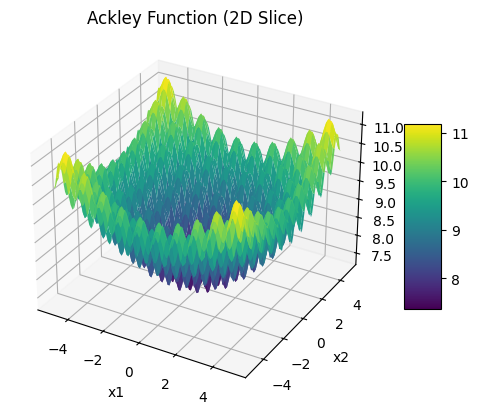

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def ackley_function(x):
    x = np.array(x)  # Ensure x is a numpy array
    d = len(x)
    sum1 = np.sum(np.square(x))
    sum2 = np.sum(np.cos(2 * np.pi * x))
    return -20 * np.exp(-0.2 * np.sqrt(sum1 / d)) - np.exp(sum2 / d) + 20 + np.e

# Fix some variables
x3, x4, x5, x6 = 1, 2, 3, 4

def simplified_ackley(x1, x2):
    return ackley_function([x1, x2, x3, x4, x5, x6])

# Create a meshgrid
x1 = np.linspace(-5, 5, 100)
x2 = np.linspace(-5, 5, 100)
X, Y = np.meshgrid(x1, x2)

# Apply the simplified_ackley function to each pair of (x, y) values
Z = np.zeros_like(X)
for i in range(X.shape[0]):
    for j in range(X.shape[1]):
        Z[i, j] = simplified_ackley(X[i, j], Y[i, j])

# Plot the 3D surface
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(X, Y, Z, cmap='viridis', edgecolor='none')

# Add a color bar which maps values to colors
fig.colorbar(surf, shrink=0.5, aspect=5)

plt.xlabel('x1')
plt.ylabel('x2')
plt.title('Ackley Function (2D Slice)')
plt.show()

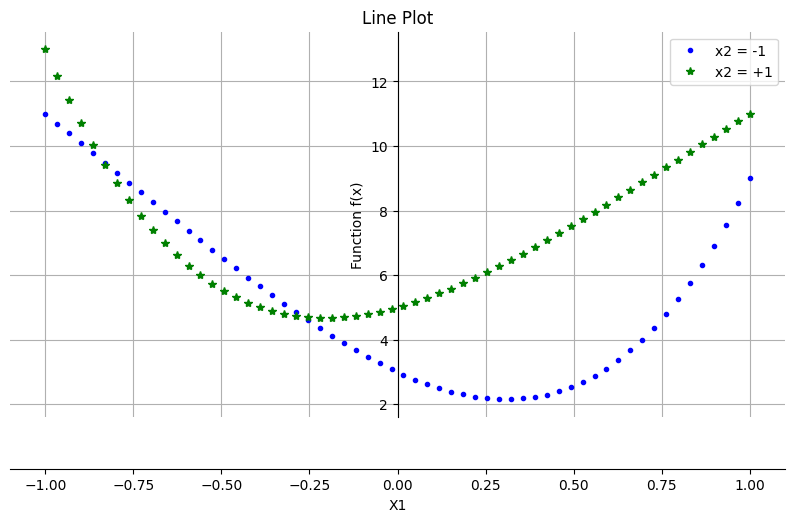

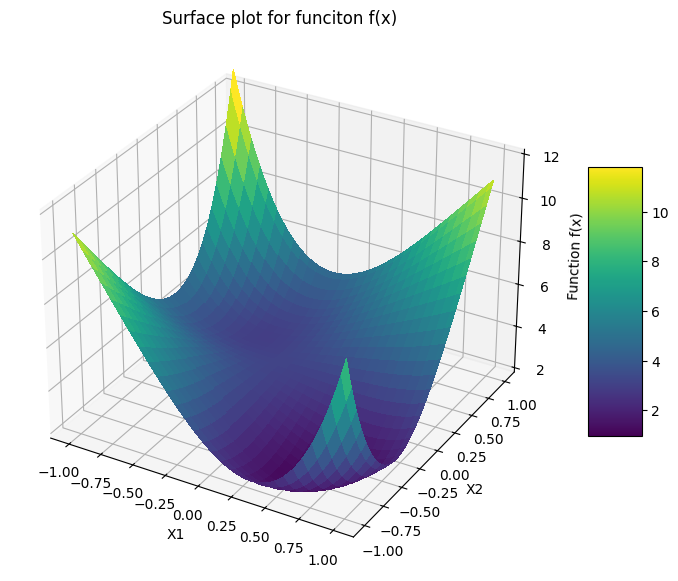

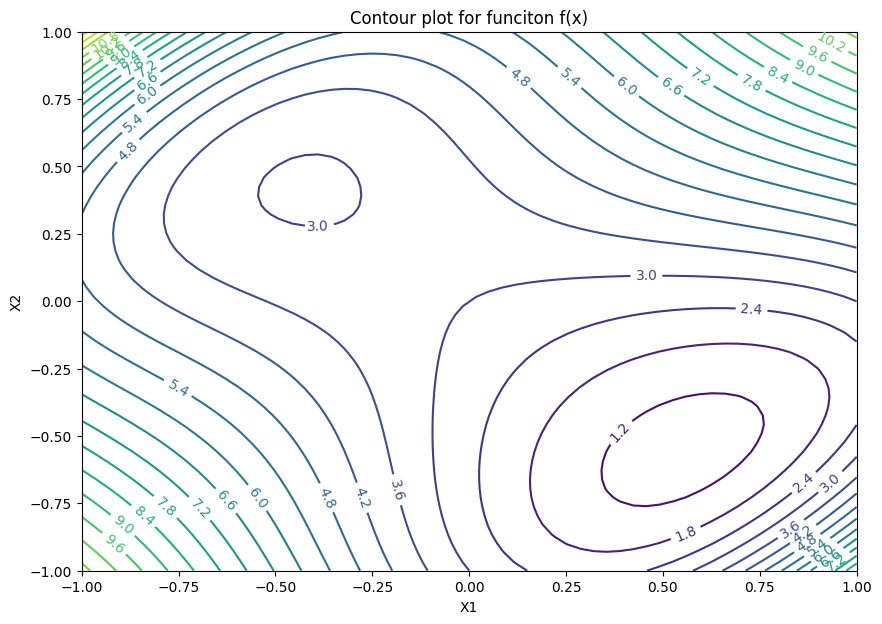

In [ ]:
# -*- coding: utf-8 -*-
"""603_assginment1_190020102.ipynb

Automatically generated by Colaboratory.

Original file is located at
    https://colab.research.google.com/drive/1KISS8QauwLXEMisLj39CSKreymf2DJv0
"""

# Commented out IPython magic to ensure Python compatibility.
import numpy as np
import matplotlib.pyplot as plt
# %matplotlib inline

import pandas as pd

"""### Line Plot

**Here Im writing a function that mimics f(x1,x2)**
"""

def func(x1,x2):
  f = []
  for i in range(len(x1)):
    f.append((x2[i]-x1[i])**4 + 8*x1[i]*x2[i] -x1[i]+x2[i]+3)
  return np.array(f)


# lets generate range of values for f(x) and draw its lineplots
###########################################################################
ran = np.linspace(-1,1,60)


fig = plt.figure(figsize = (10,5))
ax = fig.add_subplot(1, 1, 1)
ax.spines['left'].set_position('center')
ax.spines['bottom'].set_position('zero')
ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')

plt.plot(ran,func(ran,[-1]*len(ran)),'b.')
plt.plot(ran,func(ran,[1]*len(ran)),'g*')
plt.legend(['x2 = -1','x2 = +1'])

plt.grid()
plt.title('Line Plot')
plt.xlabel('X1')
plt.ylabel('Function f(x)')

#### The block of code below is to generate the ***surface plot*** for function f(x)
############################################################################

from mpl_toolkits import mplot3d


fig, ax = plt.subplots(subplot_kw={"projection": "3d"},figsize= (10,7))

x1 = np.array(np.linspace(-1,1,60))
x2 = np.array(np.linspace(-1,1,60))

x1,x2 = np.meshgrid(x1,x2)

surf = ax.plot_surface(np.array(x1),np.array(x2),np.array(func(x1,x2)), cmap='viridis',
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(2, 12)


#from matplotlib.ticker import LinearLocator
#ax.zaxis.set_major_locator(LinearLocator(10))
# A StrMethodFormatter is used automatically
#ax.zaxis.set_major_formatter('{x:.02f}')

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.xlabel('X1')
plt.ylabel('X2')
ax.set_zlabel('Function f(x)')
plt.title('Surface plot for funciton f(x)')
plt.show()
######################################################################



### This block is for plotting the contours for the function
####################################################################
fig, ax = plt.subplots(1,1,figsize= (10,7))

x1 = np.array(np.linspace(-1,1,60))
x2 = np.array(np.linspace(-1,1,60))

x1,x2 = np.meshgrid(x1,x2)

contour = ax.contour(np.array(x1),np.array(x2),np.array(func(x1,x2)),levels = 20)
ax.clabel(contour, inline=True, fontsize=10)

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.xlabel('X1')
plt.ylabel('X2')

plt.title('Contour plot for funciton f(x)')
plt.show()

In [ ]:

import numpy as np
import math

def func(x):
  x1,x2 = x[0],x[1]
  f_x = 2*math.exp(x1)*x2 + 3*x1*x2**2
  return f_x

### Defning Variables

h = 0.001
del_x1 = 0.001
del_x2 = 0.001


### Very important pass x_input as an numpy array since ive not explicitly converted it into an numpy array inside the function
def compute_gradient(func,x_input,h = 0.001):

    grad_x1 = (func(x_input+h*np.array([1,0]).T)-func(x_input-h*np.array([1,0]).T) )/(2*h)
    grad_x2 = (func(x_input+h*np.array([0,1]).T)-func(x_input-h*np.array([0,1]).T) )/(2*h)
    grad = [grad_x1,grad_x2]
    return grad


def compute_hessian(func,x_input,del_x1 = 0.01,del_x2 = 0.001):
    grad = np.array([[0]*x_input.shape[0] for _ in range(x_input.shape[0])])

    grad[0,0] = (func(x_input+np.array([del_x1,0]).T)- 2*func(x_input) + func(x_input-np.array([del_x1,0]).T))/del_x1**2
    grad[1,1] = (func(x_input+np.array([0,del_x2]).T)- 2*func(x_input) + func(x_input-np.array([0,del_x2]).T))/del_x2**2

    A = func(x_input + np.array([del_x1,del_x2]).T)
    B = func(x_input - np.array([del_x1,del_x2]).T)
    C = func(x_input + np.array([-del_x1,del_x2]).T)
    D = func(x_input + np.array([del_x1,-del_x2]).T)

    grad[0,1] = (A+B-C-D)/(4*del_x1*del_x2)

    grad[1,0] = grad[0,1]

    return grad

## Testing out both the functions
print(compute_gradient(func,np.array([1,1]).T))
print(compute_hessian(func,np.array([1,1]).T))


[8.436564563011117, 11.436563656917365]
[[ 5 11]
 [11  6]]


Ключи digits_dataset: 
dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename', 'data_module'])
.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

:Number of Instances: 569

:Number of Attributes: 30 numeric, predictive attributes and the class

:Attribute Information:
    - radius (mean of dista
Названия ответов: 
['malignant' 'benign']
Названия признаков: 
['mean radius' 'mean texture' 'mean perimeter' 'mean area'
 'mean smoothness' 'mean compactness' 'mean concavity'
 'mean concave points' 'mean symmetry' 'mean fractal dimension'
 'radius error' 'texture error' 'perimeter error' 'area error'
 'smoothness error' 'compactness error' 'concavity error'
 'concave points error' 'symmetry error' 'fractal dimension error'
 'worst radius' 'worst texture' 'worst perimeter' 'worst area'
 'worst smoothness' 'worst compactness' 'worst concavity'
 'worst concave po

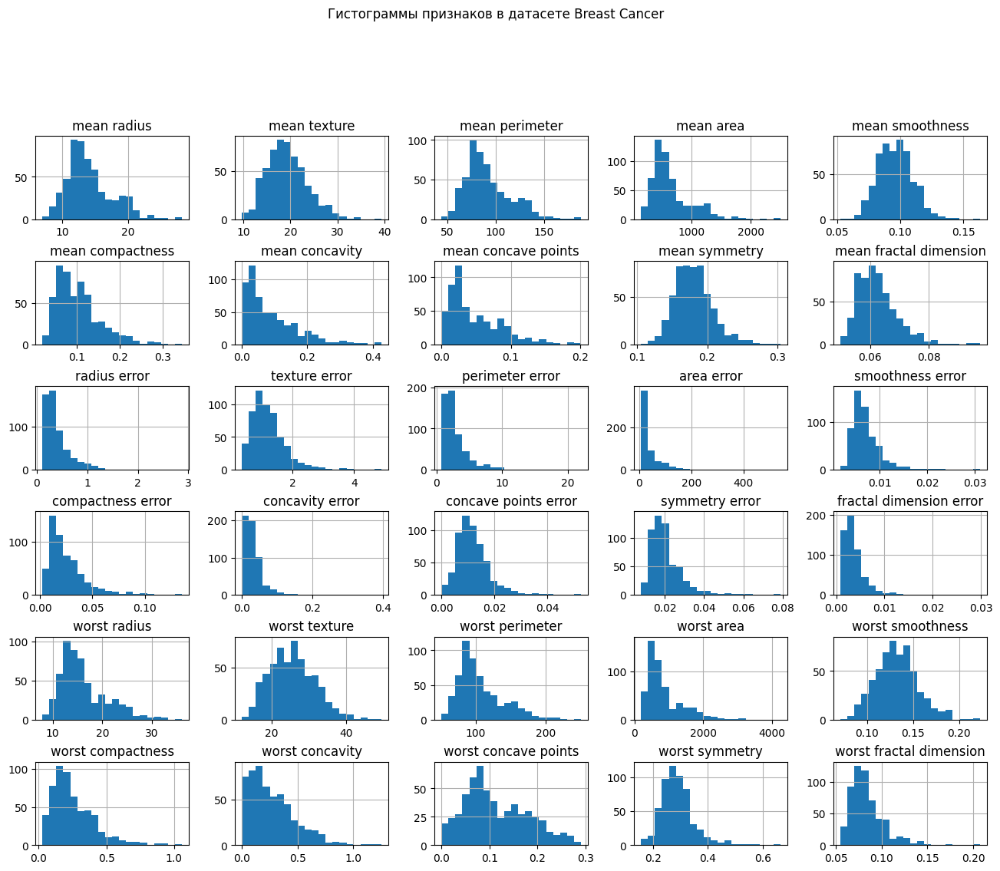

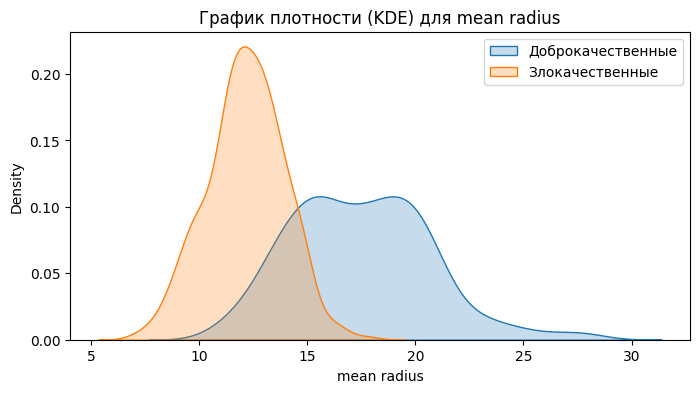

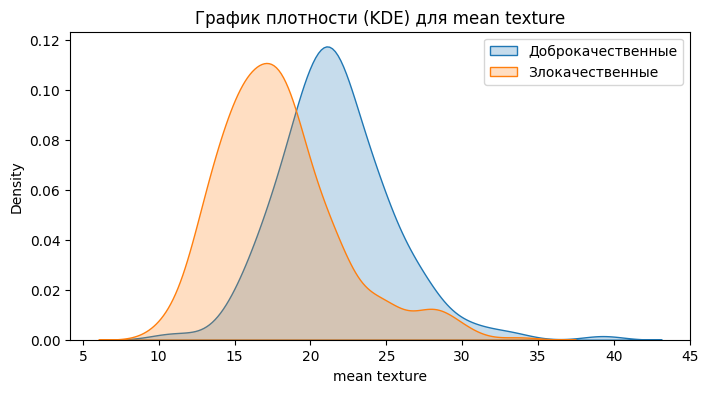

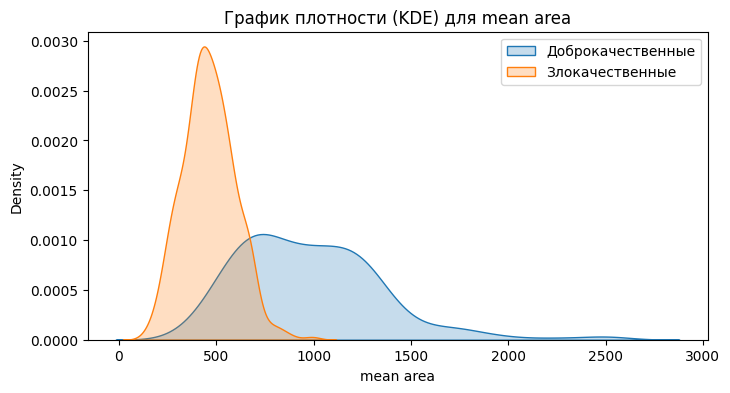

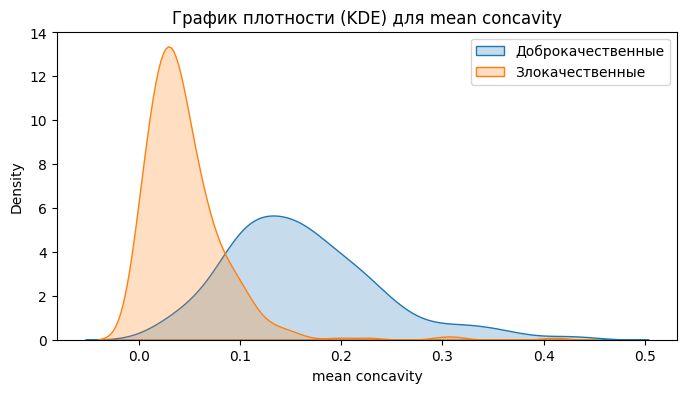

Лучшее значение k-ближайших средних: 10


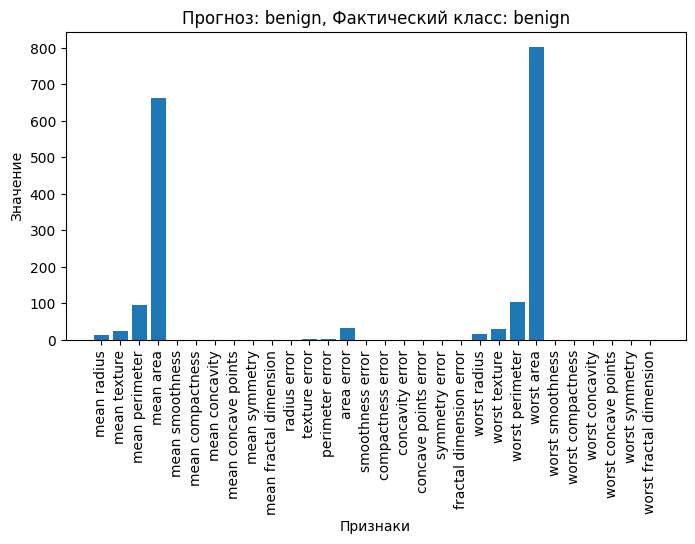

Точность: 0.94


In [ ]:
from sklearn.datasets import load_breast_cancer
cancer_dataset = load_breast_cancer()
print(f"Ключи digits_dataset: \n{cancer_dataset.keys()}")

print(cancer_dataset['DESCR'][:300])

print(f"Названия ответов: \n{cancer_dataset['target_names']}")

result = cancer_dataset['feature_names']
print(f"Названия признаков: \n{result}")
print(f"Строки из массива data: \n{cancer_dataset['data']}")
print(f"Форма миссива data: \n{cancer_dataset['data'].shape}")

print(f"Форма массива target: \n{cancer_dataset['target'].shape}")
print(f"Ответы: \n{cancer_dataset['target']}")
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(cancer_dataset['data'], cancer_dataset['target'], random_state=0)
print(f"Форма массива x_train: {x_train.shape}")
print(f"Форма массива y_train: {y_train.shape}")
print(f"Форма массива x_test: {x_test.shape}")
print(f"Форма массива y_test: {y_test.shape}")
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
cancer_df = pd.DataFrame(data=cancer_dataset.data, columns=cancer_dataset.feature_names)
# Создаем гистограммы для признаков
cancer_df.hist(bins=20, figsize=(16, 12))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("Гистограммы признаков в датасете Breast Cancer", x=0.5, y=1.02)
plt.show()
import seaborn as sns
cancer_df = pd.DataFrame(data=cancer_dataset.data, columns=cancer_dataset.feature_names)
cancer_df['target'] = cancer_dataset.target
# Графики плотности (KDE) для нескольких признаков по классам
selected_features = ['mean radius', 'mean texture', 'mean area', 'mean concavity']
for feature in selected_features:
    plt.figure(figsize=(8, 4))
    sns.kdeplot(cancer_df[feature][cancer_df['target'] == 0], label='Доброкачественные', fill=True)
    sns.kdeplot(cancer_df[feature][cancer_df['target'] == 1], label='Злокачественные', fill=True)
    plt.title(f"График плотности (KDE) для {feature}")
    plt.xlabel(feature)
    plt.legend()
    plt.show()
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]}
grid_search = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5)
grid_search.fit(x_train, y_train)
best_k = grid_search.best_params_['n_neighbors']

print(f"Лучшее значение k-ближайших средних: {best_k}")
knn = KNeighborsClassifier(n_neighbors=best_k)

knn.fit(x_train, y_train)
import random

random_index = random.randint(0, len(x_test) - 1)
sample = x_test[random_index].reshape(1, -1)
true_label = y_test[random_index]

predicted_label = knn.predict(sample)

plt.figure(figsize=(8, 4))
plt.bar(range(len(sample[0])), sample[0], tick_label=cancer_dataset.feature_names)
plt.xlabel("Признаки")
plt.ylabel("Значение")
plt.title(f"Прогноз: {cancer_dataset.target_names[predicted_label[0]]}, Фактический класс: {cancer_dataset.target_names[true_label]}")
plt.xticks(rotation=90)
plt.show()
from sklearn.metrics import accuracy_score

y_pred = knn.predict(x_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Точность: {accuracy:.2f}")


Матрица ошибок:
[[49  4]
 [ 4 86]]
Отчет о классификации:
              precision    recall  f1-score   support

           0       0.92      0.92      0.92        53
           1       0.96      0.96      0.96        90

    accuracy                           0.94       143
   macro avg       0.94      0.94      0.94       143
weighted avg       0.94      0.94      0.94       143



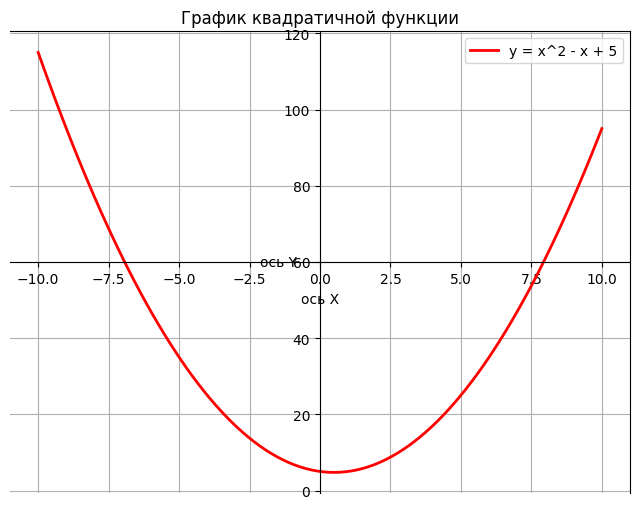

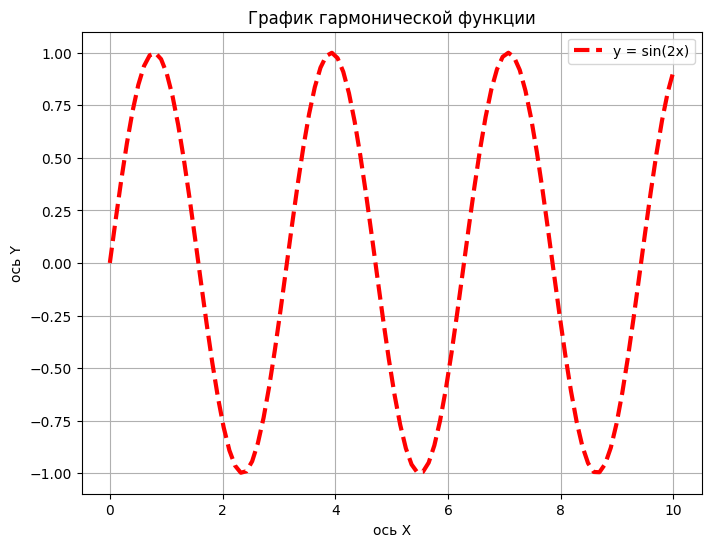

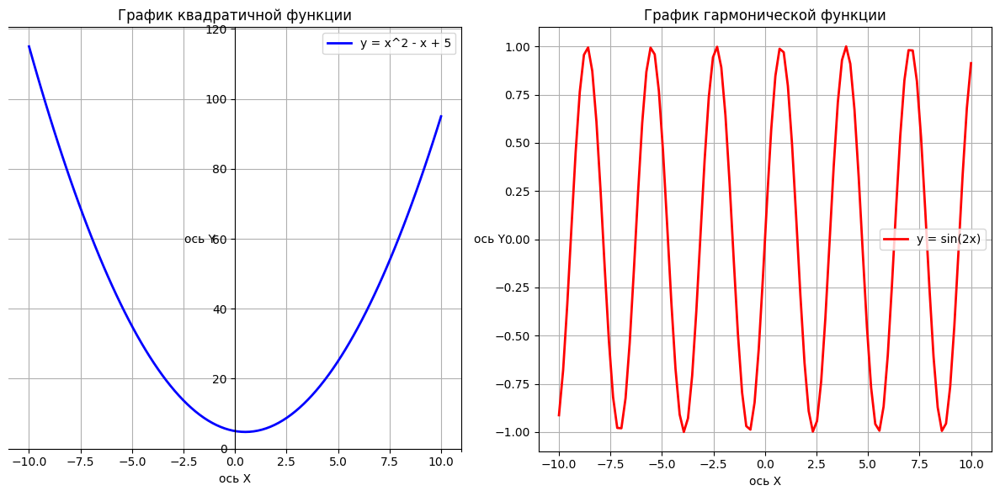

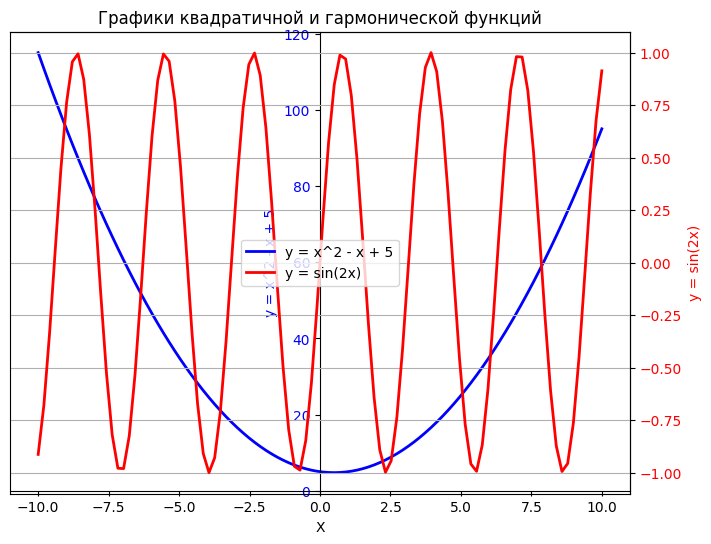

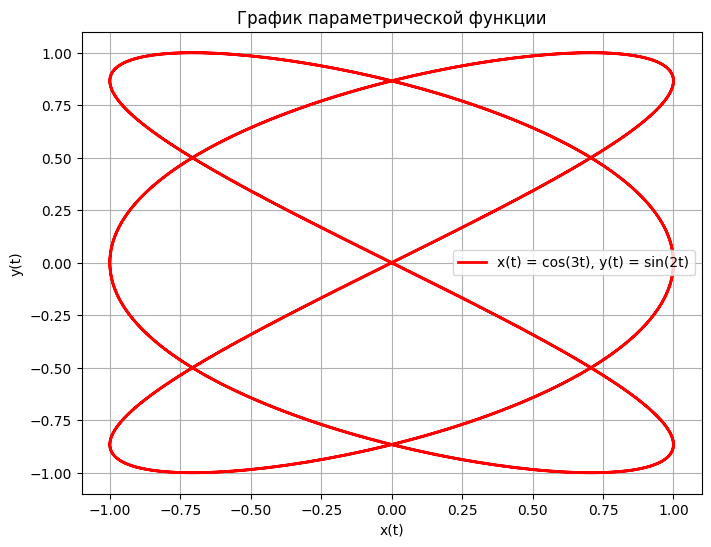

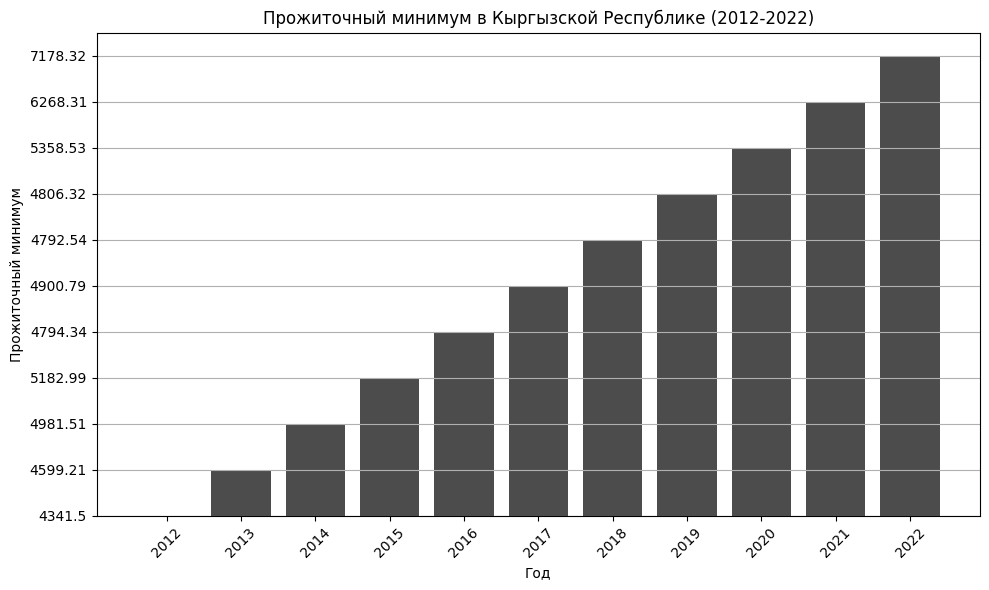

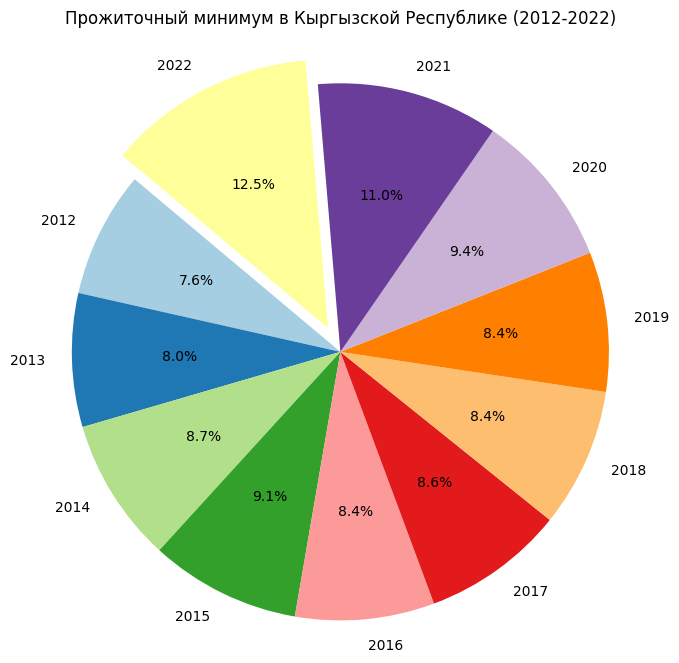

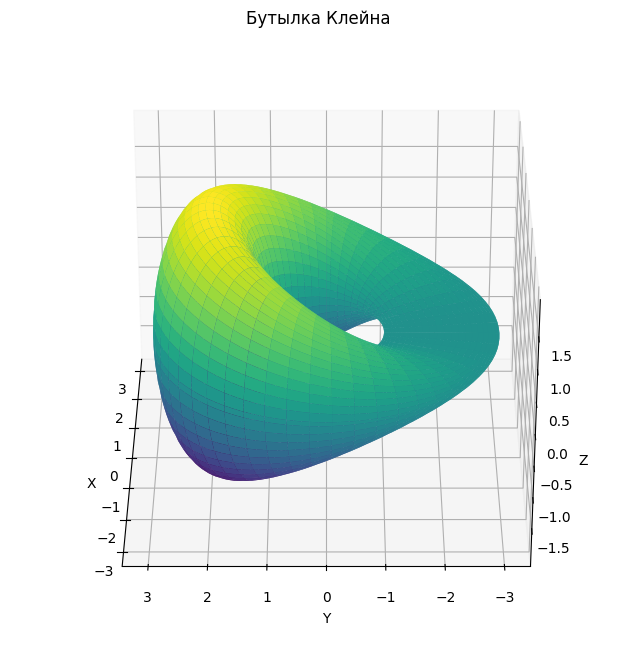

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

confusion = confusion_matrix(y_test, y_pred)
print('Матрица ошибок:')
print(confusion)

# Отчет о классификации
class_report = classification_report(y_test, y_pred)
print('Отчет о классификации:')
print(class_report)
from matplotlib.pylab import *

a = array([1, 2, 3, 4])
a
import matplotlib.pyplot as plt
import numpy as np

x = np.linspace(-10, 10, 100)
y = x ** 2 - x + 5

fig, ax = plt.subplots(figsize=(8, 6))
plt.plot(x, y, label='y = x^2 - x + 5', color='red', linewidth=2)

plt.xlabel('ось X', ha='center')
plt.ylabel('ось Y', va='center', rotation=0, ha='center')
plt.title('График квадратичной функции')

plt.legend()

ax.spines['left'].set_position('center')
ax.spines['bottom'].set_position('center')

plt.grid(True)
plt.show()
x = np.linspace(0, 10, 100)

y = np.sin(2 * x)

plt.figure(figsize=(8, 6))
plt.plot(x, y, label='y = sin(2x)', color='red', linestyle='dashed',
         linewidth=3)

plt.xlabel('ось X')
plt.ylabel('ось Y')
plt.title('График гармонической функции')

plt.legend()

plt.grid(True)
plt.show()
import numpy as np
import matplotlib.pyplot as plt

x = np.linspace(-10, 10, 100)

y1 = x ** 2 - x + 5
y2 = np.sin(2 * x)

plt.figure(figsize=(12, 6))

ax = plt.subplot(1, 2, 1)
plt.plot(x, y1, label='y = x^2 - x + 5', color='blue', linewidth=2)
plt.xlabel('ось X', ha='center')
plt.ylabel('ось Y', va='center', rotation=0, ha='center')
plt.title('График квадратичной функции')
plt.legend()
plt.grid(True)

ax.spines['left'].set_position('center')
ax.spines['bottom'].set_position('zero')

plt.subplot(1, 2, 2)
plt.plot(x, y2, label='y = sin(2x)', color='r', linewidth=2)
plt.xlabel('ось X', ha='center')
plt.ylabel('ось Y', va='center', rotation=0, ha='center')
plt.title('График гармонической функции')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

import numpy as np
import matplotlib.pyplot as plt

x = np.linspace(-10, 10, 100)

y1 = x ** 2 - x + 5
y2 = np.sin(2 * x)

fig, ax1 = plt.subplots(figsize=(8, 6))

color = 'blue'
ax1.set_xlabel('X')
ax1.set_ylabel('y = x^2 - x + 5', color=color)
ax1.plot(x, y1, label='y = x^2 - x + 5', color=color, linewidth=2)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()

ax1.spines['left'].set_position('center')
ax1.spines['bottom'].set_position('zero')

color = 'r'
ax2.set_ylabel('y = sin(2x)', color=color)
ax2.plot(x, y2, label='y = sin(2x)', color=color, linewidth=2)
ax2.tick_params(axis='y', labelcolor=color)

plt.title('Графики квадратичной и гармонической функций')
plt.grid(True)

lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='best')

plt.show()

t = np.linspace(0, 4 * np.pi, 1000)

x = np.cos(3 * t)
y = np.sin(2 * t)

plt.figure(figsize=(8, 6))
plt.plot(x, y, label='x(t) = cos(3t), y(t) = sin(2t)', markerfacecolor='green', color='red', linewidth=2)

plt.xlabel('x(t)')
plt.ylabel('y(t)')
plt.title('График параметрической функции')

plt.legend()

plt.grid(True)
plt.show()

data = np.array([["Наименование показателей", 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, ],
             ["Кыргызская Республика", 4341.5, 4599.21, 4981.51, 5182.99, 4794.34, 4900.79, 4792.54, 4806.32, 5358.53,
              6268.31, 7178.32 ]])
data
years = data[0, 1:]
values = data[1, 1:]

plt.figure(figsize=(10, 6))
plt.bar(years, values, color='black', alpha=0.7)

plt.xlabel('Год')
plt.ylabel('Прожиточный минимум')
plt.title('Прожиточный минимум в Кыргызской Республике (2012-2022)')

plt.xticks(rotation=45)

plt.grid(axis='y')
plt.tight_layout()
plt.show()
years = data[0, 1:]
values = data[1, 1:]

max_value_index = np.argmax(values)

explode = [0.1 if i == max_value_index else 0 for i in range(len(years))]

plt.figure(figsize=(8, 8))
plt.pie(values, labels=years, autopct='%1.1f%%', startangle=140, colors=plt.cm.Paired.colors, explode=explode)

plt.title('Прожиточный минимум в Кыргызской Республике (2012-2022)')

plt.axis('equal')
plt.show()
u = np.linspace(0, 2 * np.pi, 100)
v = np.linspace(0, 2 * np.pi, 100)
u, v = np.meshgrid(u, v)

x = (2 + np.cos(v)) * np.cos(u)
y = (2 + np.cos(v)) * np.sin(u)
z = np.sin(v) * (1 + np.sin(u))

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

ax.plot_surface(x, y, z, cmap='viridis', edgecolor="none")

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Бутылка Клейна')

ax.view_init(azim=-180)

plt.show()



Ключи digits_dataset: 
dict_keys(['data', 'target', 'frame', 'feature_names', 'target_names', 'images', 'DESCR'])
.. _digits_dataset:

Optical recognition of handwritten digits dataset
--------------------------------------------------

**Data Set Characteristics:**

:Number of Instances: 1797
:Number of Attributes: 64
:Attribute Information: 8x8 image of integer pixels in the range 0..16.
:Missing Attribute Va
Названия ответов: 
[0 1 2 3 4 5 6 7 8 9]
Названия признаков: 
pixel_0_0 pixel_0_1 pixel_0_2 pixel_0_3 pixel_0_4 pixel_0_5 pixel_0_6 pixel_0_7
pixel_1_0 pixel_1_1 pixel_1_2 pixel_1_3 pixel_1_4 pixel_1_5 pixel_1_6 pixel_1_7
pixel_2_0 pixel_2_1 pixel_2_2 pixel_2_3 pixel_2_4 pixel_2_5 pixel_2_6 pixel_2_7
pixel_3_0 pixel_3_1 pixel_3_2 pixel_3_3 pixel_3_4 pixel_3_5 pixel_3_6 pixel_3_7
pixel_4_0 pixel_4_1 pixel_4_2 pixel_4_3 pixel_4_4 pixel_4_5 pixel_4_6 pixel_4_7
pixel_5_0 pixel_5_1 pixel_5_2 pixel_5_3 pixel_5_4 pixel_5_5 pixel_5_6 pixel_5_7
pixel_6_0 pixel_6_1 pixel_6_2 pixel_6_3 pix

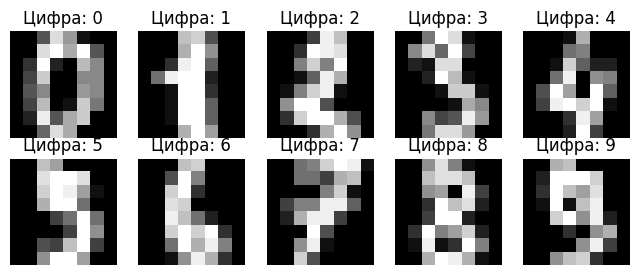

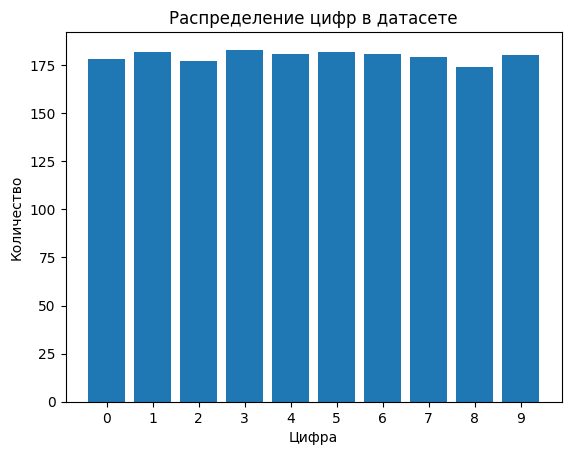

Лучшее значение k-ближайших средних: 3


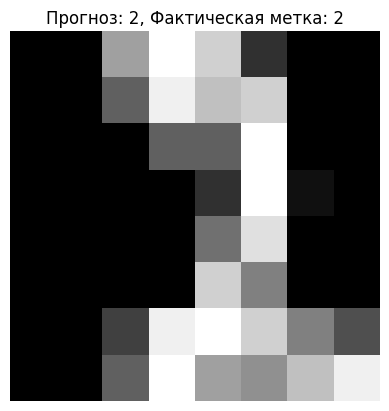

Точность: 0.99
Матрица ошибок:
[[37  0  0  0  0  0  0  0  0  0]
 [ 0 42  0  0  0  1  0  0  0  0]
 [ 0  0 44  0  0  0  0  0  0  0]
 [ 0  0  1 44  0  0  0  0  0  0]
 [ 0  0  0  0 37  0  0  1  0  0]
 [ 0  0  0  0  0 47  0  0  0  1]
 [ 0  0  0  0  0  0 52  0  0  0]
 [ 0  0  0  0  0  0  0 48  0  0]
 [ 0  0  0  2  0  0  0  0 46  0]
 [ 0  0  0  0  0  0  0  0  0 47]]
Отчет о классификации:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        37
           1       1.00      0.98      0.99        43
           2       0.98      1.00      0.99        44
           3       0.96      0.98      0.97        45
           4       1.00      0.97      0.99        38
           5       0.98      0.98      0.98        48
           6       1.00      1.00      1.00        52
           7       0.98      1.00      0.99        48
           8       1.00      0.96      0.98        48
           9       0.98      1.00      0.99        47

    accuracy       

In [ ]:
from sklearn.datasets import load_digits

digits_dataset = load_digits()
print(f"Ключи digits_dataset: \n{digits_dataset.keys()}")

print(digits_dataset['DESCR'][:300])

print(f"Названия ответов: \n{digits_dataset['target_names']}")


chunks = [digits_dataset['feature_names'][i:i + 8] for i in range(0, len(digits_dataset['feature_names']), 8)]
formatted_lines = [' '.join(map(str, chunk)) for chunk in chunks]
result = '\n'.join(formatted_lines)
print(f"Названия признаков: \n{result}")
print(f"Строки из массива data: \n{digits_dataset['data']}")
print(f"Форма миссива data: \n{digits_dataset['data'].shape}")

print(f"Форма массива target: \n{digits_dataset['target'].shape}")
print(f"Ответы: \n{digits_dataset['target']}")
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(digits_dataset['data'], digits_dataset['target'], random_state=0)
print(f"Форма массива x_train: {x_train.shape}")
print(f"Форма массива y_train: {y_train.shape}")
print(f"Форма массива x_test: {x_test.shape}")
print(f"Форма массива y_test: {y_test.shape}")
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
plt.figure(figsize=(8, 8))
for i in range(10):
    plt.subplot(5, 5, i + 1)
    plt.imshow(digits_dataset.data[i].reshape(8, 8), cmap=plt.cm.gray)
    plt.title(f"Цифра: {digits_dataset.target[i]}")
    plt.axis('off')
plt.show()
unique, counts = np.unique(digits_dataset.target, return_counts=True)

plt.bar(unique, counts)
plt.xticks(unique)
plt.xlabel('Цифра')
plt.ylabel('Количество')
plt.title('Распределение цифр в датасете')
plt.show()
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]}
grid_search = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5)
grid_search.fit(x_train, y_train)
best_k = grid_search.best_params_['n_neighbors']

print(f"Лучшее значение k-ближайших средних: {best_k}")
knn = KNeighborsClassifier(n_neighbors=best_k)

knn.fit(x_train, y_train)
import random

random_index = random.randint(0, len(x_test) - 1)
sample = x_test[random_index].reshape(1, -1)
true_label = y_test[random_index]

predicted_label = knn.predict(sample)

plt.imshow(sample.reshape(8, 8), cmap='gray')
plt.title(f"Прогноз: {predicted_label[0]}, Фактическая метка: {true_label}")
plt.axis('off')
plt.show()
from sklearn.metrics import accuracy_score

y_pred = knn.predict(x_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Точность: {accuracy:.2f}")
from sklearn.metrics import confusion_matrix, classification_report

confusion = confusion_matrix(y_test, y_pred)
print('Матрица ошибок:')
print(confusion)

# Отчет о классификации
class_report = classification_report(y_test, y_pred)
print('Отчет о классификации:')
print(class_report)


Ключи digits_dataset: 
dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names'])
.. _wine_dataset:

Wine recognition dataset
------------------------

**Data Set Characteristics:**

:Number of Instances: 178
:Number of Attributes: 13 numeric, predictive attributes and the class
:Attribute Information:
    - Alcohol
    - Malic acid
    - Ash
    - Alcalinity of ash
    - Magnesi
Названия ответов: 
['class_0' 'class_1' 'class_2']
Названия признаков: 
['alcohol', 'malic_acid', 'ash', 'alcalinity_of_ash', 'magnesium', 'total_phenols', 'flavanoids', 'nonflavanoid_phenols', 'proanthocyanins', 'color_intensity', 'hue', 'od280/od315_of_diluted_wines', 'proline']
Строки из массива data: 
[[1.423e+01 1.710e+00 2.430e+00 ... 1.040e+00 3.920e+00 1.065e+03]
 [1.320e+01 1.780e+00 2.140e+00 ... 1.050e+00 3.400e+00 1.050e+03]
 [1.316e+01 2.360e+00 2.670e+00 ... 1.030e+00 3.170e+00 1.185e+03]
 ...
 [1.327e+01 4.280e+00 2.260e+00 ... 5.900e-01 1.560e+00 8.350e+02]
 [1.317e+01 2.5

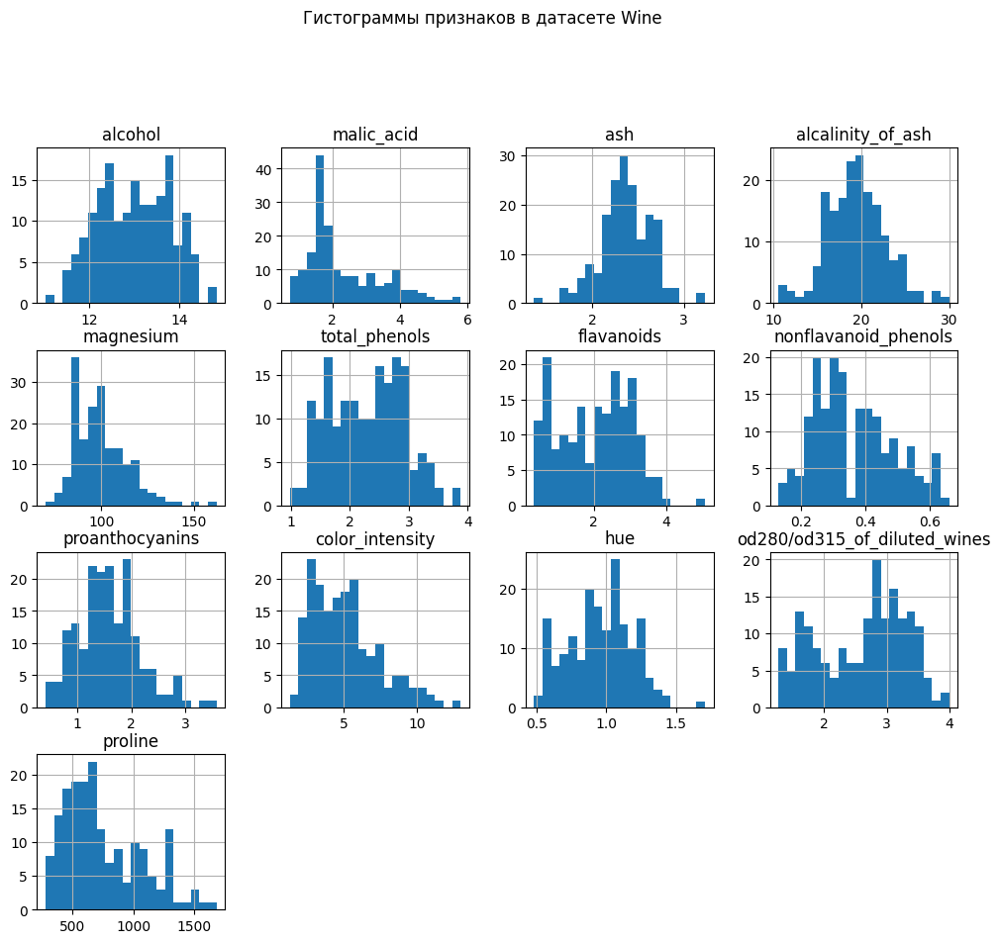

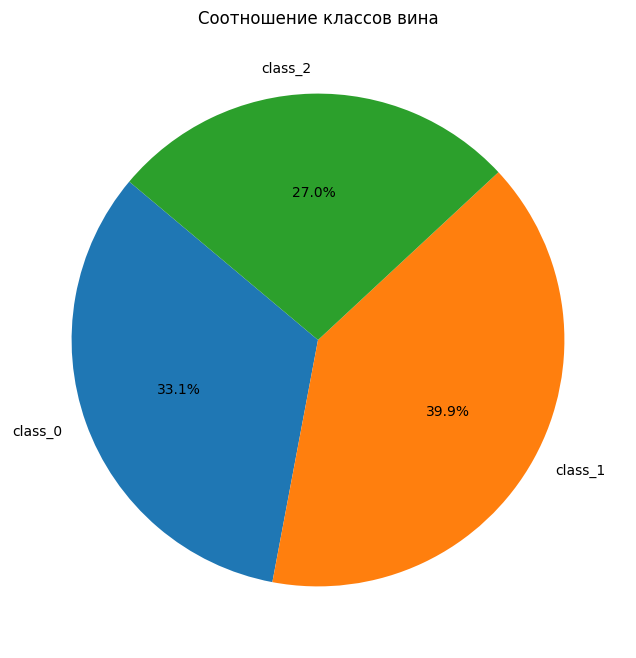

Лучшее значение k-ближайших средних: 1


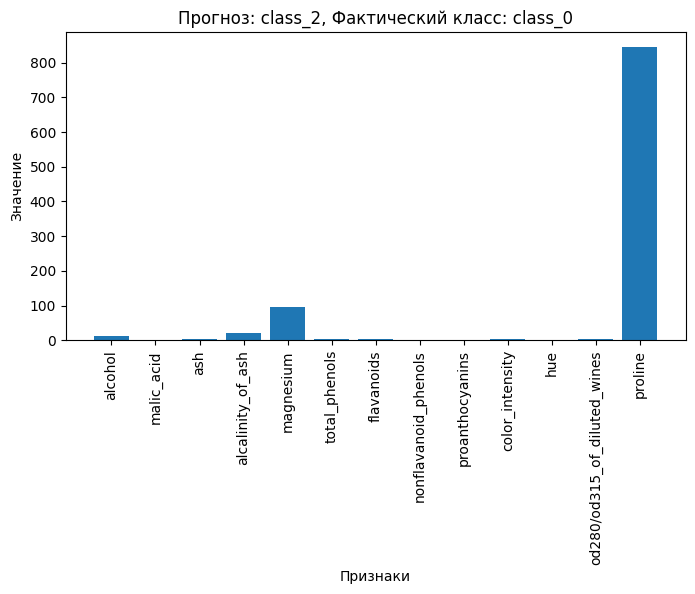

Точность: 0.76
Матрица ошибок:
[[14  1  1]
 [ 1 17  3]
 [ 1  4  3]]
Отчет о классификации:
              precision    recall  f1-score   support

           0       0.88      0.88      0.88        16
           1       0.77      0.81      0.79        21
           2       0.43      0.38      0.40         8

    accuracy                           0.76        45
   macro avg       0.69      0.69      0.69        45
weighted avg       0.75      0.76      0.75        45



In [ ]:
from sklearn.datasets import load_wine
wine_dataset = load_wine()

print(f"Ключи digits_dataset: \n{wine_dataset.keys()}")
print(wine_dataset['DESCR'][:300])

print(f"Названия ответов: \n{wine_dataset['target_names']}")
result = wine_dataset['feature_names']
print(f"Названия признаков: \n{result}")
print(f"Строки из массива data: \n{wine_dataset['data']}")
print(f"Форма миссива data: \n{wine_dataset['data'].shape}")
print(f"Форма массива target: \n{wine_dataset['target'].shape}")
print(f"Ответы: \n{wine_dataset['target']}")
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(wine_dataset['data'], wine_dataset['target'], random_state=0)
print(f"Форма массива x_train: {x_train.shape}")
print(f"Форма массива y_train: {y_train.shape}")
print(f"Форма массива x_test: {x_test.shape}")
print(f"Форма массива y_test: {y_test.shape}")
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
wine_df = pd.DataFrame(data=wine_dataset.data, columns=wine_dataset.feature_names)
wine_df.hist(bins=20, figsize=(12, 10))
plt.suptitle("Гистограммы признаков в датасете Wine", x=0.5, y=1.02)
plt.show()
class_counts = wine_df.groupby(wine_dataset.target).size()

# Названия классов
class_labels = wine_dataset.target_names

# Создание круговой диаграммы
plt.figure(figsize=(8, 8))
plt.pie(class_counts, labels=class_labels, autopct='%1.1f%%', startangle=140)
plt.title("Соотношение классов вина")
plt.show()
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]}
grid_search = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5)
grid_search.fit(x_train, y_train)
best_k = grid_search.best_params_['n_neighbors']

print(f"Лучшее значение k-ближайших средних: {best_k}")
knn = KNeighborsClassifier(n_neighbors=best_k)

knn.fit(x_train, y_train)
import random

random_index = random.randint(0, len(x_test) - 1)
sample = x_test[random_index].reshape(1, -1)
true_label = y_test[random_index]

predicted_label = knn.predict(sample)

plt.figure(figsize=(8, 4))
plt.bar(range(len(sample[0])), sample[0], tick_label=wine_dataset.feature_names)
plt.xlabel("Признаки")
plt.ylabel("Значение")
plt.title(f"Прогноз: {wine_dataset.target_names[predicted_label[0]]}, Фактический класс: {wine_dataset.target_names[true_label]}")
plt.xticks(rotation=90)
plt.show()
from sklearn.metrics import accuracy_score

y_pred = knn.predict(x_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Точность: {accuracy:.2f}")
from sklearn.metrics import confusion_matrix, classification_report

confusion = confusion_matrix(y_test, y_pred)
print('Матрица ошибок:')
print(confusion)

# Отчет о классификации
class_report = classification_report(y_test, y_pred)
print('Отчет о классификации:')
print(class_report)


https://github.com/nikonych/bigData-kol-1/tree/master